In [1]:
import numpy as np

from os import listdir
from os.path import isfile, join
import networkx as nx

import dgl
from dgl.nn import RelGraphConv

import torch
import torch.nn as nn
import torch.nn.functional as F

import numpy as np

from DB.propaganda_db import DB

from dgl.nn import GraphConv, AvgPooling
from dgl.nn.pytorch import Sequential

from dgl.dataloading import GraphDataLoader
from torch.utils.data import Dataset, DataLoader,TensorDataset,random_split,SubsetRandomSampler, ConcatDataset
from sklearn.model_selection import train_test_split

from sklearn.model_selection import KFold, StratifiedKFold

import matplotlib.pyplot as plt

from torch.optim import lr_scheduler

import pickle

from copy import deepcopy

In [2]:
pickle_name = 'nx_url_dataset.pickle'
with open(pickle_name, 'rb') as f:
    train_set, test_set = pickle.load(f)

In [3]:
e_type_to_id = {'title':0, 'link':1}

def add_encoding(dataset):
    for j in range(len(dataset)):
        g = dataset[j][0]
        for e in g.edges:
#             print(g.edges[e[0], e[1]]['link_type'])
            if g.edges[e[0], e[1]]['link_type'] == 'title':
                g.edges[e[0], e[1]]['type'] = 1
                
            else:
                g.edges[e[0], e[1]]['type'] = 0 
                
        
        for i in range(len(g.nodes)):
            g.nodes[i]['h'] = torch.tensor([0., 0., 0.])
            g.nodes[i]['h'][g.nodes[i]['level']] = 1.
    return dataset
train_set = add_encoding(train_set)
test_set = add_encoding(test_set)

In [4]:
train_graphs = [(dgl.from_networkx(g, node_attrs=["h"], edge_attrs=['type']), torch.tensor([l]).float()) for g, l in train_set]
train_labels = [l for _, l in train_set]
test_graphs = [(dgl.from_networkx(g, node_attrs=['h'], edge_attrs=['type']), torch.tensor([l]).float()) for g, l in test_set]
test_labels = [l for _, l in test_set]


In [5]:
class RGCN(nn.Module):
    def __init__(self, hidden_features, dropout, num_edge_types):
        super(RGCN, self).__init__()
        self.in_layer = RelGraphConv(3, hidden_features, num_edge_types, activation=nn.ReLU())
        self.dropout1 = nn.Dropout(dropout)
        self.out_layer = RelGraphConv(hidden_features, hidden_features, 3, activation=nn.ReLU())
        self.dropout2 = nn.Dropout(dropout)
        self.global_mean_pool = dgl.nn.pytorch.glob.AvgPooling()
        
        self.fc = nn.Linear(hidden_features, 1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, g, in_feat, e_types):
        h = self.in_layer(g, in_feat, e_types)
        h = self.dropout1(h)
        h = self.out_layer(g, h, e_types)
        h = self.dropout2(h)
        h = self.global_mean_pool(g, h)
        h = self.fc(h)
        
        return self.sigmoid(h)

In [6]:
def evaluate(model, dataloader):
    model.eval()
    num_correct = 0
    num_tests = 0
    for batched_graph, labels in dataloader:
        pred = torch.round(model(batched_graph, batched_graph.ndata['h'].float(), batched_graph.edata['type']))
        num_correct += (pred==labels).sum().float().item()
        num_tests += len(labels)
    return num_correct / num_tests

def train(model, train_loader, optimizer):
    Loss = nn.BCELoss()
    
    model.train()
    ret_loss = 0
    n_graphs = 0
    for data, target in train_loader:
        output = model(data, data.ndata['h'].float(), data.edata['type'])
        
        loss = Loss(output, target)
        ret_loss += loss.item()/len(target)
        n_graphs += len(target)     
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        return loss.item()
#     return ret_loss/n_graphs

def val_loss(model, loader):
    Loss = nn.BCELoss()
    model.eval()
    ret_loss = 0
    n_graphs = 0
    with torch.no_grad():
        for data, target in train_loader:
            data, target = data.to(device), target.to(device)
            output = model(data, data.ndata['h'].float(), data.edata['type'])
            loss = Loss(output, target)

            return loss.item()
        


In [7]:
splits=StratifiedKFold(n_splits=5,shuffle=True,random_state=42)
split_idxs = splits.split(np.arange(len(train_graphs)), train_labels)

num_epochs=100
from itertools import product
hidden_size = [4, 8, 16, 32, 64]
dropout = [0., 0.3, 0.5, 0.7]
lr = [0.1, 0.05, 0.01, 0.005]

tg = dgl.batch([g for g,_ in train_graphs])
num_edge_types = tg.edata['type'].max().item() +1


model_params = list(product(hidden_size, dropout, lr))

# model_params = [[4, 0., 0.1]]
print(model_params)

[(4, 0.0, 0.1), (4, 0.0, 0.05), (4, 0.0, 0.01), (4, 0.0, 0.005), (4, 0.3, 0.1), (4, 0.3, 0.05), (4, 0.3, 0.01), (4, 0.3, 0.005), (4, 0.5, 0.1), (4, 0.5, 0.05), (4, 0.5, 0.01), (4, 0.5, 0.005), (4, 0.7, 0.1), (4, 0.7, 0.05), (4, 0.7, 0.01), (4, 0.7, 0.005), (8, 0.0, 0.1), (8, 0.0, 0.05), (8, 0.0, 0.01), (8, 0.0, 0.005), (8, 0.3, 0.1), (8, 0.3, 0.05), (8, 0.3, 0.01), (8, 0.3, 0.005), (8, 0.5, 0.1), (8, 0.5, 0.05), (8, 0.5, 0.01), (8, 0.5, 0.005), (8, 0.7, 0.1), (8, 0.7, 0.05), (8, 0.7, 0.01), (8, 0.7, 0.005), (16, 0.0, 0.1), (16, 0.0, 0.05), (16, 0.0, 0.01), (16, 0.0, 0.005), (16, 0.3, 0.1), (16, 0.3, 0.05), (16, 0.3, 0.01), (16, 0.3, 0.005), (16, 0.5, 0.1), (16, 0.5, 0.05), (16, 0.5, 0.01), (16, 0.5, 0.005), (16, 0.7, 0.1), (16, 0.7, 0.05), (16, 0.7, 0.01), (16, 0.7, 0.005), (32, 0.0, 0.1), (32, 0.0, 0.05), (32, 0.0, 0.01), (32, 0.0, 0.005), (32, 0.3, 0.1), (32, 0.3, 0.05), (32, 0.3, 0.01), (32, 0.3, 0.005), (32, 0.5, 0.1), (32, 0.5, 0.05), (32, 0.5, 0.01), (32, 0.5, 0.005), (32, 0.7, 0

In [8]:
# for l in splits.split(np.arange(len(train_graphs)), train_labels):
#     print(train_labels[l])

In [9]:
best_test_acc = 0
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
results = []
for i, (hidden_size, dropout, lr) in enumerate(model_params):
    foldperf = {}
    print(f"model {i}/{len(model_params)}")
    print('Model parameters: hidden_size {}, dropout {}, optimizer lr {}'.format(*model_params[i]))
    model = RGCN(hidden_size, dropout, num_edge_types)
    
    for fold, (train_idx, val_idx) in enumerate(splits.split(np.arange(len(train_graphs)), train_labels)):
        lrs = []


        train_sampler = SubsetRandomSampler(train_idx)
        test_sampler = SubsetRandomSampler(val_idx)
        train_loader = GraphDataLoader(train_graphs, batch_size=1000, sampler=train_sampler)
        test_loader = GraphDataLoader(train_graphs, batch_size=1000, sampler=test_sampler)

        optimizer = torch.optim.Adam(model.parameters(), lr=lr)
        history = {'train_loss': [], 'test_loss': [],'train_acc':[],'test_acc':[]}

        for epoch in range(num_epochs):
            train_loss = train(model,train_loader, optimizer)
            train_acc = evaluate(model, train_loader)
            test_loss = val_loss(model,test_loader)
            test_acc = evaluate(model, test_loader)
            if epoch%10==1:
                print("{} Loss train/val:{:.3f} / {:.3f} Acc train/val {:.2f} / {:.2f} %".format(epoch, train_loss,
                                                                                              test_loss,
                                                                                              100*train_acc,
                                                                                              100*test_acc))

            history['train_loss'].append(train_loss)
            history['test_loss'].append(test_loss)
            history['train_acc'].append(train_acc)
            history['test_acc'].append(test_acc)
        foldperf[f'fold{fold+1}'] = history  
    results.append(foldperf)
#     break


model 0/80
Model parameters: hidden_size 4, dropout 0.0, optimizer lr 0.1
1 Loss train/val:0.681 / 0.680 Acc train/val 52.56 / 52.50 %


C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.632 / 0.626 Acc train/val 64.74 / 47.50 %
21 Loss train/val:0.580 / 0.577 Acc train/val 68.59 / 57.50 %
31 Loss train/val:0.535 / 0.535 Acc train/val 71.79 / 60.00 %
41 Loss train/val:0.516 / 0.507 Acc train/val 71.79 / 60.00 %
51 Loss train/val:0.497 / 0.494 Acc train/val 75.00 / 65.00 %
61 Loss train/val:0.482 / 0.482 Acc train/val 75.64 / 65.00 %
71 Loss train/val:0.477 / 0.476 Acc train/val 76.28 / 67.50 %
81 Loss train/val:0.490 / 0.478 Acc train/val 73.08 / 65.00 %
91 Loss train/val:0.477 / 0.469 Acc train/val 76.28 / 67.50 %
1 Loss train/val:1.257 / 0.655 Acc train/val 61.78 / 51.28 %
11 Loss train/val:0.615 / 0.562 Acc train/val 70.06 / 66.67 %
21 Loss train/val:0.508 / 0.511 Acc train/val 73.25 / 66.67 %
31 Loss train/val:0.509 / 0.507 Acc train/val 73.25 / 69.23 %
41 Loss train/val:0.491 / 0.490 Acc train/val 73.89 / 64.10 %
51 Loss train/val:0.488 / 0.487 Acc train/val 73.89 / 71.79 %
61 Loss train/val:0.484 / 0.484 Acc train/val 74.52 / 64.10 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.625 / 0.619 Acc train/val 67.31 / 52.50 %
21 Loss train/val:0.580 / 0.578 Acc train/val 69.87 / 57.50 %
31 Loss train/val:0.547 / 0.543 Acc train/val 71.15 / 62.50 %
41 Loss train/val:0.523 / 0.521 Acc train/val 71.79 / 60.00 %
51 Loss train/val:0.511 / 0.510 Acc train/val 75.00 / 72.50 %
61 Loss train/val:0.502 / 0.502 Acc train/val 74.36 / 70.00 %
71 Loss train/val:0.494 / 0.493 Acc train/val 74.36 / 67.50 %
81 Loss train/val:0.488 / 0.486 Acc train/val 73.08 / 62.50 %
91 Loss train/val:0.482 / 0.482 Acc train/val 75.00 / 65.00 %
1 Loss train/val:0.568 / 0.522 Acc train/val 70.70 / 69.23 %
11 Loss train/val:0.511 / 0.510 Acc train/val 71.34 / 71.79 %
21 Loss train/val:0.497 / 0.497 Acc train/val 73.25 / 74.36 %
31 Loss train/val:0.490 / 0.490 Acc train/val 73.89 / 71.79 %
41 Loss train/val:0.485 / 0.484 Acc train/val 74.52 / 69.23 %
51 Loss train/val:0.483 / 0.479 Acc train/val 75.16 / 71.79 %
61 Loss train/val:0.477 / 0.476 Acc train/val 74.52 / 69.23 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.692 / 0.691 Acc train/val 51.92 / 52.50 %
21 Loss train/val:0.683 / 0.682 Acc train/val 51.28 / 35.00 %
31 Loss train/val:0.674 / 0.673 Acc train/val 57.69 / 42.50 %
41 Loss train/val:0.665 / 0.665 Acc train/val 58.97 / 45.00 %
51 Loss train/val:0.660 / 0.659 Acc train/val 58.97 / 42.50 %
61 Loss train/val:0.653 / 0.652 Acc train/val 58.97 / 45.00 %
71 Loss train/val:0.644 / 0.643 Acc train/val 58.97 / 45.00 %
81 Loss train/val:0.633 / 0.632 Acc train/val 58.97 / 45.00 %
91 Loss train/val:0.620 / 0.619 Acc train/val 58.97 / 47.50 %
1 Loss train/val:0.623 / 0.621 Acc train/val 56.69 / 56.41 %
11 Loss train/val:0.614 / 0.613 Acc train/val 66.24 / 58.97 %
21 Loss train/val:0.606 / 0.606 Acc train/val 67.52 / 56.41 %
31 Loss train/val:0.600 / 0.599 Acc train/val 70.06 / 64.10 %
41 Loss train/val:0.594 / 0.593 Acc train/val 68.79 / 61.54 %
51 Loss train/val:0.588 / 0.588 Acc train/val 70.06 / 64.10 %
61 Loss train/val:0.584 / 0.584 Acc train/val 70.70 / 64.10 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.664 / 0.663 Acc train/val 64.74 / 62.50 %
21 Loss train/val:0.654 / 0.653 Acc train/val 65.38 / 55.00 %
31 Loss train/val:0.646 / 0.645 Acc train/val 64.74 / 52.50 %
41 Loss train/val:0.638 / 0.637 Acc train/val 64.74 / 52.50 %
51 Loss train/val:0.630 / 0.630 Acc train/val 65.38 / 52.50 %
61 Loss train/val:0.622 / 0.622 Acc train/val 65.38 / 52.50 %
71 Loss train/val:0.614 / 0.613 Acc train/val 65.38 / 52.50 %
81 Loss train/val:0.606 / 0.605 Acc train/val 66.67 / 52.50 %
91 Loss train/val:0.598 / 0.597 Acc train/val 67.95 / 50.00 %
1 Loss train/val:0.602 / 0.601 Acc train/val 65.61 / 56.41 %
11 Loss train/val:0.594 / 0.594 Acc train/val 68.15 / 61.54 %
21 Loss train/val:0.588 / 0.587 Acc train/val 67.52 / 58.97 %
31 Loss train/val:0.582 / 0.581 Acc train/val 67.52 / 58.97 %
41 Loss train/val:0.576 / 0.575 Acc train/val 68.15 / 58.97 %
51 Loss train/val:0.571 / 0.570 Acc train/val 68.79 / 56.41 %
61 Loss train/val:0.566 / 0.565 Acc train/val 69.43 / 58.97 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.627 / 0.618 Acc train/val 69.87 / 55.00 %
21 Loss train/val:0.648 / 0.599 Acc train/val 69.87 / 60.00 %
31 Loss train/val:0.593 / 0.584 Acc train/val 71.79 / 60.00 %
41 Loss train/val:0.599 / 0.575 Acc train/val 71.15 / 60.00 %
51 Loss train/val:0.640 / 0.575 Acc train/val 71.79 / 60.00 %
61 Loss train/val:0.667 / 0.596 Acc train/val 68.59 / 57.50 %
71 Loss train/val:0.581 / 0.571 Acc train/val 71.79 / 60.00 %
81 Loss train/val:0.617 / 0.575 Acc train/val 69.87 / 60.00 %
91 Loss train/val:0.631 / 0.583 Acc train/val 71.79 / 62.50 %
1 Loss train/val:0.609 / 0.592 Acc train/val 68.15 / 64.10 %
11 Loss train/val:0.637 / 0.593 Acc train/val 66.88 / 64.10 %
21 Loss train/val:0.606 / 0.589 Acc train/val 69.43 / 69.23 %
31 Loss train/val:0.613 / 0.585 Acc train/val 70.06 / 66.67 %
41 Loss train/val:0.617 / 0.579 Acc train/val 68.79 / 64.10 %
51 Loss train/val:0.609 / 0.565 Acc train/val 73.25 / 64.10 %
61 Loss train/val:0.604 / 0.579 Acc train/val 67.52 / 58.97 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.688 / 0.687 Acc train/val 51.92 / 52.50 %
21 Loss train/val:0.681 / 0.676 Acc train/val 66.03 / 52.50 %
31 Loss train/val:0.648 / 0.639 Acc train/val 66.03 / 55.00 %
41 Loss train/val:0.642 / 0.608 Acc train/val 64.74 / 55.00 %
51 Loss train/val:0.629 / 0.613 Acc train/val 65.38 / 55.00 %
61 Loss train/val:0.637 / 0.609 Acc train/val 64.74 / 57.50 %
71 Loss train/val:0.633 / 0.607 Acc train/val 66.67 / 55.00 %
81 Loss train/val:0.624 / 0.607 Acc train/val 65.38 / 55.00 %
91 Loss train/val:0.602 / 0.602 Acc train/val 65.38 / 55.00 %
1 Loss train/val:0.640 / 0.604 Acc train/val 63.69 / 56.41 %
11 Loss train/val:0.608 / 0.614 Acc train/val 65.61 / 53.85 %
21 Loss train/val:0.599 / 0.603 Acc train/val 64.97 / 61.54 %
31 Loss train/val:0.618 / 0.600 Acc train/val 67.52 / 58.97 %
41 Loss train/val:0.608 / 0.590 Acc train/val 67.52 / 58.97 %
51 Loss train/val:0.621 / 0.590 Acc train/val 66.88 / 53.85 %
61 Loss train/val:0.615 / 0.593 Acc train/val 69.43 / 56.41 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.674 / 0.672 Acc train/val 61.54 / 60.00 %
21 Loss train/val:0.670 / 0.668 Acc train/val 58.33 / 52.50 %
31 Loss train/val:0.663 / 0.666 Acc train/val 58.33 / 52.50 %
41 Loss train/val:0.661 / 0.662 Acc train/val 58.97 / 52.50 %
51 Loss train/val:0.655 / 0.654 Acc train/val 58.97 / 52.50 %
61 Loss train/val:0.650 / 0.641 Acc train/val 63.46 / 55.00 %
71 Loss train/val:0.637 / 0.626 Acc train/val 64.74 / 52.50 %
81 Loss train/val:0.637 / 0.620 Acc train/val 66.03 / 52.50 %
91 Loss train/val:0.617 / 0.617 Acc train/val 64.74 / 52.50 %
1 Loss train/val:0.641 / 0.623 Acc train/val 65.61 / 53.85 %
11 Loss train/val:0.643 / 0.626 Acc train/val 64.33 / 56.41 %
21 Loss train/val:0.616 / 0.624 Acc train/val 66.88 / 58.97 %
31 Loss train/val:0.629 / 0.621 Acc train/val 68.15 / 58.97 %
41 Loss train/val:0.635 / 0.618 Acc train/val 67.52 / 58.97 %
51 Loss train/val:0.657 / 0.617 Acc train/val 66.24 / 56.41 %
61 Loss train/val:0.627 / 0.617 Acc train/val 66.88 / 58.97 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.687 / 0.678 Acc train/val 58.97 / 47.50 %
21 Loss train/val:0.672 / 0.672 Acc train/val 59.62 / 47.50 %
31 Loss train/val:0.659 / 0.665 Acc train/val 59.62 / 45.00 %
41 Loss train/val:0.663 / 0.660 Acc train/val 58.97 / 45.00 %
51 Loss train/val:0.660 / 0.655 Acc train/val 59.62 / 45.00 %
61 Loss train/val:0.653 / 0.650 Acc train/val 59.62 / 45.00 %
71 Loss train/val:0.653 / 0.643 Acc train/val 60.26 / 42.50 %
81 Loss train/val:0.641 / 0.639 Acc train/val 61.54 / 50.00 %
91 Loss train/val:0.654 / 0.633 Acc train/val 64.10 / 50.00 %
1 Loss train/val:0.656 / 0.641 Acc train/val 62.42 / 56.41 %
11 Loss train/val:0.648 / 0.639 Acc train/val 63.69 / 56.41 %
21 Loss train/val:0.661 / 0.637 Acc train/val 64.33 / 58.97 %
31 Loss train/val:0.653 / 0.636 Acc train/val 63.06 / 56.41 %
41 Loss train/val:0.671 / 0.635 Acc train/val 63.06 / 56.41 %
51 Loss train/val:0.653 / 0.632 Acc train/val 64.33 / 58.97 %
61 Loss train/val:0.645 / 0.631 Acc train/val 64.97 / 58.97 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.675 / 0.680 Acc train/val 51.92 / 52.50 %
21 Loss train/val:0.678 / 0.672 Acc train/val 59.62 / 52.50 %
31 Loss train/val:0.673 / 0.667 Acc train/val 60.26 / 40.00 %
41 Loss train/val:0.654 / 0.653 Acc train/val 64.74 / 52.50 %
51 Loss train/val:0.663 / 0.662 Acc train/val 69.23 / 55.00 %
61 Loss train/val:0.666 / 0.649 Acc train/val 65.38 / 52.50 %
71 Loss train/val:0.648 / 0.646 Acc train/val 66.67 / 52.50 %
81 Loss train/val:0.663 / 0.655 Acc train/val 63.46 / 57.50 %
91 Loss train/val:0.650 / 0.637 Acc train/val 67.95 / 55.00 %
1 Loss train/val:0.656 / 0.640 Acc train/val 66.88 / 61.54 %
11 Loss train/val:0.658 / 0.628 Acc train/val 66.88 / 61.54 %
21 Loss train/val:0.639 / 0.633 Acc train/val 66.88 / 56.41 %
31 Loss train/val:0.645 / 0.635 Acc train/val 61.15 / 56.41 %
41 Loss train/val:0.646 / 0.647 Acc train/val 58.60 / 58.97 %
51 Loss train/val:0.665 / 0.624 Acc train/val 63.69 / 56.41 %
61 Loss train/val:0.639 / 0.631 Acc train/val 65.61 / 53.85 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.686 / 0.682 Acc train/val 58.97 / 40.00 %
21 Loss train/val:0.659 / 0.648 Acc train/val 63.46 / 52.50 %
31 Loss train/val:0.645 / 0.640 Acc train/val 63.46 / 47.50 %
41 Loss train/val:0.649 / 0.632 Acc train/val 64.10 / 50.00 %
51 Loss train/val:0.670 / 0.615 Acc train/val 64.10 / 52.50 %
61 Loss train/val:0.651 / 0.620 Acc train/val 65.38 / 55.00 %
71 Loss train/val:0.659 / 0.619 Acc train/val 66.03 / 55.00 %
81 Loss train/val:0.644 / 0.612 Acc train/val 65.38 / 52.50 %
91 Loss train/val:0.626 / 0.601 Acc train/val 66.67 / 55.00 %
1 Loss train/val:0.622 / 0.625 Acc train/val 67.52 / 56.41 %
11 Loss train/val:0.614 / 0.618 Acc train/val 64.97 / 61.54 %
21 Loss train/val:0.640 / 0.627 Acc train/val 64.97 / 56.41 %
31 Loss train/val:0.647 / 0.617 Acc train/val 68.15 / 69.23 %
41 Loss train/val:0.637 / 0.615 Acc train/val 68.79 / 58.97 %
51 Loss train/val:0.617 / 0.600 Acc train/val 67.52 / 58.97 %
61 Loss train/val:0.646 / 0.605 Acc train/val 68.15 / 64.10 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.680 / 0.677 Acc train/val 64.74 / 55.00 %
21 Loss train/val:0.655 / 0.666 Acc train/val 60.26 / 50.00 %
31 Loss train/val:0.647 / 0.659 Acc train/val 64.10 / 52.50 %
41 Loss train/val:0.676 / 0.656 Acc train/val 58.33 / 52.50 %
51 Loss train/val:0.660 / 0.654 Acc train/val 58.97 / 52.50 %
61 Loss train/val:0.659 / 0.651 Acc train/val 58.33 / 52.50 %
71 Loss train/val:0.653 / 0.647 Acc train/val 62.82 / 57.50 %
81 Loss train/val:0.642 / 0.643 Acc train/val 63.46 / 52.50 %
91 Loss train/val:0.625 / 0.638 Acc train/val 63.46 / 52.50 %
1 Loss train/val:0.665 / 0.641 Acc train/val 63.69 / 53.85 %
11 Loss train/val:0.653 / 0.644 Acc train/val 64.97 / 56.41 %
21 Loss train/val:0.634 / 0.642 Acc train/val 65.61 / 56.41 %
31 Loss train/val:0.646 / 0.637 Acc train/val 65.61 / 58.97 %
41 Loss train/val:0.633 / 0.633 Acc train/val 65.61 / 53.85 %
51 Loss train/val:0.649 / 0.631 Acc train/val 64.97 / 56.41 %
61 Loss train/val:0.652 / 0.631 Acc train/val 66.88 / 58.97 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.724 / 0.711 Acc train/val 51.92 / 52.50 %
21 Loss train/val:0.710 / 0.701 Acc train/val 51.92 / 52.50 %
31 Loss train/val:0.703 / 0.694 Acc train/val 51.92 / 52.50 %
41 Loss train/val:0.700 / 0.688 Acc train/val 51.92 / 52.50 %
51 Loss train/val:0.680 / 0.682 Acc train/val 51.92 / 52.50 %
61 Loss train/val:0.680 / 0.677 Acc train/val 51.92 / 52.50 %
71 Loss train/val:0.677 / 0.673 Acc train/val 51.92 / 52.50 %
81 Loss train/val:0.676 / 0.670 Acc train/val 51.92 / 42.50 %
91 Loss train/val:0.666 / 0.667 Acc train/val 58.33 / 47.50 %
1 Loss train/val:0.667 / 0.666 Acc train/val 59.87 / 51.28 %
11 Loss train/val:0.665 / 0.664 Acc train/val 59.24 / 48.72 %
21 Loss train/val:0.658 / 0.663 Acc train/val 59.24 / 48.72 %
31 Loss train/val:0.674 / 0.662 Acc train/val 59.24 / 48.72 %
41 Loss train/val:0.660 / 0.661 Acc train/val 59.24 / 48.72 %
51 Loss train/val:0.659 / 0.661 Acc train/val 59.24 / 48.72 %
61 Loss train/val:0.665 / 0.660 Acc train/val 59.24 / 48.72 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.680 / 0.675 Acc train/val 51.92 / 52.50 %
21 Loss train/val:0.677 / 0.679 Acc train/val 59.62 / 52.50 %
31 Loss train/val:0.683 / 0.670 Acc train/val 58.33 / 52.50 %
41 Loss train/val:0.674 / 0.669 Acc train/val 58.33 / 52.50 %
51 Loss train/val:0.671 / 0.668 Acc train/val 58.33 / 52.50 %
61 Loss train/val:0.678 / 0.669 Acc train/val 58.33 / 52.50 %
71 Loss train/val:0.674 / 0.667 Acc train/val 58.33 / 52.50 %
81 Loss train/val:0.674 / 0.667 Acc train/val 58.33 / 52.50 %
91 Loss train/val:0.673 / 0.670 Acc train/val 58.33 / 52.50 %
1 Loss train/val:0.675 / 0.666 Acc train/val 59.24 / 51.28 %
11 Loss train/val:0.684 / 0.667 Acc train/val 59.24 / 48.72 %
21 Loss train/val:0.666 / 0.667 Acc train/val 59.24 / 51.28 %
31 Loss train/val:0.664 / 0.666 Acc train/val 59.24 / 51.28 %
41 Loss train/val:0.659 / 0.674 Acc train/val 59.87 / 51.28 %
51 Loss train/val:0.662 / 0.667 Acc train/val 59.87 / 53.85 %
61 Loss train/val:0.665 / 0.667 Acc train/val 59.87 / 51.28 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.687 / 0.670 Acc train/val 64.10 / 70.00 %
21 Loss train/val:0.673 / 0.664 Acc train/val 58.33 / 52.50 %
31 Loss train/val:0.658 / 0.668 Acc train/val 58.97 / 52.50 %
41 Loss train/val:0.676 / 0.658 Acc train/val 58.97 / 52.50 %
51 Loss train/val:0.657 / 0.659 Acc train/val 58.97 / 52.50 %
61 Loss train/val:0.682 / 0.667 Acc train/val 58.97 / 52.50 %
71 Loss train/val:0.649 / 0.659 Acc train/val 58.97 / 52.50 %
81 Loss train/val:0.664 / 0.660 Acc train/val 65.38 / 55.00 %
91 Loss train/val:0.657 / 0.661 Acc train/val 58.33 / 52.50 %
1 Loss train/val:0.684 / 0.658 Acc train/val 59.24 / 48.72 %
11 Loss train/val:0.659 / 0.657 Acc train/val 66.24 / 61.54 %
21 Loss train/val:0.683 / 0.653 Acc train/val 59.24 / 51.28 %
31 Loss train/val:0.662 / 0.660 Acc train/val 59.24 / 51.28 %
41 Loss train/val:0.683 / 0.658 Acc train/val 59.24 / 51.28 %
51 Loss train/val:0.680 / 0.664 Acc train/val 59.24 / 48.72 %
61 Loss train/val:0.663 / 0.664 Acc train/val 59.24 / 51.28 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.693 / 0.692 Acc train/val 54.49 / 57.50 %
21 Loss train/val:0.686 / 0.689 Acc train/val 57.05 / 50.00 %
31 Loss train/val:0.689 / 0.686 Acc train/val 59.62 / 47.50 %
41 Loss train/val:0.688 / 0.682 Acc train/val 58.33 / 55.00 %
51 Loss train/val:0.671 / 0.677 Acc train/val 58.97 / 42.50 %
61 Loss train/val:0.675 / 0.670 Acc train/val 58.33 / 47.50 %
71 Loss train/val:0.660 / 0.667 Acc train/val 59.62 / 52.50 %
81 Loss train/val:0.663 / 0.664 Acc train/val 58.33 / 52.50 %
91 Loss train/val:0.673 / 0.663 Acc train/val 58.33 / 52.50 %
1 Loss train/val:0.677 / 0.663 Acc train/val 59.24 / 48.72 %
11 Loss train/val:0.681 / 0.664 Acc train/val 59.24 / 48.72 %
21 Loss train/val:0.673 / 0.664 Acc train/val 59.24 / 48.72 %
31 Loss train/val:0.673 / 0.663 Acc train/val 59.24 / 48.72 %
41 Loss train/val:0.664 / 0.663 Acc train/val 59.24 / 48.72 %
51 Loss train/val:0.674 / 0.661 Acc train/val 59.24 / 48.72 %
61 Loss train/val:0.672 / 0.662 Acc train/val 59.24 / 48.72 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.718 / 0.699 Acc train/val 51.92 / 52.50 %
21 Loss train/val:0.682 / 0.694 Acc train/val 51.92 / 52.50 %
31 Loss train/val:0.702 / 0.691 Acc train/val 51.92 / 52.50 %
41 Loss train/val:0.692 / 0.690 Acc train/val 51.92 / 52.50 %
51 Loss train/val:0.688 / 0.689 Acc train/val 51.28 / 42.50 %
61 Loss train/val:0.693 / 0.688 Acc train/val 51.92 / 45.00 %
71 Loss train/val:0.688 / 0.687 Acc train/val 52.56 / 42.50 %
81 Loss train/val:0.689 / 0.686 Acc train/val 51.92 / 45.00 %
91 Loss train/val:0.681 / 0.685 Acc train/val 52.56 / 45.00 %
1 Loss train/val:0.699 / 0.686 Acc train/val 56.69 / 53.85 %
11 Loss train/val:0.691 / 0.685 Acc train/val 51.59 / 53.85 %
21 Loss train/val:0.681 / 0.683 Acc train/val 51.59 / 53.85 %
31 Loss train/val:0.678 / 0.680 Acc train/val 56.05 / 51.28 %
41 Loss train/val:0.685 / 0.676 Acc train/val 61.78 / 56.41 %
51 Loss train/val:0.669 / 0.674 Acc train/val 64.97 / 53.85 %
61 Loss train/val:0.673 / 0.670 Acc train/val 64.97 / 53.85 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.623 / 0.617 Acc train/val 68.59 / 52.50 %
21 Loss train/val:0.574 / 0.570 Acc train/val 69.87 / 57.50 %
31 Loss train/val:0.557 / 0.555 Acc train/val 69.87 / 57.50 %
41 Loss train/val:0.549 / 0.549 Acc train/val 72.44 / 60.00 %
51 Loss train/val:0.542 / 0.541 Acc train/val 72.44 / 60.00 %
61 Loss train/val:0.534 / 0.536 Acc train/val 73.08 / 57.50 %
71 Loss train/val:0.532 / 0.530 Acc train/val 73.08 / 57.50 %
81 Loss train/val:0.521 / 0.523 Acc train/val 73.08 / 60.00 %
91 Loss train/val:0.520 / 0.517 Acc train/val 73.72 / 60.00 %
1 Loss train/val:0.603 / 0.618 Acc train/val 64.33 / 58.97 %
11 Loss train/val:0.558 / 0.558 Acc train/val 70.70 / 69.23 %
21 Loss train/val:0.550 / 0.548 Acc train/val 72.61 / 69.23 %
31 Loss train/val:0.540 / 0.540 Acc train/val 70.70 / 66.67 %
41 Loss train/val:0.529 / 0.529 Acc train/val 71.97 / 66.67 %
51 Loss train/val:0.525 / 0.527 Acc train/val 70.06 / 66.67 %
61 Loss train/val:0.523 / 0.523 Acc train/val 71.34 / 66.67 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.630 / 0.624 Acc train/val 68.59 / 50.00 %
21 Loss train/val:0.574 / 0.570 Acc train/val 69.87 / 60.00 %
31 Loss train/val:0.534 / 0.531 Acc train/val 71.15 / 62.50 %
41 Loss train/val:0.510 / 0.508 Acc train/val 72.44 / 55.00 %
51 Loss train/val:0.493 / 0.491 Acc train/val 74.36 / 65.00 %
61 Loss train/val:0.488 / 0.487 Acc train/val 75.00 / 67.50 %
71 Loss train/val:0.482 / 0.481 Acc train/val 75.00 / 65.00 %
81 Loss train/val:0.479 / 0.479 Acc train/val 75.64 / 67.50 %
91 Loss train/val:0.477 / 0.476 Acc train/val 75.00 / 67.50 %
1 Loss train/val:0.777 / 0.587 Acc train/val 68.15 / 69.23 %
11 Loss train/val:0.530 / 0.526 Acc train/val 64.97 / 66.67 %
21 Loss train/val:0.515 / 0.512 Acc train/val 71.34 / 69.23 %
31 Loss train/val:0.505 / 0.504 Acc train/val 74.52 / 76.92 %
41 Loss train/val:0.496 / 0.495 Acc train/val 71.97 / 69.23 %
51 Loss train/val:0.489 / 0.489 Acc train/val 72.61 / 71.79 %
61 Loss train/val:0.485 / 0.484 Acc train/val 73.89 / 71.79 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.675 / 0.673 Acc train/val 58.97 / 47.50 %
21 Loss train/val:0.656 / 0.655 Acc train/val 62.18 / 47.50 %
31 Loss train/val:0.643 / 0.642 Acc train/val 62.18 / 47.50 %
41 Loss train/val:0.625 / 0.623 Acc train/val 66.67 / 52.50 %
51 Loss train/val:0.604 / 0.602 Acc train/val 66.67 / 55.00 %
61 Loss train/val:0.586 / 0.584 Acc train/val 66.03 / 55.00 %
71 Loss train/val:0.567 / 0.565 Acc train/val 66.67 / 50.00 %
81 Loss train/val:0.550 / 0.549 Acc train/val 67.31 / 52.50 %
91 Loss train/val:0.535 / 0.534 Acc train/val 68.59 / 62.50 %
1 Loss train/val:0.561 / 0.559 Acc train/val 70.70 / 71.79 %
11 Loss train/val:0.546 / 0.544 Acc train/val 71.97 / 76.92 %
21 Loss train/val:0.536 / 0.534 Acc train/val 70.70 / 74.36 %
31 Loss train/val:0.526 / 0.525 Acc train/val 71.34 / 76.92 %
41 Loss train/val:0.518 / 0.517 Acc train/val 72.61 / 76.92 %
51 Loss train/val:0.511 / 0.510 Acc train/val 73.89 / 76.92 %
61 Loss train/val:0.505 / 0.504 Acc train/val 73.89 / 76.92 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.683 / 0.682 Acc train/val 56.41 / 57.50 %
21 Loss train/val:0.670 / 0.668 Acc train/val 64.10 / 55.00 %
31 Loss train/val:0.654 / 0.652 Acc train/val 64.10 / 52.50 %
41 Loss train/val:0.635 / 0.634 Acc train/val 63.46 / 50.00 %
51 Loss train/val:0.620 / 0.619 Acc train/val 64.10 / 52.50 %
61 Loss train/val:0.608 / 0.607 Acc train/val 65.38 / 52.50 %
71 Loss train/val:0.596 / 0.594 Acc train/val 66.67 / 52.50 %
81 Loss train/val:0.583 / 0.581 Acc train/val 66.03 / 55.00 %
91 Loss train/val:0.570 / 0.569 Acc train/val 66.67 / 55.00 %
1 Loss train/val:0.583 / 0.582 Acc train/val 68.79 / 66.67 %
11 Loss train/val:0.576 / 0.575 Acc train/val 69.43 / 69.23 %
21 Loss train/val:0.568 / 0.567 Acc train/val 68.79 / 71.79 %
31 Loss train/val:0.561 / 0.561 Acc train/val 69.43 / 71.79 %
41 Loss train/val:0.555 / 0.554 Acc train/val 70.06 / 71.79 %
51 Loss train/val:0.549 / 0.549 Acc train/val 70.70 / 71.79 %
61 Loss train/val:0.544 / 0.544 Acc train/val 70.70 / 74.36 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.616 / 0.614 Acc train/val 66.67 / 57.50 %
21 Loss train/val:0.613 / 0.587 Acc train/val 65.38 / 55.00 %
31 Loss train/val:0.598 / 0.583 Acc train/val 70.51 / 60.00 %
41 Loss train/val:0.611 / 0.572 Acc train/val 68.59 / 57.50 %
51 Loss train/val:0.573 / 0.551 Acc train/val 69.23 / 55.00 %
61 Loss train/val:0.567 / 0.541 Acc train/val 69.23 / 52.50 %
71 Loss train/val:0.552 / 0.536 Acc train/val 67.31 / 57.50 %
81 Loss train/val:0.572 / 0.528 Acc train/val 72.44 / 55.00 %
91 Loss train/val:0.596 / 0.529 Acc train/val 69.87 / 57.50 %
1 Loss train/val:0.663 / 0.559 Acc train/val 66.88 / 61.54 %
11 Loss train/val:0.620 / 0.580 Acc train/val 69.43 / 66.67 %
21 Loss train/val:0.604 / 0.570 Acc train/val 68.79 / 69.23 %
31 Loss train/val:0.586 / 0.581 Acc train/val 68.15 / 69.23 %
41 Loss train/val:0.581 / 0.562 Acc train/val 68.79 / 69.23 %
51 Loss train/val:0.586 / 0.563 Acc train/val 68.15 / 69.23 %
61 Loss train/val:0.584 / 0.558 Acc train/val 66.88 / 61.54 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.659 / 0.638 Acc train/val 65.38 / 50.00 %
21 Loss train/val:0.641 / 0.614 Acc train/val 66.03 / 55.00 %
31 Loss train/val:0.614 / 0.602 Acc train/val 66.03 / 57.50 %
41 Loss train/val:0.604 / 0.594 Acc train/val 68.59 / 60.00 %
51 Loss train/val:0.614 / 0.579 Acc train/val 71.79 / 57.50 %
61 Loss train/val:0.600 / 0.583 Acc train/val 70.51 / 52.50 %
71 Loss train/val:0.618 / 0.565 Acc train/val 67.95 / 52.50 %
81 Loss train/val:0.642 / 0.570 Acc train/val 69.87 / 55.00 %
91 Loss train/val:0.577 / 0.564 Acc train/val 69.87 / 57.50 %
1 Loss train/val:0.619 / 0.587 Acc train/val 67.52 / 64.10 %
11 Loss train/val:0.593 / 0.565 Acc train/val 69.43 / 69.23 %
21 Loss train/val:0.589 / 0.573 Acc train/val 71.34 / 69.23 %
31 Loss train/val:0.580 / 0.566 Acc train/val 69.43 / 69.23 %
41 Loss train/val:0.566 / 0.558 Acc train/val 73.25 / 71.79 %
51 Loss train/val:0.542 / 0.549 Acc train/val 71.97 / 69.23 %
61 Loss train/val:0.621 / 0.553 Acc train/val 71.97 / 69.23 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.675 / 0.670 Acc train/val 61.54 / 42.50 %
21 Loss train/val:0.646 / 0.655 Acc train/val 58.97 / 45.00 %
31 Loss train/val:0.675 / 0.642 Acc train/val 64.74 / 47.50 %
41 Loss train/val:0.674 / 0.636 Acc train/val 65.38 / 50.00 %
51 Loss train/val:0.654 / 0.626 Acc train/val 64.74 / 50.00 %
61 Loss train/val:0.628 / 0.619 Acc train/val 67.31 / 52.50 %
71 Loss train/val:0.616 / 0.612 Acc train/val 67.95 / 50.00 %
81 Loss train/val:0.635 / 0.604 Acc train/val 67.31 / 52.50 %
91 Loss train/val:0.625 / 0.595 Acc train/val 67.31 / 50.00 %
1 Loss train/val:0.627 / 0.604 Acc train/val 70.70 / 58.97 %
11 Loss train/val:0.615 / 0.605 Acc train/val 66.24 / 53.85 %
21 Loss train/val:0.622 / 0.600 Acc train/val 65.61 / 56.41 %
31 Loss train/val:0.620 / 0.594 Acc train/val 70.70 / 58.97 %
41 Loss train/val:0.600 / 0.589 Acc train/val 66.24 / 58.97 %
51 Loss train/val:0.641 / 0.587 Acc train/val 66.88 / 61.54 %
61 Loss train/val:0.632 / 0.587 Acc train/val 67.52 / 69.23 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.686 / 0.679 Acc train/val 51.92 / 52.50 %
21 Loss train/val:0.671 / 0.667 Acc train/val 58.97 / 45.00 %
31 Loss train/val:0.651 / 0.655 Acc train/val 63.46 / 50.00 %
41 Loss train/val:0.645 / 0.645 Acc train/val 63.46 / 50.00 %
51 Loss train/val:0.651 / 0.639 Acc train/val 65.38 / 50.00 %
61 Loss train/val:0.641 / 0.634 Acc train/val 65.38 / 50.00 %
71 Loss train/val:0.614 / 0.629 Acc train/val 66.03 / 50.00 %
81 Loss train/val:0.636 / 0.624 Acc train/val 66.03 / 52.50 %
91 Loss train/val:0.627 / 0.619 Acc train/val 65.38 / 55.00 %
1 Loss train/val:0.635 / 0.626 Acc train/val 65.61 / 53.85 %
11 Loss train/val:0.628 / 0.624 Acc train/val 64.97 / 53.85 %
21 Loss train/val:0.639 / 0.621 Acc train/val 64.33 / 56.41 %
31 Loss train/val:0.646 / 0.620 Acc train/val 64.33 / 56.41 %
41 Loss train/val:0.629 / 0.617 Acc train/val 64.97 / 56.41 %
51 Loss train/val:0.644 / 0.614 Acc train/val 65.61 / 53.85 %
61 Loss train/val:0.621 / 0.612 Acc train/val 64.33 / 56.41 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.690 / 0.655 Acc train/val 60.26 / 52.50 %
21 Loss train/val:0.649 / 0.625 Acc train/val 63.46 / 57.50 %
31 Loss train/val:0.624 / 0.608 Acc train/val 69.23 / 60.00 %
41 Loss train/val:0.632 / 0.595 Acc train/val 66.67 / 57.50 %
51 Loss train/val:0.616 / 0.584 Acc train/val 67.31 / 55.00 %
61 Loss train/val:0.663 / 0.583 Acc train/val 71.15 / 57.50 %
71 Loss train/val:0.619 / 0.592 Acc train/val 70.51 / 57.50 %
81 Loss train/val:0.583 / 0.572 Acc train/val 71.79 / 57.50 %
91 Loss train/val:0.624 / 0.583 Acc train/val 70.51 / 57.50 %
1 Loss train/val:0.637 / 0.600 Acc train/val 66.88 / 66.67 %
11 Loss train/val:0.667 / 0.608 Acc train/val 66.24 / 56.41 %
21 Loss train/val:0.622 / 0.609 Acc train/val 69.43 / 61.54 %
31 Loss train/val:0.611 / 0.612 Acc train/val 69.43 / 61.54 %
41 Loss train/val:0.633 / 0.618 Acc train/val 66.24 / 64.10 %
51 Loss train/val:0.629 / 0.587 Acc train/val 69.43 / 64.10 %
61 Loss train/val:0.617 / 0.601 Acc train/val 68.79 / 61.54 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.658 / 0.647 Acc train/val 64.10 / 55.00 %
21 Loss train/val:0.650 / 0.639 Acc train/val 64.10 / 57.50 %
31 Loss train/val:0.637 / 0.616 Acc train/val 66.67 / 55.00 %
41 Loss train/val:0.636 / 0.596 Acc train/val 67.31 / 57.50 %
51 Loss train/val:0.614 / 0.595 Acc train/val 67.31 / 57.50 %
61 Loss train/val:0.605 / 0.579 Acc train/val 66.67 / 57.50 %
71 Loss train/val:0.594 / 0.579 Acc train/val 66.67 / 67.50 %
81 Loss train/val:0.587 / 0.570 Acc train/val 69.23 / 62.50 %
91 Loss train/val:0.621 / 0.566 Acc train/val 66.03 / 57.50 %
1 Loss train/val:0.634 / 0.601 Acc train/val 66.88 / 58.97 %
11 Loss train/val:0.646 / 0.597 Acc train/val 69.43 / 61.54 %
21 Loss train/val:0.598 / 0.585 Acc train/val 66.88 / 64.10 %
31 Loss train/val:0.632 / 0.568 Acc train/val 70.06 / 69.23 %
41 Loss train/val:0.612 / 0.577 Acc train/val 72.61 / 71.79 %
51 Loss train/val:0.608 / 0.572 Acc train/val 65.61 / 66.67 %
61 Loss train/val:0.613 / 0.574 Acc train/val 67.52 / 61.54 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.689 / 0.671 Acc train/val 61.54 / 45.00 %
21 Loss train/val:0.675 / 0.664 Acc train/val 57.69 / 42.50 %
31 Loss train/val:0.677 / 0.661 Acc train/val 58.97 / 47.50 %
41 Loss train/val:0.652 / 0.659 Acc train/val 58.97 / 52.50 %
51 Loss train/val:0.658 / 0.657 Acc train/val 58.33 / 47.50 %
61 Loss train/val:0.667 / 0.655 Acc train/val 62.18 / 47.50 %
71 Loss train/val:0.649 / 0.653 Acc train/val 58.97 / 40.00 %
81 Loss train/val:0.670 / 0.650 Acc train/val 60.26 / 47.50 %
91 Loss train/val:0.645 / 0.648 Acc train/val 60.26 / 50.00 %
1 Loss train/val:0.663 / 0.654 Acc train/val 61.78 / 53.85 %
11 Loss train/val:0.661 / 0.653 Acc train/val 63.06 / 53.85 %
21 Loss train/val:0.654 / 0.649 Acc train/val 63.69 / 53.85 %
31 Loss train/val:0.657 / 0.646 Acc train/val 64.97 / 56.41 %
41 Loss train/val:0.644 / 0.643 Acc train/val 64.97 / 56.41 %
51 Loss train/val:0.658 / 0.640 Acc train/val 64.97 / 56.41 %
61 Loss train/val:0.645 / 0.635 Acc train/val 64.33 / 58.97 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.684 / 0.676 Acc train/val 51.92 / 52.50 %
21 Loss train/val:0.673 / 0.674 Acc train/val 51.92 / 52.50 %
31 Loss train/val:0.684 / 0.666 Acc train/val 58.97 / 45.00 %
41 Loss train/val:0.683 / 0.663 Acc train/val 57.69 / 42.50 %
51 Loss train/val:0.681 / 0.663 Acc train/val 58.97 / 45.00 %
61 Loss train/val:0.671 / 0.662 Acc train/val 58.97 / 45.00 %
71 Loss train/val:0.674 / 0.657 Acc train/val 58.33 / 40.00 %
81 Loss train/val:0.663 / 0.654 Acc train/val 57.69 / 40.00 %
91 Loss train/val:0.668 / 0.652 Acc train/val 60.26 / 47.50 %
1 Loss train/val:0.661 / 0.657 Acc train/val 59.24 / 51.28 %
11 Loss train/val:0.664 / 0.654 Acc train/val 62.42 / 53.85 %
21 Loss train/val:0.652 / 0.653 Acc train/val 63.69 / 53.85 %
31 Loss train/val:0.664 / 0.650 Acc train/val 64.33 / 53.85 %
41 Loss train/val:0.688 / 0.648 Acc train/val 65.61 / 53.85 %
51 Loss train/val:0.653 / 0.644 Acc train/val 65.61 / 53.85 %
61 Loss train/val:0.648 / 0.640 Acc train/val 65.61 / 53.85 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.668 / 0.671 Acc train/val 58.33 / 52.50 %
21 Loss train/val:0.665 / 0.669 Acc train/val 59.62 / 50.00 %
31 Loss train/val:0.684 / 0.672 Acc train/val 58.97 / 50.00 %
41 Loss train/val:0.662 / 0.664 Acc train/val 58.97 / 50.00 %
51 Loss train/val:0.650 / 0.654 Acc train/val 62.82 / 55.00 %
61 Loss train/val:0.659 / 0.653 Acc train/val 62.82 / 57.50 %
71 Loss train/val:0.650 / 0.652 Acc train/val 66.67 / 57.50 %
81 Loss train/val:0.661 / 0.636 Acc train/val 63.46 / 52.50 %
91 Loss train/val:0.653 / 0.641 Acc train/val 66.03 / 55.00 %
1 Loss train/val:0.656 / 0.657 Acc train/val 59.24 / 56.41 %
11 Loss train/val:0.657 / 0.649 Acc train/val 59.87 / 61.54 %
21 Loss train/val:0.656 / 0.665 Acc train/val 54.14 / 51.28 %
31 Loss train/val:0.649 / 0.664 Acc train/val 53.50 / 56.41 %
41 Loss train/val:0.635 / 0.656 Acc train/val 54.78 / 51.28 %
51 Loss train/val:0.632 / 0.636 Acc train/val 60.51 / 64.10 %
61 Loss train/val:0.653 / 0.651 Acc train/val 57.96 / 56.41 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.692 / 0.662 Acc train/val 58.33 / 52.50 %
21 Loss train/val:0.671 / 0.661 Acc train/val 58.33 / 52.50 %
31 Loss train/val:0.676 / 0.652 Acc train/val 58.33 / 52.50 %
41 Loss train/val:0.682 / 0.650 Acc train/val 58.33 / 52.50 %
51 Loss train/val:0.654 / 0.642 Acc train/val 63.46 / 52.50 %
61 Loss train/val:0.651 / 0.640 Acc train/val 62.82 / 55.00 %
71 Loss train/val:0.675 / 0.632 Acc train/val 64.10 / 52.50 %
81 Loss train/val:0.649 / 0.641 Acc train/val 60.26 / 50.00 %
91 Loss train/val:0.669 / 0.638 Acc train/val 67.95 / 57.50 %
1 Loss train/val:0.654 / 0.635 Acc train/val 66.88 / 61.54 %
11 Loss train/val:0.669 / 0.636 Acc train/val 65.61 / 64.10 %
21 Loss train/val:0.645 / 0.644 Acc train/val 63.06 / 58.97 %
31 Loss train/val:0.634 / 0.627 Acc train/val 64.97 / 58.97 %
41 Loss train/val:0.649 / 0.639 Acc train/val 67.52 / 58.97 %
51 Loss train/val:0.638 / 0.638 Acc train/val 67.52 / 61.54 %
61 Loss train/val:0.632 / 0.629 Acc train/val 65.61 / 64.10 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.688 / 0.676 Acc train/val 52.56 / 52.50 %
21 Loss train/val:0.671 / 0.669 Acc train/val 60.26 / 50.00 %
31 Loss train/val:0.681 / 0.658 Acc train/val 63.46 / 50.00 %
41 Loss train/val:0.667 / 0.654 Acc train/val 64.74 / 57.50 %
51 Loss train/val:0.668 / 0.651 Acc train/val 60.26 / 55.00 %
61 Loss train/val:0.655 / 0.651 Acc train/val 60.26 / 52.50 %
71 Loss train/val:0.688 / 0.649 Acc train/val 66.03 / 57.50 %
81 Loss train/val:0.645 / 0.649 Acc train/val 64.10 / 55.00 %
91 Loss train/val:0.666 / 0.646 Acc train/val 66.67 / 57.50 %
1 Loss train/val:0.658 / 0.650 Acc train/val 65.61 / 58.97 %
11 Loss train/val:0.655 / 0.650 Acc train/val 59.87 / 53.85 %
21 Loss train/val:0.648 / 0.652 Acc train/val 59.87 / 53.85 %
31 Loss train/val:0.656 / 0.652 Acc train/val 59.87 / 53.85 %
41 Loss train/val:0.671 / 0.654 Acc train/val 59.24 / 53.85 %
51 Loss train/val:0.651 / 0.649 Acc train/val 65.61 / 56.41 %
61 Loss train/val:0.664 / 0.650 Acc train/val 61.15 / 53.85 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.721 / 0.693 Acc train/val 51.28 / 50.00 %
21 Loss train/val:0.704 / 0.687 Acc train/val 58.97 / 60.00 %
31 Loss train/val:0.679 / 0.684 Acc train/val 58.33 / 52.50 %
41 Loss train/val:0.674 / 0.682 Acc train/val 60.26 / 50.00 %
51 Loss train/val:0.680 / 0.678 Acc train/val 60.26 / 50.00 %
61 Loss train/val:0.669 / 0.673 Acc train/val 60.90 / 47.50 %
71 Loss train/val:0.674 / 0.669 Acc train/val 60.26 / 47.50 %
81 Loss train/val:0.675 / 0.664 Acc train/val 58.97 / 47.50 %
91 Loss train/val:0.665 / 0.660 Acc train/val 60.26 / 47.50 %
1 Loss train/val:0.677 / 0.663 Acc train/val 58.60 / 48.72 %
11 Loss train/val:0.670 / 0.664 Acc train/val 60.51 / 53.85 %
21 Loss train/val:0.671 / 0.662 Acc train/val 62.42 / 53.85 %
31 Loss train/val:0.679 / 0.659 Acc train/val 63.06 / 53.85 %
41 Loss train/val:0.652 / 0.658 Acc train/val 63.69 / 51.28 %
51 Loss train/val:0.660 / 0.656 Acc train/val 59.24 / 48.72 %
61 Loss train/val:0.661 / 0.656 Acc train/val 59.24 / 48.72 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.613 / 0.606 Acc train/val 70.51 / 52.50 %
21 Loss train/val:0.554 / 0.549 Acc train/val 67.95 / 55.00 %
31 Loss train/val:0.525 / 0.523 Acc train/val 73.72 / 65.00 %
41 Loss train/val:0.504 / 0.507 Acc train/val 71.15 / 57.50 %
51 Loss train/val:0.514 / 0.511 Acc train/val 74.36 / 70.00 %
61 Loss train/val:0.480 / 0.489 Acc train/val 69.87 / 57.50 %
71 Loss train/val:0.469 / 0.467 Acc train/val 74.36 / 65.00 %
81 Loss train/val:0.457 / 0.456 Acc train/val 76.92 / 65.00 %
91 Loss train/val:0.448 / 0.445 Acc train/val 77.56 / 65.00 %
1 Loss train/val:1.108 / 0.592 Acc train/val 64.33 / 66.67 %
11 Loss train/val:0.518 / 0.542 Acc train/val 71.34 / 66.67 %
21 Loss train/val:0.473 / 0.472 Acc train/val 75.16 / 74.36 %
31 Loss train/val:0.468 / 0.465 Acc train/val 77.07 / 74.36 %
41 Loss train/val:0.458 / 0.456 Acc train/val 75.16 / 76.92 %
51 Loss train/val:0.452 / 0.452 Acc train/val 73.89 / 71.79 %
61 Loss train/val:0.445 / 0.444 Acc train/val 77.71 / 74.36 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.618 / 0.607 Acc train/val 68.59 / 47.50 %
21 Loss train/val:0.543 / 0.535 Acc train/val 70.51 / 60.00 %
31 Loss train/val:0.498 / 0.502 Acc train/val 73.08 / 70.00 %
41 Loss train/val:0.482 / 0.483 Acc train/val 76.28 / 62.50 %
51 Loss train/val:0.472 / 0.470 Acc train/val 74.36 / 62.50 %
61 Loss train/val:0.464 / 0.463 Acc train/val 74.36 / 62.50 %
71 Loss train/val:0.454 / 0.454 Acc train/val 76.28 / 60.00 %
81 Loss train/val:0.454 / 0.447 Acc train/val 75.64 / 62.50 %
91 Loss train/val:0.443 / 0.442 Acc train/val 75.64 / 62.50 %
1 Loss train/val:0.746 / 0.752 Acc train/val 59.87 / 58.97 %
11 Loss train/val:0.513 / 0.514 Acc train/val 73.89 / 64.10 %
21 Loss train/val:0.470 / 0.467 Acc train/val 73.25 / 74.36 %
31 Loss train/val:0.462 / 0.462 Acc train/val 76.43 / 71.79 %
41 Loss train/val:0.455 / 0.455 Acc train/val 73.89 / 74.36 %
51 Loss train/val:0.451 / 0.450 Acc train/val 74.52 / 74.36 %
61 Loss train/val:0.446 / 0.446 Acc train/val 75.80 / 74.36 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.636 / 0.633 Acc train/val 64.74 / 52.50 %
21 Loss train/val:0.603 / 0.601 Acc train/val 66.67 / 52.50 %
31 Loss train/val:0.578 / 0.575 Acc train/val 67.95 / 52.50 %
41 Loss train/val:0.554 / 0.551 Acc train/val 67.31 / 57.50 %
51 Loss train/val:0.533 / 0.531 Acc train/val 66.67 / 55.00 %
61 Loss train/val:0.517 / 0.516 Acc train/val 68.59 / 62.50 %
71 Loss train/val:0.504 / 0.503 Acc train/val 69.23 / 65.00 %
81 Loss train/val:0.495 / 0.496 Acc train/val 71.79 / 60.00 %
91 Loss train/val:0.488 / 0.487 Acc train/val 72.44 / 60.00 %
1 Loss train/val:0.571 / 0.539 Acc train/val 68.15 / 74.36 %
11 Loss train/val:0.514 / 0.515 Acc train/val 71.97 / 74.36 %
21 Loss train/val:0.509 / 0.509 Acc train/val 75.16 / 71.79 %
31 Loss train/val:0.503 / 0.503 Acc train/val 75.16 / 74.36 %
41 Loss train/val:0.499 / 0.499 Acc train/val 75.16 / 74.36 %
51 Loss train/val:0.495 / 0.495 Acc train/val 74.52 / 71.79 %
61 Loss train/val:0.492 / 0.492 Acc train/val 73.89 / 71.79 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.668 / 0.666 Acc train/val 57.69 / 42.50 %
21 Loss train/val:0.654 / 0.653 Acc train/val 58.97 / 42.50 %
31 Loss train/val:0.644 / 0.643 Acc train/val 59.62 / 42.50 %
41 Loss train/val:0.631 / 0.629 Acc train/val 62.18 / 50.00 %
51 Loss train/val:0.613 / 0.610 Acc train/val 62.18 / 47.50 %
61 Loss train/val:0.589 / 0.587 Acc train/val 67.31 / 50.00 %
71 Loss train/val:0.565 / 0.563 Acc train/val 67.31 / 52.50 %
81 Loss train/val:0.544 / 0.542 Acc train/val 67.95 / 52.50 %
91 Loss train/val:0.527 / 0.526 Acc train/val 70.51 / 60.00 %
1 Loss train/val:0.564 / 0.562 Acc train/val 70.06 / 71.79 %
11 Loss train/val:0.548 / 0.548 Acc train/val 69.43 / 76.92 %
21 Loss train/val:0.543 / 0.542 Acc train/val 70.06 / 71.79 %
31 Loss train/val:0.539 / 0.538 Acc train/val 70.70 / 74.36 %
41 Loss train/val:0.534 / 0.533 Acc train/val 73.25 / 74.36 %
51 Loss train/val:0.529 / 0.528 Acc train/val 73.25 / 74.36 %
61 Loss train/val:0.525 / 0.524 Acc train/val 73.25 / 74.36 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.665 / 0.660 Acc train/val 59.62 / 50.00 %
21 Loss train/val:0.622 / 0.614 Acc train/val 66.67 / 52.50 %
31 Loss train/val:0.572 / 0.569 Acc train/val 68.59 / 55.00 %
41 Loss train/val:0.567 / 0.548 Acc train/val 70.51 / 57.50 %
51 Loss train/val:0.570 / 0.541 Acc train/val 69.23 / 57.50 %
61 Loss train/val:0.568 / 0.544 Acc train/val 69.23 / 60.00 %
71 Loss train/val:0.557 / 0.542 Acc train/val 70.51 / 60.00 %
81 Loss train/val:0.558 / 0.531 Acc train/val 70.51 / 60.00 %
91 Loss train/val:0.553 / 0.522 Acc train/val 70.51 / 60.00 %
1 Loss train/val:0.568 / 0.558 Acc train/val 68.79 / 69.23 %
11 Loss train/val:0.597 / 0.557 Acc train/val 66.88 / 66.67 %
21 Loss train/val:0.609 / 0.538 Acc train/val 70.06 / 69.23 %
31 Loss train/val:0.553 / 0.546 Acc train/val 69.43 / 64.10 %
41 Loss train/val:0.560 / 0.534 Acc train/val 70.06 / 61.54 %
51 Loss train/val:0.548 / 0.529 Acc train/val 67.52 / 66.67 %
61 Loss train/val:0.577 / 0.531 Acc train/val 70.70 / 64.10 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.638 / 0.630 Acc train/val 64.74 / 50.00 %
21 Loss train/val:0.625 / 0.599 Acc train/val 67.95 / 52.50 %
31 Loss train/val:0.621 / 0.579 Acc train/val 69.23 / 57.50 %
41 Loss train/val:0.565 / 0.560 Acc train/val 68.59 / 57.50 %
51 Loss train/val:0.599 / 0.533 Acc train/val 72.44 / 57.50 %
61 Loss train/val:0.580 / 0.534 Acc train/val 71.79 / 67.50 %
71 Loss train/val:0.540 / 0.525 Acc train/val 70.51 / 55.00 %
81 Loss train/val:0.549 / 0.525 Acc train/val 70.51 / 62.50 %
91 Loss train/val:0.583 / 0.523 Acc train/val 70.51 / 52.50 %
1 Loss train/val:0.574 / 0.558 Acc train/val 64.97 / 61.54 %
11 Loss train/val:0.570 / 0.541 Acc train/val 68.79 / 61.54 %
21 Loss train/val:0.561 / 0.536 Acc train/val 69.43 / 66.67 %
31 Loss train/val:0.566 / 0.515 Acc train/val 73.89 / 71.79 %
41 Loss train/val:0.512 / 0.505 Acc train/val 74.52 / 76.92 %
51 Loss train/val:0.545 / 0.499 Acc train/val 74.52 / 74.36 %
61 Loss train/val:0.532 / 0.499 Acc train/val 73.89 / 71.79 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.669 / 0.659 Acc train/val 59.62 / 42.50 %
21 Loss train/val:0.663 / 0.646 Acc train/val 60.26 / 47.50 %
31 Loss train/val:0.617 / 0.633 Acc train/val 62.82 / 50.00 %
41 Loss train/val:0.617 / 0.618 Acc train/val 65.38 / 50.00 %
51 Loss train/val:0.626 / 0.600 Acc train/val 66.67 / 52.50 %
61 Loss train/val:0.596 / 0.582 Acc train/val 66.67 / 52.50 %
71 Loss train/val:0.587 / 0.571 Acc train/val 69.23 / 55.00 %
81 Loss train/val:0.574 / 0.561 Acc train/val 70.51 / 62.50 %
91 Loss train/val:0.591 / 0.554 Acc train/val 68.59 / 55.00 %
1 Loss train/val:0.600 / 0.565 Acc train/val 70.70 / 76.92 %
11 Loss train/val:0.600 / 0.560 Acc train/val 70.70 / 71.79 %
21 Loss train/val:0.583 / 0.556 Acc train/val 68.79 / 74.36 %
31 Loss train/val:0.584 / 0.554 Acc train/val 70.06 / 71.79 %
41 Loss train/val:0.569 / 0.551 Acc train/val 71.97 / 76.92 %
51 Loss train/val:0.568 / 0.543 Acc train/val 70.06 / 76.92 %
61 Loss train/val:0.573 / 0.546 Acc train/val 71.97 / 74.36 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.670 / 0.666 Acc train/val 58.97 / 45.00 %
21 Loss train/val:0.667 / 0.657 Acc train/val 58.97 / 47.50 %
31 Loss train/val:0.641 / 0.652 Acc train/val 64.10 / 50.00 %
41 Loss train/val:0.639 / 0.647 Acc train/val 62.18 / 47.50 %
51 Loss train/val:0.650 / 0.642 Acc train/val 58.97 / 47.50 %
61 Loss train/val:0.636 / 0.637 Acc train/val 64.10 / 50.00 %
71 Loss train/val:0.637 / 0.629 Acc train/val 65.38 / 52.50 %
81 Loss train/val:0.648 / 0.621 Acc train/val 65.38 / 52.50 %
91 Loss train/val:0.635 / 0.612 Acc train/val 66.03 / 52.50 %
1 Loss train/val:0.618 / 0.617 Acc train/val 66.88 / 56.41 %
11 Loss train/val:0.617 / 0.611 Acc train/val 65.61 / 56.41 %
21 Loss train/val:0.606 / 0.605 Acc train/val 65.61 / 56.41 %
31 Loss train/val:0.602 / 0.598 Acc train/val 66.24 / 56.41 %
41 Loss train/val:0.619 / 0.594 Acc train/val 65.61 / 56.41 %
51 Loss train/val:0.586 / 0.589 Acc train/val 65.61 / 56.41 %
61 Loss train/val:0.569 / 0.582 Acc train/val 68.79 / 58.97 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.670 / 0.664 Acc train/val 58.97 / 52.50 %
21 Loss train/val:0.679 / 0.682 Acc train/val 60.26 / 50.00 %
31 Loss train/val:0.662 / 0.643 Acc train/val 63.46 / 57.50 %
41 Loss train/val:0.653 / 0.633 Acc train/val 64.74 / 47.50 %
51 Loss train/val:0.648 / 0.611 Acc train/val 69.23 / 50.00 %
61 Loss train/val:0.632 / 0.610 Acc train/val 70.51 / 55.00 %
71 Loss train/val:0.636 / 0.597 Acc train/val 69.23 / 55.00 %
81 Loss train/val:0.594 / 0.598 Acc train/val 67.95 / 55.00 %
91 Loss train/val:0.612 / 0.583 Acc train/val 70.51 / 57.50 %
1 Loss train/val:0.702 / 0.597 Acc train/val 69.43 / 64.10 %
11 Loss train/val:0.693 / 0.615 Acc train/val 66.88 / 58.97 %
21 Loss train/val:0.650 / 0.605 Acc train/val 69.43 / 66.67 %
31 Loss train/val:0.573 / 0.588 Acc train/val 70.70 / 66.67 %
41 Loss train/val:0.591 / 0.580 Acc train/val 71.34 / 66.67 %
51 Loss train/val:0.577 / 0.579 Acc train/val 70.70 / 64.10 %
61 Loss train/val:0.635 / 0.584 Acc train/val 68.15 / 61.54 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.662 / 0.640 Acc train/val 64.74 / 52.50 %
21 Loss train/val:0.606 / 0.602 Acc train/val 66.03 / 52.50 %
31 Loss train/val:0.590 / 0.590 Acc train/val 67.31 / 47.50 %
41 Loss train/val:0.609 / 0.582 Acc train/val 66.67 / 55.00 %
51 Loss train/val:0.559 / 0.558 Acc train/val 68.59 / 50.00 %
61 Loss train/val:0.583 / 0.559 Acc train/val 68.59 / 65.00 %
71 Loss train/val:0.588 / 0.558 Acc train/val 68.59 / 57.50 %
81 Loss train/val:0.561 / 0.547 Acc train/val 70.51 / 60.00 %
91 Loss train/val:0.583 / 0.529 Acc train/val 69.87 / 57.50 %
1 Loss train/val:1.208 / 0.575 Acc train/val 70.06 / 69.23 %
11 Loss train/val:0.568 / 0.550 Acc train/val 70.06 / 66.67 %
21 Loss train/val:0.587 / 0.537 Acc train/val 70.06 / 69.23 %
31 Loss train/val:0.576 / 0.552 Acc train/val 70.70 / 64.10 %
41 Loss train/val:0.572 / 0.553 Acc train/val 67.52 / 56.41 %
51 Loss train/val:0.579 / 0.530 Acc train/val 73.25 / 71.79 %
61 Loss train/val:0.576 / 0.540 Acc train/val 73.89 / 71.79 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.671 / 0.667 Acc train/val 58.97 / 45.00 %
21 Loss train/val:0.663 / 0.655 Acc train/val 58.97 / 40.00 %
31 Loss train/val:0.652 / 0.648 Acc train/val 59.62 / 47.50 %
41 Loss train/val:0.654 / 0.641 Acc train/val 59.62 / 50.00 %
51 Loss train/val:0.646 / 0.633 Acc train/val 62.82 / 50.00 %
61 Loss train/val:0.637 / 0.627 Acc train/val 62.82 / 50.00 %
71 Loss train/val:0.615 / 0.619 Acc train/val 62.82 / 50.00 %
81 Loss train/val:0.648 / 0.608 Acc train/val 65.38 / 52.50 %
91 Loss train/val:0.631 / 0.603 Acc train/val 66.03 / 52.50 %
1 Loss train/val:0.612 / 0.608 Acc train/val 64.97 / 56.41 %
11 Loss train/val:0.624 / 0.606 Acc train/val 65.61 / 56.41 %
21 Loss train/val:0.608 / 0.605 Acc train/val 68.15 / 64.10 %
31 Loss train/val:0.641 / 0.601 Acc train/val 68.79 / 64.10 %
41 Loss train/val:0.641 / 0.598 Acc train/val 65.61 / 56.41 %
51 Loss train/val:0.627 / 0.595 Acc train/val 64.97 / 56.41 %
61 Loss train/val:0.613 / 0.591 Acc train/val 70.70 / 61.54 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.681 / 0.666 Acc train/val 60.26 / 55.00 %
21 Loss train/val:0.657 / 0.658 Acc train/val 63.46 / 50.00 %
31 Loss train/val:0.654 / 0.655 Acc train/val 59.62 / 52.50 %
41 Loss train/val:0.672 / 0.652 Acc train/val 66.03 / 57.50 %
51 Loss train/val:0.656 / 0.648 Acc train/val 65.38 / 50.00 %
61 Loss train/val:0.647 / 0.645 Acc train/val 63.46 / 50.00 %
71 Loss train/val:0.655 / 0.642 Acc train/val 65.38 / 50.00 %
81 Loss train/val:0.627 / 0.637 Acc train/val 64.74 / 52.50 %
91 Loss train/val:0.656 / 0.630 Acc train/val 67.31 / 47.50 %
1 Loss train/val:0.651 / 0.637 Acc train/val 66.24 / 56.41 %
11 Loss train/val:0.621 / 0.632 Acc train/val 66.24 / 56.41 %
21 Loss train/val:0.622 / 0.628 Acc train/val 66.24 / 56.41 %
31 Loss train/val:0.623 / 0.624 Acc train/val 66.24 / 53.85 %
41 Loss train/val:0.635 / 0.621 Acc train/val 66.24 / 53.85 %
51 Loss train/val:0.645 / 0.617 Acc train/val 66.88 / 53.85 %
61 Loss train/val:0.651 / 0.614 Acc train/val 66.24 / 56.41 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.692 / 0.681 Acc train/val 59.62 / 52.50 %
21 Loss train/val:0.674 / 0.669 Acc train/val 58.33 / 52.50 %
31 Loss train/val:0.644 / 0.663 Acc train/val 57.05 / 50.00 %
41 Loss train/val:0.663 / 0.648 Acc train/val 67.31 / 55.00 %
51 Loss train/val:0.660 / 0.650 Acc train/val 64.10 / 55.00 %
61 Loss train/val:0.656 / 0.636 Acc train/val 64.74 / 52.50 %
71 Loss train/val:0.616 / 0.609 Acc train/val 66.67 / 52.50 %
81 Loss train/val:0.637 / 0.619 Acc train/val 66.03 / 52.50 %
91 Loss train/val:0.638 / 0.619 Acc train/val 67.95 / 55.00 %
1 Loss train/val:0.684 / 0.618 Acc train/val 66.24 / 56.41 %
11 Loss train/val:0.690 / 0.636 Acc train/val 62.42 / 51.28 %
21 Loss train/val:0.680 / 0.648 Acc train/val 68.15 / 53.85 %
31 Loss train/val:0.657 / 0.641 Acc train/val 68.15 / 61.54 %
41 Loss train/val:0.628 / 0.635 Acc train/val 62.42 / 58.97 %
51 Loss train/val:0.641 / 0.649 Acc train/val 62.42 / 58.97 %
61 Loss train/val:0.703 / 0.632 Acc train/val 68.79 / 58.97 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.664 / 0.663 Acc train/val 58.33 / 52.50 %
21 Loss train/val:0.681 / 0.663 Acc train/val 58.97 / 50.00 %
31 Loss train/val:0.666 / 0.652 Acc train/val 58.97 / 52.50 %
41 Loss train/val:0.661 / 0.655 Acc train/val 64.10 / 57.50 %
51 Loss train/val:0.640 / 0.639 Acc train/val 64.10 / 50.00 %
61 Loss train/val:0.650 / 0.641 Acc train/val 61.54 / 57.50 %
71 Loss train/val:0.649 / 0.633 Acc train/val 63.46 / 55.00 %
81 Loss train/val:0.644 / 0.632 Acc train/val 66.03 / 55.00 %
91 Loss train/val:0.639 / 0.626 Acc train/val 68.59 / 55.00 %
1 Loss train/val:0.651 / 0.627 Acc train/val 66.88 / 58.97 %
11 Loss train/val:0.655 / 0.629 Acc train/val 64.33 / 56.41 %
21 Loss train/val:0.643 / 0.640 Acc train/val 63.69 / 56.41 %
31 Loss train/val:0.649 / 0.643 Acc train/val 64.97 / 56.41 %
41 Loss train/val:0.630 / 0.632 Acc train/val 67.52 / 64.10 %
51 Loss train/val:0.630 / 0.634 Acc train/val 64.33 / 58.97 %
61 Loss train/val:0.634 / 0.639 Acc train/val 66.24 / 53.85 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.682 / 0.680 Acc train/val 51.92 / 50.00 %
21 Loss train/val:0.680 / 0.673 Acc train/val 58.33 / 60.00 %
31 Loss train/val:0.667 / 0.670 Acc train/val 58.97 / 52.50 %
41 Loss train/val:0.669 / 0.663 Acc train/val 58.97 / 52.50 %
51 Loss train/val:0.676 / 0.659 Acc train/val 64.74 / 57.50 %
61 Loss train/val:0.658 / 0.658 Acc train/val 58.97 / 52.50 %
71 Loss train/val:0.663 / 0.656 Acc train/val 58.97 / 52.50 %
81 Loss train/val:0.658 / 0.654 Acc train/val 58.97 / 52.50 %
91 Loss train/val:0.676 / 0.650 Acc train/val 60.26 / 52.50 %
1 Loss train/val:0.661 / 0.655 Acc train/val 62.42 / 51.28 %
11 Loss train/val:0.662 / 0.657 Acc train/val 59.24 / 48.72 %
21 Loss train/val:0.664 / 0.655 Acc train/val 59.24 / 48.72 %
31 Loss train/val:0.660 / 0.651 Acc train/val 60.51 / 48.72 %
41 Loss train/val:0.643 / 0.645 Acc train/val 64.97 / 58.97 %
51 Loss train/val:0.662 / 0.643 Acc train/val 65.61 / 58.97 %
61 Loss train/val:0.644 / 0.644 Acc train/val 64.33 / 56.41 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


11 Loss train/val:0.680 / 0.684 Acc train/val 51.92 / 52.50 %
21 Loss train/val:0.683 / 0.681 Acc train/val 51.92 / 52.50 %
31 Loss train/val:0.659 / 0.675 Acc train/val 57.05 / 55.00 %
41 Loss train/val:0.667 / 0.670 Acc train/val 57.69 / 42.50 %
51 Loss train/val:0.661 / 0.665 Acc train/val 57.69 / 40.00 %
61 Loss train/val:0.675 / 0.661 Acc train/val 59.62 / 47.50 %
71 Loss train/val:0.653 / 0.658 Acc train/val 59.62 / 47.50 %
81 Loss train/val:0.649 / 0.656 Acc train/val 63.46 / 50.00 %
91 Loss train/val:0.655 / 0.654 Acc train/val 64.10 / 50.00 %
1 Loss train/val:0.666 / 0.659 Acc train/val 62.42 / 56.41 %
11 Loss train/val:0.675 / 0.658 Acc train/val 63.69 / 53.85 %
21 Loss train/val:0.661 / 0.658 Acc train/val 59.24 / 48.72 %
31 Loss train/val:0.663 / 0.656 Acc train/val 59.24 / 48.72 %
41 Loss train/val:0.676 / 0.654 Acc train/val 65.61 / 56.41 %
51 Loss train/val:0.646 / 0.653 Acc train/val 63.06 / 53.85 %
61 Loss train/val:0.660 / 0.650 Acc train/val 64.33 / 56.41 %
71 Loss t

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


1 Loss train/val:1.363 / 0.673 Acc train/val 58.97 / 45.00 %
11 Loss train/val:0.625 / 0.615 Acc train/val 64.74 / 55.00 %
21 Loss train/val:0.571 / 0.564 Acc train/val 66.67 / 57.50 %
31 Loss train/val:0.532 / 0.526 Acc train/val 69.87 / 65.00 %
41 Loss train/val:0.573 / 0.511 Acc train/val 73.08 / 62.50 %
51 Loss train/val:0.505 / 0.514 Acc train/val 70.51 / 52.50 %
61 Loss train/val:0.498 / 0.502 Acc train/val 73.72 / 65.00 %
71 Loss train/val:0.493 / 0.492 Acc train/val 70.51 / 60.00 %
81 Loss train/val:0.485 / 0.484 Acc train/val 73.72 / 60.00 %
91 Loss train/val:0.479 / 0.479 Acc train/val 73.72 / 62.50 %
1 Loss train/val:1.363 / 0.773 Acc train/val 64.33 / 61.54 %
11 Loss train/val:0.531 / 0.533 Acc train/val 71.34 / 71.79 %
21 Loss train/val:0.530 / 0.523 Acc train/val 70.70 / 66.67 %
31 Loss train/val:0.516 / 0.517 Acc train/val 73.89 / 64.10 %
41 Loss train/val:0.505 / 0.505 Acc train/val 73.89 / 69.23 %
51 Loss train/val:0.497 / 0.496 Acc train/val 74.52 / 69.23 %
61 Loss tr

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


1 Loss train/val:0.752 / 0.660 Acc train/val 58.97 / 45.00 %
11 Loss train/val:0.639 / 0.636 Acc train/val 65.38 / 50.00 %
21 Loss train/val:0.570 / 0.561 Acc train/val 69.23 / 52.50 %
31 Loss train/val:0.514 / 0.512 Acc train/val 72.44 / 57.50 %
41 Loss train/val:0.491 / 0.491 Acc train/val 71.79 / 60.00 %
51 Loss train/val:0.478 / 0.478 Acc train/val 75.64 / 65.00 %
61 Loss train/val:0.469 / 0.469 Acc train/val 75.00 / 65.00 %
71 Loss train/val:0.460 / 0.461 Acc train/val 76.28 / 65.00 %
81 Loss train/val:0.458 / 0.454 Acc train/val 76.28 / 70.00 %
91 Loss train/val:0.449 / 0.449 Acc train/val 75.64 / 65.00 %
1 Loss train/val:0.691 / 0.714 Acc train/val 63.69 / 69.23 %
11 Loss train/val:0.489 / 0.478 Acc train/val 73.89 / 76.92 %
21 Loss train/val:0.469 / 0.461 Acc train/val 74.52 / 76.92 %
31 Loss train/val:0.458 / 0.455 Acc train/val 71.97 / 79.49 %
41 Loss train/val:0.453 / 0.449 Acc train/val 76.43 / 71.79 %
51 Loss train/val:0.442 / 0.441 Acc train/val 76.43 / 71.79 %
61 Loss tr

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


1 Loss train/val:0.688 / 0.677 Acc train/val 58.97 / 52.50 %
11 Loss train/val:0.644 / 0.640 Acc train/val 59.62 / 47.50 %
21 Loss train/val:0.607 / 0.603 Acc train/val 66.03 / 50.00 %
31 Loss train/val:0.560 / 0.555 Acc train/val 69.23 / 52.50 %
41 Loss train/val:0.527 / 0.528 Acc train/val 73.08 / 62.50 %
51 Loss train/val:0.511 / 0.509 Acc train/val 73.08 / 60.00 %
61 Loss train/val:0.497 / 0.497 Acc train/val 71.79 / 65.00 %
71 Loss train/val:0.488 / 0.487 Acc train/val 75.00 / 67.50 %
81 Loss train/val:0.481 / 0.480 Acc train/val 76.28 / 67.50 %
91 Loss train/val:0.478 / 0.475 Acc train/val 75.64 / 65.00 %
1 Loss train/val:0.753 / 0.527 Acc train/val 72.61 / 71.79 %
11 Loss train/val:0.507 / 0.521 Acc train/val 69.43 / 74.36 %
21 Loss train/val:0.504 / 0.500 Acc train/val 71.97 / 74.36 %
31 Loss train/val:0.499 / 0.496 Acc train/val 73.25 / 74.36 %
41 Loss train/val:0.494 / 0.492 Acc train/val 74.52 / 71.79 %
51 Loss train/val:0.490 / 0.489 Acc train/val 73.89 / 71.79 %
61 Loss tr

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


1 Loss train/val:0.686 / 0.675 Acc train/val 58.33 / 55.00 %
11 Loss train/val:0.645 / 0.645 Acc train/val 60.26 / 45.00 %
21 Loss train/val:0.631 / 0.629 Acc train/val 63.46 / 50.00 %
31 Loss train/val:0.612 / 0.609 Acc train/val 66.03 / 52.50 %
41 Loss train/val:0.586 / 0.583 Acc train/val 69.23 / 50.00 %
51 Loss train/val:0.559 / 0.557 Acc train/val 69.87 / 52.50 %
61 Loss train/val:0.538 / 0.536 Acc train/val 67.95 / 55.00 %
71 Loss train/val:0.522 / 0.520 Acc train/val 69.87 / 62.50 %
81 Loss train/val:0.510 / 0.509 Acc train/val 71.15 / 67.50 %
91 Loss train/val:0.501 / 0.500 Acc train/val 73.08 / 70.00 %
1 Loss train/val:0.559 / 0.551 Acc train/val 70.06 / 74.36 %
11 Loss train/val:0.529 / 0.530 Acc train/val 71.34 / 76.92 %
21 Loss train/val:0.520 / 0.519 Acc train/val 73.25 / 76.92 %
31 Loss train/val:0.515 / 0.514 Acc train/val 72.61 / 76.92 %
41 Loss train/val:0.509 / 0.509 Acc train/val 72.61 / 76.92 %
51 Loss train/val:0.504 / 0.503 Acc train/val 72.61 / 76.92 %
61 Loss tr

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


1 Loss train/val:1.016 / 0.680 Acc train/val 58.97 / 50.00 %
11 Loss train/val:0.670 / 0.644 Acc train/val 64.74 / 57.50 %
21 Loss train/val:0.614 / 0.579 Acc train/val 68.59 / 57.50 %
31 Loss train/val:0.606 / 0.576 Acc train/val 71.15 / 52.50 %
41 Loss train/val:0.623 / 0.568 Acc train/val 67.95 / 60.00 %
51 Loss train/val:0.617 / 0.577 Acc train/val 65.38 / 52.50 %
61 Loss train/val:0.578 / 0.553 Acc train/val 71.15 / 60.00 %
71 Loss train/val:0.589 / 0.558 Acc train/val 69.87 / 55.00 %
81 Loss train/val:0.579 / 0.549 Acc train/val 71.79 / 57.50 %
91 Loss train/val:0.564 / 0.553 Acc train/val 71.15 / 55.00 %
1 Loss train/val:0.560 / 0.555 Acc train/val 68.79 / 69.23 %
11 Loss train/val:0.593 / 0.561 Acc train/val 68.79 / 66.67 %
21 Loss train/val:0.584 / 0.566 Acc train/val 64.33 / 61.54 %
31 Loss train/val:0.549 / 0.548 Acc train/val 68.79 / 66.67 %
41 Loss train/val:0.589 / 0.556 Acc train/val 69.43 / 64.10 %
51 Loss train/val:0.558 / 0.546 Acc train/val 71.34 / 66.67 %
61 Loss tr

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


1 Loss train/val:0.677 / 0.700 Acc train/val 58.97 / 52.50 %
11 Loss train/val:0.636 / 0.622 Acc train/val 65.38 / 47.50 %
21 Loss train/val:0.600 / 0.558 Acc train/val 69.87 / 57.50 %
31 Loss train/val:0.597 / 0.543 Acc train/val 68.59 / 57.50 %
41 Loss train/val:0.533 / 0.515 Acc train/val 73.08 / 65.00 %
51 Loss train/val:0.534 / 0.509 Acc train/val 74.36 / 65.00 %
61 Loss train/val:0.571 / 0.512 Acc train/val 75.00 / 70.00 %
71 Loss train/val:0.503 / 0.498 Acc train/val 75.00 / 70.00 %
81 Loss train/val:0.510 / 0.495 Acc train/val 75.00 / 65.00 %
91 Loss train/val:0.556 / 0.489 Acc train/val 72.44 / 55.00 %
1 Loss train/val:0.570 / 0.523 Acc train/val 69.43 / 61.54 %
11 Loss train/val:0.540 / 0.503 Acc train/val 72.61 / 74.36 %
21 Loss train/val:0.521 / 0.491 Acc train/val 74.52 / 74.36 %
31 Loss train/val:0.492 / 0.487 Acc train/val 74.52 / 69.23 %
41 Loss train/val:0.538 / 0.482 Acc train/val 72.61 / 74.36 %
51 Loss train/val:0.491 / 0.484 Acc train/val 73.25 / 74.36 %
61 Loss tr

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


1 Loss train/val:0.686 / 0.677 Acc train/val 62.18 / 47.50 %
11 Loss train/val:0.659 / 0.654 Acc train/val 63.46 / 50.00 %
21 Loss train/val:0.649 / 0.634 Acc train/val 60.26 / 50.00 %
31 Loss train/val:0.626 / 0.608 Acc train/val 66.03 / 52.50 %
41 Loss train/val:0.613 / 0.582 Acc train/val 65.38 / 55.00 %
51 Loss train/val:0.610 / 0.560 Acc train/val 71.15 / 60.00 %
61 Loss train/val:0.574 / 0.553 Acc train/val 68.59 / 52.50 %
71 Loss train/val:0.556 / 0.536 Acc train/val 67.31 / 55.00 %
81 Loss train/val:0.534 / 0.522 Acc train/val 73.08 / 65.00 %
91 Loss train/val:0.545 / 0.518 Acc train/val 71.15 / 60.00 %
1 Loss train/val:0.559 / 0.552 Acc train/val 69.43 / 79.49 %
11 Loss train/val:0.576 / 0.539 Acc train/val 70.70 / 74.36 %
21 Loss train/val:0.583 / 0.531 Acc train/val 72.61 / 74.36 %
31 Loss train/val:0.557 / 0.524 Acc train/val 72.61 / 76.92 %
41 Loss train/val:0.551 / 0.520 Acc train/val 73.25 / 74.36 %
51 Loss train/val:0.546 / 0.516 Acc train/val 72.61 / 76.92 %
61 Loss tr

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


1 Loss train/val:0.706 / 0.695 Acc train/val 48.08 / 47.50 %
11 Loss train/val:0.662 / 0.663 Acc train/val 58.33 / 47.50 %
21 Loss train/val:0.652 / 0.649 Acc train/val 58.33 / 47.50 %
31 Loss train/val:0.649 / 0.642 Acc train/val 63.46 / 45.00 %
41 Loss train/val:0.641 / 0.632 Acc train/val 62.18 / 45.00 %
51 Loss train/val:0.626 / 0.619 Acc train/val 66.03 / 50.00 %
61 Loss train/val:0.611 / 0.603 Acc train/val 67.31 / 50.00 %
71 Loss train/val:0.598 / 0.584 Acc train/val 69.87 / 50.00 %
81 Loss train/val:0.577 / 0.571 Acc train/val 68.59 / 57.50 %
91 Loss train/val:0.571 / 0.559 Acc train/val 68.59 / 57.50 %
1 Loss train/val:0.612 / 0.578 Acc train/val 66.88 / 71.79 %
11 Loss train/val:0.593 / 0.573 Acc train/val 68.79 / 74.36 %
21 Loss train/val:0.617 / 0.565 Acc train/val 70.06 / 74.36 %
31 Loss train/val:0.569 / 0.561 Acc train/val 68.15 / 74.36 %
41 Loss train/val:0.555 / 0.554 Acc train/val 71.97 / 76.92 %
51 Loss train/val:0.584 / 0.550 Acc train/val 71.97 / 76.92 %
61 Loss tr

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


1 Loss train/val:1.040 / 0.677 Acc train/val 56.41 / 52.50 %
11 Loss train/val:0.695 / 0.689 Acc train/val 52.56 / 57.50 %
21 Loss train/val:0.660 / 0.651 Acc train/val 58.97 / 42.50 %
31 Loss train/val:0.644 / 0.635 Acc train/val 60.90 / 55.00 %
41 Loss train/val:0.633 / 0.606 Acc train/val 64.74 / 55.00 %
51 Loss train/val:0.605 / 0.569 Acc train/val 69.87 / 57.50 %
61 Loss train/val:0.597 / 0.572 Acc train/val 71.15 / 60.00 %
71 Loss train/val:0.598 / 0.574 Acc train/val 69.87 / 57.50 %
81 Loss train/val:0.633 / 0.558 Acc train/val 69.23 / 52.50 %
91 Loss train/val:0.580 / 0.562 Acc train/val 67.95 / 55.00 %
1 Loss train/val:0.628 / 0.568 Acc train/val 68.79 / 61.54 %
11 Loss train/val:0.671 / 0.592 Acc train/val 67.52 / 61.54 %
21 Loss train/val:0.640 / 0.571 Acc train/val 68.15 / 61.54 %
31 Loss train/val:0.625 / 0.569 Acc train/val 70.06 / 61.54 %
41 Loss train/val:0.645 / 0.598 Acc train/val 66.24 / 58.97 %
51 Loss train/val:0.602 / 0.554 Acc train/val 70.06 / 66.67 %
61 Loss tr

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


1 Loss train/val:0.816 / 0.690 Acc train/val 51.92 / 52.50 %
11 Loss train/val:0.678 / 0.667 Acc train/val 59.62 / 50.00 %
21 Loss train/val:0.656 / 0.622 Acc train/val 62.82 / 50.00 %
31 Loss train/val:0.621 / 0.590 Acc train/val 66.67 / 50.00 %
41 Loss train/val:0.624 / 0.573 Acc train/val 69.87 / 65.00 %
51 Loss train/val:0.629 / 0.569 Acc train/val 68.59 / 65.00 %
61 Loss train/val:0.586 / 0.549 Acc train/val 69.87 / 60.00 %
71 Loss train/val:0.555 / 0.539 Acc train/val 71.79 / 67.50 %
81 Loss train/val:0.560 / 0.541 Acc train/val 67.95 / 55.00 %
91 Loss train/val:0.566 / 0.523 Acc train/val 74.36 / 72.50 %
1 Loss train/val:0.606 / 0.557 Acc train/val 64.97 / 56.41 %
11 Loss train/val:0.604 / 0.550 Acc train/val 72.61 / 58.97 %
21 Loss train/val:0.581 / 0.525 Acc train/val 70.06 / 69.23 %
31 Loss train/val:0.572 / 0.538 Acc train/val 68.79 / 61.54 %
41 Loss train/val:0.582 / 0.534 Acc train/val 68.79 / 58.97 %
51 Loss train/val:0.540 / 0.511 Acc train/val 70.70 / 66.67 %
61 Loss tr

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


1 Loss train/val:0.697 / 0.675 Acc train/val 57.69 / 42.50 %
11 Loss train/val:0.657 / 0.655 Acc train/val 62.82 / 47.50 %
21 Loss train/val:0.653 / 0.645 Acc train/val 62.82 / 47.50 %
31 Loss train/val:0.649 / 0.633 Acc train/val 63.46 / 50.00 %
41 Loss train/val:0.650 / 0.618 Acc train/val 67.31 / 50.00 %
51 Loss train/val:0.620 / 0.602 Acc train/val 67.95 / 50.00 %
61 Loss train/val:0.610 / 0.585 Acc train/val 68.59 / 52.50 %
71 Loss train/val:0.597 / 0.572 Acc train/val 69.23 / 50.00 %
81 Loss train/val:0.572 / 0.562 Acc train/val 67.95 / 47.50 %
91 Loss train/val:0.587 / 0.555 Acc train/val 69.87 / 60.00 %
1 Loss train/val:0.572 / 0.575 Acc train/val 66.88 / 71.79 %
11 Loss train/val:0.571 / 0.570 Acc train/val 69.43 / 69.23 %
21 Loss train/val:0.622 / 0.562 Acc train/val 70.70 / 71.79 %
31 Loss train/val:0.568 / 0.555 Acc train/val 67.52 / 64.10 %
41 Loss train/val:0.570 / 0.550 Acc train/val 70.70 / 76.92 %
51 Loss train/val:0.561 / 0.545 Acc train/val 70.06 / 69.23 %
61 Loss tr

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


1 Loss train/val:0.699 / 0.686 Acc train/val 57.69 / 50.00 %
11 Loss train/val:0.676 / 0.663 Acc train/val 58.33 / 42.50 %
21 Loss train/val:0.660 / 0.655 Acc train/val 59.62 / 47.50 %
31 Loss train/val:0.659 / 0.651 Acc train/val 59.62 / 47.50 %
41 Loss train/val:0.655 / 0.647 Acc train/val 59.62 / 47.50 %
51 Loss train/val:0.650 / 0.642 Acc train/val 58.97 / 47.50 %
61 Loss train/val:0.641 / 0.637 Acc train/val 59.62 / 45.00 %
71 Loss train/val:0.630 / 0.631 Acc train/val 62.18 / 45.00 %
81 Loss train/val:0.626 / 0.621 Acc train/val 64.74 / 47.50 %
91 Loss train/val:0.633 / 0.611 Acc train/val 66.67 / 47.50 %
1 Loss train/val:0.632 / 0.620 Acc train/val 64.33 / 61.54 %
11 Loss train/val:0.628 / 0.616 Acc train/val 68.15 / 58.97 %
21 Loss train/val:0.630 / 0.613 Acc train/val 69.43 / 64.10 %
31 Loss train/val:0.639 / 0.606 Acc train/val 64.33 / 61.54 %
41 Loss train/val:0.621 / 0.602 Acc train/val 68.79 / 56.41 %
51 Loss train/val:0.605 / 0.599 Acc train/val 68.79 / 64.10 %
61 Loss tr

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


1 Loss train/val:0.740 / 0.764 Acc train/val 51.92 / 52.50 %
11 Loss train/val:0.668 / 0.651 Acc train/val 58.97 / 50.00 %
21 Loss train/val:0.647 / 0.655 Acc train/val 63.46 / 52.50 %
31 Loss train/val:0.663 / 0.646 Acc train/val 58.97 / 52.50 %
41 Loss train/val:0.648 / 0.624 Acc train/val 64.74 / 50.00 %
51 Loss train/val:0.688 / 0.612 Acc train/val 68.59 / 52.50 %
61 Loss train/val:0.645 / 0.610 Acc train/val 66.03 / 52.50 %
71 Loss train/val:0.630 / 0.614 Acc train/val 67.95 / 57.50 %
81 Loss train/val:0.632 / 0.618 Acc train/val 64.10 / 55.00 %
91 Loss train/val:0.622 / 0.626 Acc train/val 69.87 / 57.50 %
1 Loss train/val:0.681 / 0.619 Acc train/val 67.52 / 69.23 %
11 Loss train/val:0.646 / 0.622 Acc train/val 66.88 / 61.54 %
21 Loss train/val:0.677 / 0.615 Acc train/val 65.61 / 56.41 %
31 Loss train/val:0.619 / 0.622 Acc train/val 61.78 / 56.41 %
41 Loss train/val:0.634 / 0.633 Acc train/val 61.15 / 53.85 %
51 Loss train/val:0.618 / 0.621 Acc train/val 63.69 / 53.85 %
61 Loss tr

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


1 Loss train/val:0.706 / 0.666 Acc train/val 59.62 / 45.00 %
11 Loss train/val:0.656 / 0.649 Acc train/val 64.74 / 47.50 %
21 Loss train/val:0.659 / 0.635 Acc train/val 64.74 / 52.50 %
31 Loss train/val:0.643 / 0.616 Acc train/val 64.10 / 52.50 %
41 Loss train/val:0.660 / 0.609 Acc train/val 68.59 / 55.00 %
51 Loss train/val:0.598 / 0.617 Acc train/val 67.31 / 57.50 %
61 Loss train/val:0.631 / 0.601 Acc train/val 67.95 / 52.50 %
71 Loss train/val:0.632 / 0.611 Acc train/val 64.74 / 52.50 %
81 Loss train/val:0.629 / 0.591 Acc train/val 71.15 / 57.50 %
91 Loss train/val:0.625 / 0.595 Acc train/val 69.87 / 55.00 %
1 Loss train/val:0.655 / 0.608 Acc train/val 67.52 / 64.10 %
11 Loss train/val:0.630 / 0.611 Acc train/val 69.43 / 66.67 %
21 Loss train/val:0.627 / 0.611 Acc train/val 66.88 / 61.54 %
31 Loss train/val:0.671 / 0.601 Acc train/val 65.61 / 61.54 %
41 Loss train/val:0.646 / 0.606 Acc train/val 70.70 / 64.10 %
51 Loss train/val:0.641 / 0.598 Acc train/val 66.88 / 56.41 %
61 Loss tr

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


1 Loss train/val:0.698 / 0.683 Acc train/val 60.90 / 45.00 %
11 Loss train/val:0.682 / 0.661 Acc train/val 65.38 / 57.50 %
21 Loss train/val:0.671 / 0.656 Acc train/val 62.82 / 50.00 %
31 Loss train/val:0.661 / 0.651 Acc train/val 63.46 / 47.50 %
41 Loss train/val:0.670 / 0.647 Acc train/val 63.46 / 52.50 %
51 Loss train/val:0.681 / 0.643 Acc train/val 64.10 / 52.50 %
61 Loss train/val:0.659 / 0.637 Acc train/val 65.38 / 50.00 %
71 Loss train/val:0.631 / 0.627 Acc train/val 64.74 / 47.50 %
81 Loss train/val:0.612 / 0.620 Acc train/val 69.23 / 50.00 %
91 Loss train/val:0.635 / 0.616 Acc train/val 68.59 / 55.00 %
1 Loss train/val:0.651 / 0.628 Acc train/val 67.52 / 64.10 %
11 Loss train/val:0.625 / 0.625 Acc train/val 66.88 / 64.10 %
21 Loss train/val:0.645 / 0.619 Acc train/val 68.15 / 64.10 %
31 Loss train/val:0.628 / 0.612 Acc train/val 67.52 / 64.10 %
41 Loss train/val:0.626 / 0.609 Acc train/val 66.88 / 69.23 %
51 Loss train/val:0.635 / 0.602 Acc train/val 66.88 / 64.10 %
61 Loss tr

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


1 Loss train/val:0.706 / 0.691 Acc train/val 51.92 / 52.50 %
11 Loss train/val:0.699 / 0.671 Acc train/val 59.62 / 45.00 %
21 Loss train/val:0.669 / 0.660 Acc train/val 59.62 / 45.00 %
31 Loss train/val:0.681 / 0.654 Acc train/val 59.62 / 45.00 %
41 Loss train/val:0.676 / 0.650 Acc train/val 60.26 / 47.50 %
51 Loss train/val:0.658 / 0.647 Acc train/val 60.26 / 47.50 %
61 Loss train/val:0.643 / 0.645 Acc train/val 60.26 / 50.00 %
71 Loss train/val:0.653 / 0.642 Acc train/val 61.54 / 47.50 %
81 Loss train/val:0.654 / 0.638 Acc train/val 60.90 / 47.50 %
91 Loss train/val:0.630 / 0.636 Acc train/val 60.90 / 47.50 %
1 Loss train/val:0.653 / 0.644 Acc train/val 63.69 / 56.41 %
11 Loss train/val:0.647 / 0.644 Acc train/val 67.52 / 58.97 %
21 Loss train/val:0.649 / 0.643 Acc train/val 61.15 / 51.28 %
31 Loss train/val:0.653 / 0.638 Acc train/val 66.88 / 58.97 %
41 Loss train/val:0.642 / 0.633 Acc train/val 67.52 / 58.97 %
51 Loss train/val:0.655 / 0.630 Acc train/val 66.88 / 58.97 %
61 Loss tr

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


1 Loss train/val:2.161 / 2.249 Acc train/val 48.08 / 47.50 %
11 Loss train/val:0.685 / 0.683 Acc train/val 51.92 / 52.50 %
21 Loss train/val:0.636 / 0.631 Acc train/val 67.31 / 50.00 %
31 Loss train/val:0.580 / 0.574 Acc train/val 67.95 / 50.00 %
41 Loss train/val:0.543 / 0.543 Acc train/val 68.59 / 52.50 %
51 Loss train/val:0.515 / 0.509 Acc train/val 69.87 / 55.00 %
61 Loss train/val:0.485 / 0.483 Acc train/val 72.44 / 55.00 %
71 Loss train/val:0.474 / 0.474 Acc train/val 69.87 / 55.00 %
81 Loss train/val:0.468 / 0.468 Acc train/val 73.08 / 65.00 %
91 Loss train/val:0.459 / 0.455 Acc train/val 73.72 / 65.00 %
1 Loss train/val:0.750 / 0.550 Acc train/val 70.70 / 76.92 %
11 Loss train/val:0.528 / 0.522 Acc train/val 72.61 / 74.36 %
21 Loss train/val:0.505 / 0.501 Acc train/val 72.61 / 74.36 %
31 Loss train/val:0.625 / 0.501 Acc train/val 71.97 / 69.23 %
41 Loss train/val:0.487 / 0.485 Acc train/val 75.80 / 74.36 %
51 Loss train/val:0.484 / 0.477 Acc train/val 76.43 / 76.92 %
61 Loss tr

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


1 Loss train/val:1.471 / 0.688 Acc train/val 59.62 / 40.00 %
11 Loss train/val:0.651 / 0.645 Acc train/val 60.90 / 50.00 %
21 Loss train/val:0.581 / 0.573 Acc train/val 69.87 / 52.50 %
31 Loss train/val:0.514 / 0.509 Acc train/val 71.79 / 55.00 %
41 Loss train/val:0.492 / 0.489 Acc train/val 73.72 / 67.50 %
51 Loss train/val:0.506 / 0.511 Acc train/val 69.23 / 57.50 %
61 Loss train/val:0.461 / 0.472 Acc train/val 72.44 / 67.50 %
71 Loss train/val:0.458 / 0.453 Acc train/val 76.28 / 62.50 %
81 Loss train/val:0.447 / 0.445 Acc train/val 76.28 / 65.00 %
91 Loss train/val:0.442 / 0.450 Acc train/val 73.72 / 62.50 %
1 Loss train/val:2.429 / 0.875 Acc train/val 60.51 / 64.10 %
11 Loss train/val:0.573 / 0.543 Acc train/val 70.70 / 69.23 %
21 Loss train/val:0.571 / 0.539 Acc train/val 68.15 / 69.23 %
31 Loss train/val:0.489 / 0.482 Acc train/val 75.80 / 74.36 %
41 Loss train/val:0.477 / 0.477 Acc train/val 73.89 / 66.67 %
51 Loss train/val:0.468 / 0.469 Acc train/val 77.07 / 71.79 %
61 Loss tr

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


1 Loss train/val:0.672 / 0.660 Acc train/val 58.33 / 42.50 %
11 Loss train/val:0.617 / 0.610 Acc train/val 68.59 / 52.50 %
21 Loss train/val:0.552 / 0.549 Acc train/val 69.87 / 55.00 %
31 Loss train/val:0.519 / 0.518 Acc train/val 71.79 / 62.50 %
41 Loss train/val:0.498 / 0.497 Acc train/val 72.44 / 62.50 %
51 Loss train/val:0.484 / 0.482 Acc train/val 73.72 / 62.50 %
61 Loss train/val:0.475 / 0.474 Acc train/val 73.08 / 60.00 %
71 Loss train/val:0.466 / 0.467 Acc train/val 73.72 / 62.50 %
81 Loss train/val:0.461 / 0.461 Acc train/val 76.28 / 62.50 %
91 Loss train/val:0.456 / 0.456 Acc train/val 76.28 / 62.50 %
1 Loss train/val:1.150 / 0.564 Acc train/val 69.43 / 69.23 %
11 Loss train/val:0.493 / 0.528 Acc train/val 68.15 / 64.10 %
21 Loss train/val:0.485 / 0.483 Acc train/val 75.80 / 74.36 %
31 Loss train/val:0.482 / 0.477 Acc train/val 73.25 / 74.36 %
41 Loss train/val:0.475 / 0.473 Acc train/val 75.16 / 74.36 %
51 Loss train/val:0.470 / 0.471 Acc train/val 77.07 / 74.36 %
61 Loss tr

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


1 Loss train/val:0.679 / 0.671 Acc train/val 51.92 / 52.50 %
11 Loss train/val:0.644 / 0.642 Acc train/val 60.26 / 45.00 %
21 Loss train/val:0.619 / 0.616 Acc train/val 67.95 / 52.50 %
31 Loss train/val:0.585 / 0.581 Acc train/val 69.23 / 55.00 %
41 Loss train/val:0.553 / 0.551 Acc train/val 69.23 / 52.50 %
51 Loss train/val:0.530 / 0.528 Acc train/val 69.23 / 57.50 %
61 Loss train/val:0.511 / 0.509 Acc train/val 68.59 / 55.00 %
71 Loss train/val:0.496 / 0.495 Acc train/val 75.64 / 70.00 %
81 Loss train/val:0.486 / 0.484 Acc train/val 74.36 / 65.00 %
91 Loss train/val:0.479 / 0.478 Acc train/val 74.36 / 62.50 %
1 Loss train/val:0.580 / 0.529 Acc train/val 69.43 / 76.92 %
11 Loss train/val:0.503 / 0.506 Acc train/val 73.25 / 71.79 %
21 Loss train/val:0.496 / 0.497 Acc train/val 75.80 / 71.79 %
31 Loss train/val:0.491 / 0.491 Acc train/val 75.16 / 76.92 %
41 Loss train/val:0.487 / 0.486 Acc train/val 74.52 / 74.36 %
51 Loss train/val:0.483 / 0.483 Acc train/val 74.52 / 74.36 %
61 Loss tr

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


1 Loss train/val:2.439 / 1.459 Acc train/val 48.08 / 47.50 %
11 Loss train/val:0.693 / 0.692 Acc train/val 51.92 / 52.50 %
21 Loss train/val:0.640 / 0.636 Acc train/val 62.18 / 50.00 %
31 Loss train/val:0.643 / 0.590 Acc train/val 64.74 / 57.50 %
41 Loss train/val:0.590 / 0.577 Acc train/val 67.95 / 65.00 %
51 Loss train/val:0.586 / 0.578 Acc train/val 68.59 / 62.50 %
61 Loss train/val:0.631 / 0.581 Acc train/val 67.95 / 55.00 %
71 Loss train/val:0.585 / 0.568 Acc train/val 71.15 / 60.00 %
81 Loss train/val:0.596 / 0.561 Acc train/val 67.31 / 60.00 %
91 Loss train/val:0.588 / 0.557 Acc train/val 67.95 / 67.50 %
1 Loss train/val:0.631 / 0.583 Acc train/val 67.52 / 69.23 %
11 Loss train/val:0.583 / 0.595 Acc train/val 66.88 / 61.54 %
21 Loss train/val:0.589 / 0.550 Acc train/val 68.79 / 61.54 %
31 Loss train/val:0.595 / 0.582 Acc train/val 66.88 / 64.10 %
41 Loss train/val:0.612 / 0.558 Acc train/val 68.15 / 64.10 %
51 Loss train/val:0.583 / 0.551 Acc train/val 67.52 / 58.97 %
61 Loss tr

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


1 Loss train/val:0.782 / 1.285 Acc train/val 48.08 / 47.50 %
11 Loss train/val:0.660 / 0.656 Acc train/val 51.92 / 52.50 %
21 Loss train/val:0.620 / 0.601 Acc train/val 69.87 / 55.00 %
31 Loss train/val:0.563 / 0.553 Acc train/val 71.79 / 60.00 %
41 Loss train/val:0.574 / 0.530 Acc train/val 71.79 / 60.00 %
51 Loss train/val:0.544 / 0.519 Acc train/val 71.79 / 57.50 %
61 Loss train/val:0.527 / 0.510 Acc train/val 70.51 / 57.50 %
71 Loss train/val:0.530 / 0.508 Acc train/val 71.15 / 60.00 %
81 Loss train/val:0.515 / 0.496 Acc train/val 72.44 / 60.00 %
91 Loss train/val:0.501 / 0.494 Acc train/val 72.44 / 57.50 %
1 Loss train/val:0.545 / 0.512 Acc train/val 70.06 / 69.23 %
11 Loss train/val:0.508 / 0.517 Acc train/val 69.43 / 64.10 %
21 Loss train/val:0.484 / 0.496 Acc train/val 71.97 / 71.79 %
31 Loss train/val:0.498 / 0.498 Acc train/val 71.97 / 74.36 %
41 Loss train/val:0.519 / 0.483 Acc train/val 72.61 / 76.92 %
51 Loss train/val:0.493 / 0.475 Acc train/val 71.34 / 71.79 %
61 Loss tr

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


1 Loss train/val:0.678 / 0.661 Acc train/val 58.33 / 42.50 %
11 Loss train/val:0.629 / 0.631 Acc train/val 65.38 / 47.50 %
21 Loss train/val:0.603 / 0.594 Acc train/val 69.23 / 52.50 %
31 Loss train/val:0.579 / 0.557 Acc train/val 70.51 / 57.50 %
41 Loss train/val:0.548 / 0.530 Acc train/val 71.79 / 62.50 %
51 Loss train/val:0.557 / 0.519 Acc train/val 70.51 / 57.50 %
61 Loss train/val:0.514 / 0.516 Acc train/val 73.08 / 65.00 %
71 Loss train/val:0.527 / 0.505 Acc train/val 71.79 / 65.00 %
81 Loss train/val:0.529 / 0.497 Acc train/val 72.44 / 65.00 %
91 Loss train/val:0.515 / 0.495 Acc train/val 75.00 / 65.00 %
1 Loss train/val:0.549 / 0.526 Acc train/val 70.70 / 74.36 %
11 Loss train/val:0.528 / 0.510 Acc train/val 71.97 / 76.92 %
21 Loss train/val:0.514 / 0.502 Acc train/val 72.61 / 76.92 %
31 Loss train/val:0.530 / 0.493 Acc train/val 73.25 / 76.92 %
41 Loss train/val:0.495 / 0.490 Acc train/val 74.52 / 76.92 %
51 Loss train/val:0.518 / 0.487 Acc train/val 73.89 / 79.49 %
61 Loss tr

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


1 Loss train/val:0.688 / 0.670 Acc train/val 57.69 / 45.00 %
11 Loss train/val:0.647 / 0.649 Acc train/val 58.97 / 45.00 %
21 Loss train/val:0.640 / 0.634 Acc train/val 64.10 / 45.00 %
31 Loss train/val:0.627 / 0.615 Acc train/val 65.38 / 50.00 %
41 Loss train/val:0.604 / 0.591 Acc train/val 69.23 / 50.00 %
51 Loss train/val:0.596 / 0.570 Acc train/val 68.59 / 50.00 %
61 Loss train/val:0.588 / 0.556 Acc train/val 69.23 / 52.50 %
71 Loss train/val:0.590 / 0.544 Acc train/val 69.87 / 55.00 %
81 Loss train/val:0.556 / 0.535 Acc train/val 70.51 / 52.50 %
91 Loss train/val:0.552 / 0.526 Acc train/val 70.51 / 57.50 %
1 Loss train/val:0.585 / 0.557 Acc train/val 70.06 / 79.49 %
11 Loss train/val:0.559 / 0.544 Acc train/val 70.70 / 79.49 %
21 Loss train/val:0.554 / 0.536 Acc train/val 69.43 / 79.49 %
31 Loss train/val:0.563 / 0.530 Acc train/val 71.97 / 76.92 %
41 Loss train/val:0.557 / 0.526 Acc train/val 71.97 / 76.92 %
51 Loss train/val:0.522 / 0.523 Acc train/val 72.61 / 76.92 %
61 Loss tr

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


1 Loss train/val:2.629 / 0.904 Acc train/val 48.08 / 47.50 %
11 Loss train/val:0.683 / 0.649 Acc train/val 62.18 / 52.50 %
21 Loss train/val:0.616 / 0.599 Acc train/val 69.23 / 57.50 %
31 Loss train/val:0.593 / 0.575 Acc train/val 69.87 / 57.50 %
41 Loss train/val:0.588 / 0.557 Acc train/val 69.23 / 57.50 %
51 Loss train/val:0.584 / 0.540 Acc train/val 69.87 / 60.00 %
61 Loss train/val:0.564 / 0.547 Acc train/val 69.23 / 57.50 %
71 Loss train/val:0.631 / 0.530 Acc train/val 69.23 / 60.00 %
81 Loss train/val:0.561 / 0.532 Acc train/val 69.23 / 60.00 %
91 Loss train/val:0.593 / 0.531 Acc train/val 69.87 / 60.00 %
1 Loss train/val:0.612 / 0.629 Acc train/val 61.15 / 66.67 %
11 Loss train/val:0.591 / 0.536 Acc train/val 68.15 / 66.67 %
21 Loss train/val:0.622 / 0.556 Acc train/val 66.88 / 64.10 %
31 Loss train/val:0.583 / 0.547 Acc train/val 68.79 / 66.67 %
41 Loss train/val:0.580 / 0.539 Acc train/val 70.06 / 71.79 %
51 Loss train/val:0.548 / 0.543 Acc train/val 68.79 / 69.23 %
61 Loss tr

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


1 Loss train/val:0.680 / 1.083 Acc train/val 48.08 / 47.50 %
11 Loss train/val:0.656 / 0.643 Acc train/val 64.74 / 50.00 %
21 Loss train/val:0.638 / 0.591 Acc train/val 70.51 / 55.00 %
31 Loss train/val:0.620 / 0.560 Acc train/val 69.23 / 60.00 %
41 Loss train/val:0.588 / 0.548 Acc train/val 70.51 / 62.50 %
51 Loss train/val:0.532 / 0.531 Acc train/val 71.79 / 62.50 %
61 Loss train/val:0.528 / 0.522 Acc train/val 71.15 / 57.50 %
71 Loss train/val:0.579 / 0.513 Acc train/val 70.51 / 60.00 %
81 Loss train/val:0.544 / 0.515 Acc train/val 71.79 / 57.50 %
91 Loss train/val:0.518 / 0.515 Acc train/val 71.79 / 57.50 %
1 Loss train/val:0.613 / 0.527 Acc train/val 72.61 / 74.36 %
11 Loss train/val:0.567 / 0.528 Acc train/val 68.79 / 69.23 %
21 Loss train/val:0.531 / 0.520 Acc train/val 69.43 / 66.67 %
31 Loss train/val:0.523 / 0.520 Acc train/val 67.52 / 64.10 %
41 Loss train/val:0.520 / 0.513 Acc train/val 71.34 / 71.79 %
51 Loss train/val:0.561 / 0.509 Acc train/val 71.34 / 66.67 %
61 Loss tr

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


1 Loss train/val:0.707 / 0.684 Acc train/val 51.92 / 52.50 %
11 Loss train/val:0.656 / 0.653 Acc train/val 58.33 / 40.00 %
21 Loss train/val:0.651 / 0.639 Acc train/val 64.10 / 47.50 %
31 Loss train/val:0.635 / 0.622 Acc train/val 66.67 / 50.00 %
41 Loss train/val:0.630 / 0.603 Acc train/val 68.59 / 52.50 %
51 Loss train/val:0.587 / 0.586 Acc train/val 67.95 / 50.00 %
61 Loss train/val:0.613 / 0.574 Acc train/val 69.87 / 52.50 %
71 Loss train/val:0.585 / 0.565 Acc train/val 67.95 / 52.50 %
81 Loss train/val:0.603 / 0.547 Acc train/val 69.23 / 55.00 %
91 Loss train/val:0.553 / 0.539 Acc train/val 73.08 / 67.50 %
1 Loss train/val:0.568 / 0.559 Acc train/val 69.43 / 76.92 %
11 Loss train/val:0.597 / 0.552 Acc train/val 70.06 / 79.49 %
21 Loss train/val:0.580 / 0.542 Acc train/val 70.70 / 76.92 %
31 Loss train/val:0.572 / 0.538 Acc train/val 70.70 / 71.79 %
41 Loss train/val:0.541 / 0.530 Acc train/val 71.97 / 74.36 %
51 Loss train/val:0.536 / 0.527 Acc train/val 72.61 / 76.92 %
61 Loss tr

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


1 Loss train/val:0.685 / 0.674 Acc train/val 51.92 / 52.50 %
11 Loss train/val:0.678 / 0.653 Acc train/val 58.97 / 47.50 %
21 Loss train/val:0.648 / 0.647 Acc train/val 58.97 / 47.50 %
31 Loss train/val:0.646 / 0.641 Acc train/val 58.33 / 47.50 %
41 Loss train/val:0.649 / 0.632 Acc train/val 59.62 / 45.00 %
51 Loss train/val:0.623 / 0.620 Acc train/val 66.67 / 45.00 %
61 Loss train/val:0.607 / 0.606 Acc train/val 66.67 / 47.50 %
71 Loss train/val:0.613 / 0.590 Acc train/val 67.95 / 45.00 %
81 Loss train/val:0.615 / 0.578 Acc train/val 68.59 / 47.50 %
91 Loss train/val:0.602 / 0.573 Acc train/val 67.95 / 65.00 %
1 Loss train/val:0.635 / 0.598 Acc train/val 68.79 / 66.67 %
11 Loss train/val:0.612 / 0.592 Acc train/val 68.15 / 71.79 %
21 Loss train/val:0.613 / 0.585 Acc train/val 64.33 / 66.67 %
31 Loss train/val:0.635 / 0.580 Acc train/val 70.70 / 79.49 %
41 Loss train/val:0.609 / 0.572 Acc train/val 71.34 / 74.36 %
51 Loss train/val:0.620 / 0.567 Acc train/val 70.06 / 74.36 %
61 Loss tr

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


1 Loss train/val:2.520 / 0.710 Acc train/val 49.36 / 47.50 %
11 Loss train/val:0.701 / 0.689 Acc train/val 51.92 / 52.50 %
21 Loss train/val:0.716 / 0.668 Acc train/val 53.21 / 57.50 %
31 Loss train/val:0.689 / 0.680 Acc train/val 56.41 / 60.00 %
41 Loss train/val:0.672 / 0.632 Acc train/val 64.10 / 55.00 %
51 Loss train/val:0.643 / 0.649 Acc train/val 57.05 / 52.50 %
61 Loss train/val:0.641 / 0.637 Acc train/val 65.38 / 52.50 %
71 Loss train/val:0.625 / 0.616 Acc train/val 58.97 / 60.00 %
81 Loss train/val:0.641 / 0.616 Acc train/val 60.26 / 60.00 %
91 Loss train/val:0.694 / 0.593 Acc train/val 69.23 / 55.00 %
1 Loss train/val:0.792 / 0.623 Acc train/val 66.24 / 64.10 %
11 Loss train/val:0.731 / 0.621 Acc train/val 63.06 / 58.97 %
21 Loss train/val:0.655 / 0.622 Acc train/val 61.15 / 64.10 %
31 Loss train/val:0.659 / 0.611 Acc train/val 69.43 / 71.79 %
41 Loss train/val:0.635 / 0.617 Acc train/val 68.79 / 64.10 %
51 Loss train/val:0.662 / 0.596 Acc train/val 67.52 / 64.10 %
61 Loss tr

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


1 Loss train/val:0.878 / 0.781 Acc train/val 47.44 / 47.50 %
11 Loss train/val:0.668 / 0.659 Acc train/val 58.97 / 47.50 %
21 Loss train/val:0.670 / 0.650 Acc train/val 66.03 / 50.00 %
31 Loss train/val:0.644 / 0.629 Acc train/val 64.74 / 52.50 %
41 Loss train/val:0.635 / 0.609 Acc train/val 69.23 / 55.00 %
51 Loss train/val:0.639 / 0.599 Acc train/val 67.95 / 60.00 %
61 Loss train/val:0.584 / 0.575 Acc train/val 66.67 / 57.50 %
71 Loss train/val:0.624 / 0.570 Acc train/val 69.23 / 60.00 %
81 Loss train/val:0.596 / 0.558 Acc train/val 72.44 / 60.00 %
91 Loss train/val:0.608 / 0.572 Acc train/val 67.95 / 57.50 %
1 Loss train/val:0.627 / 0.582 Acc train/val 67.52 / 66.67 %
11 Loss train/val:0.609 / 0.585 Acc train/val 67.52 / 64.10 %
21 Loss train/val:0.639 / 0.596 Acc train/val 67.52 / 61.54 %
31 Loss train/val:0.624 / 0.597 Acc train/val 64.33 / 58.97 %
41 Loss train/val:0.618 / 0.584 Acc train/val 67.52 / 58.97 %
51 Loss train/val:0.616 / 0.559 Acc train/val 69.43 / 66.67 %
61 Loss tr

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


1 Loss train/val:0.703 / 0.678 Acc train/val 55.13 / 55.00 %
11 Loss train/val:0.662 / 0.654 Acc train/val 57.69 / 37.50 %
21 Loss train/val:0.646 / 0.646 Acc train/val 58.97 / 40.00 %
31 Loss train/val:0.648 / 0.640 Acc train/val 60.90 / 47.50 %
41 Loss train/val:0.642 / 0.631 Acc train/val 65.38 / 50.00 %
51 Loss train/val:0.632 / 0.619 Acc train/val 64.10 / 47.50 %
61 Loss train/val:0.625 / 0.607 Acc train/val 66.67 / 50.00 %
71 Loss train/val:0.633 / 0.597 Acc train/val 68.59 / 52.50 %
81 Loss train/val:0.628 / 0.589 Acc train/val 67.95 / 52.50 %
91 Loss train/val:0.613 / 0.579 Acc train/val 68.59 / 55.00 %
1 Loss train/val:0.646 / 0.592 Acc train/val 70.70 / 66.67 %
11 Loss train/val:0.649 / 0.593 Acc train/val 69.43 / 69.23 %
21 Loss train/val:0.590 / 0.582 Acc train/val 64.33 / 64.10 %
31 Loss train/val:0.565 / 0.569 Acc train/val 68.15 / 66.67 %
41 Loss train/val:0.608 / 0.567 Acc train/val 70.06 / 71.79 %
51 Loss train/val:0.568 / 0.563 Acc train/val 70.06 / 69.23 %
61 Loss tr

C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


1 Loss train/val:0.695 / 0.679 Acc train/val 51.92 / 52.50 %
11 Loss train/val:0.657 / 0.656 Acc train/val 58.97 / 45.00 %
21 Loss train/val:0.654 / 0.651 Acc train/val 58.97 / 47.50 %
31 Loss train/val:0.683 / 0.647 Acc train/val 60.26 / 47.50 %
41 Loss train/val:0.663 / 0.645 Acc train/val 60.26 / 47.50 %
51 Loss train/val:0.660 / 0.641 Acc train/val 63.46 / 47.50 %
61 Loss train/val:0.638 / 0.637 Acc train/val 66.67 / 50.00 %
71 Loss train/val:0.647 / 0.633 Acc train/val 66.67 / 50.00 %
81 Loss train/val:0.656 / 0.628 Acc train/val 64.74 / 50.00 %
91 Loss train/val:0.663 / 0.624 Acc train/val 64.74 / 52.50 %
1 Loss train/val:0.653 / 0.635 Acc train/val 64.97 / 61.54 %
11 Loss train/val:0.654 / 0.631 Acc train/val 66.88 / 58.97 %
21 Loss train/val:0.646 / 0.626 Acc train/val 66.24 / 56.41 %
31 Loss train/val:0.655 / 0.619 Acc train/val 65.61 / 56.41 %
41 Loss train/val:0.654 / 0.613 Acc train/val 68.15 / 56.41 %
51 Loss train/val:0.637 / 0.609 Acc train/val 67.52 / 61.54 %
61 Loss tr

No handles with labels found to put in legend.


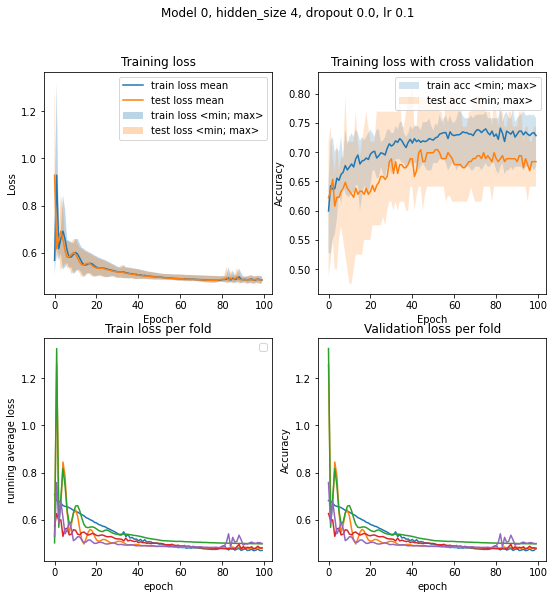

No handles with labels found to put in legend.


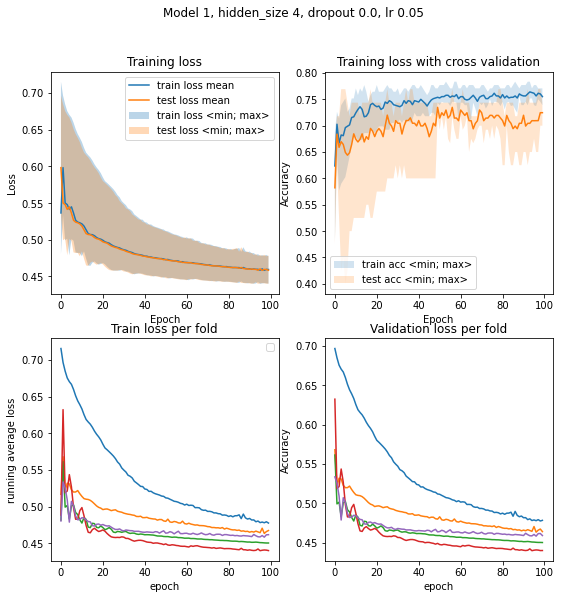

No handles with labels found to put in legend.


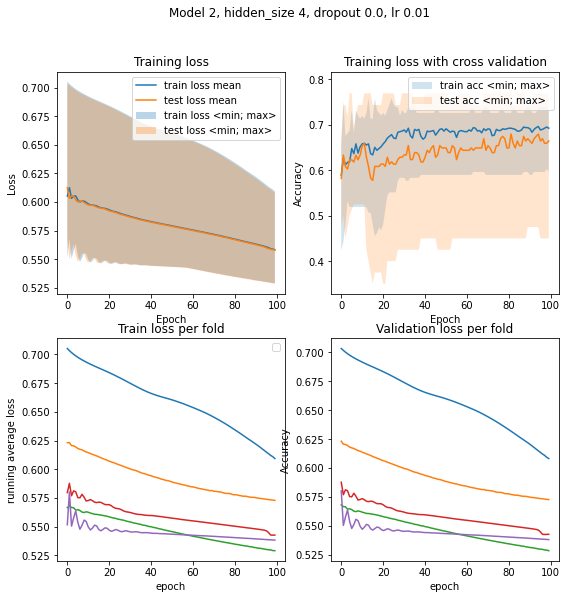

No handles with labels found to put in legend.


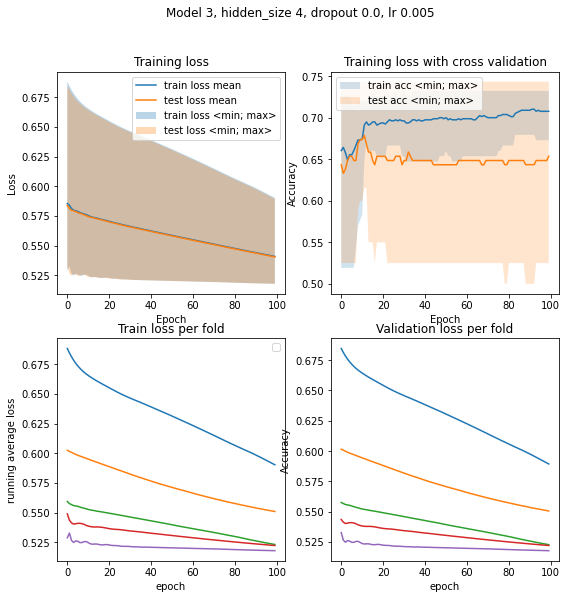

No handles with labels found to put in legend.


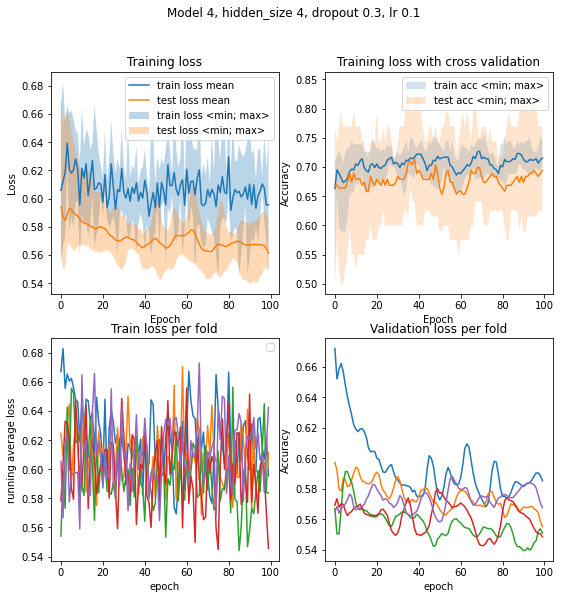

No handles with labels found to put in legend.


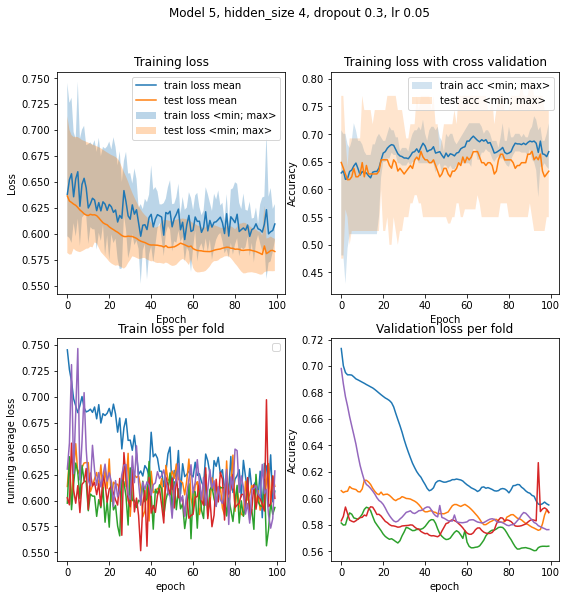

No handles with labels found to put in legend.


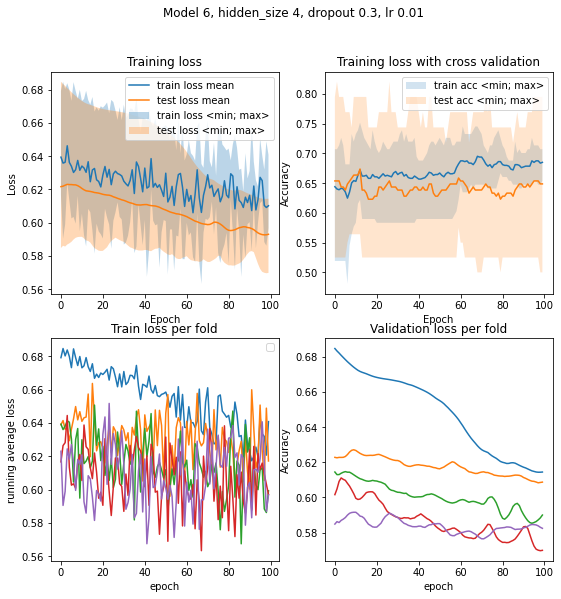

No handles with labels found to put in legend.


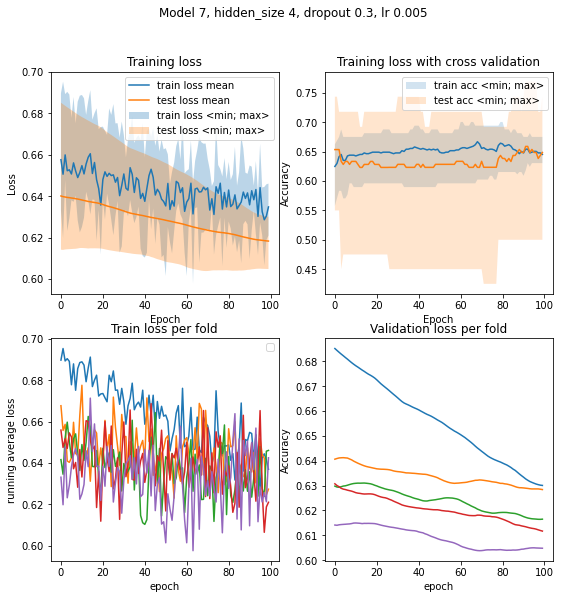

No handles with labels found to put in legend.


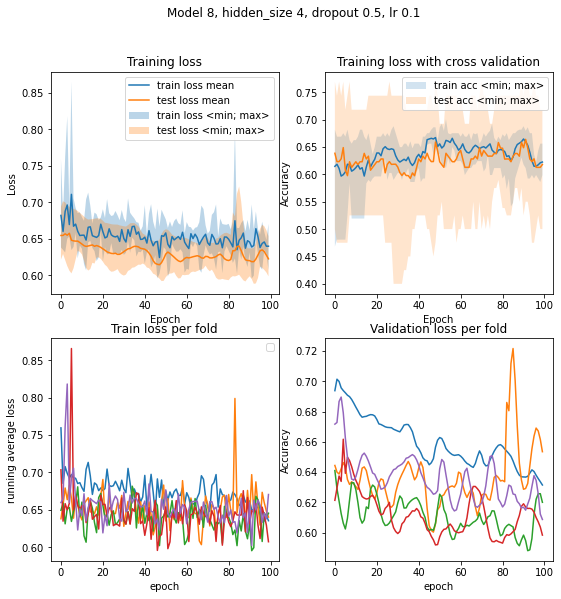

No handles with labels found to put in legend.


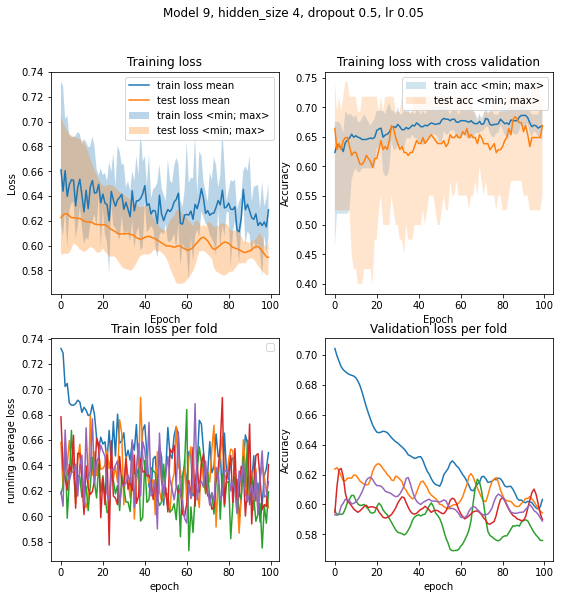

No handles with labels found to put in legend.


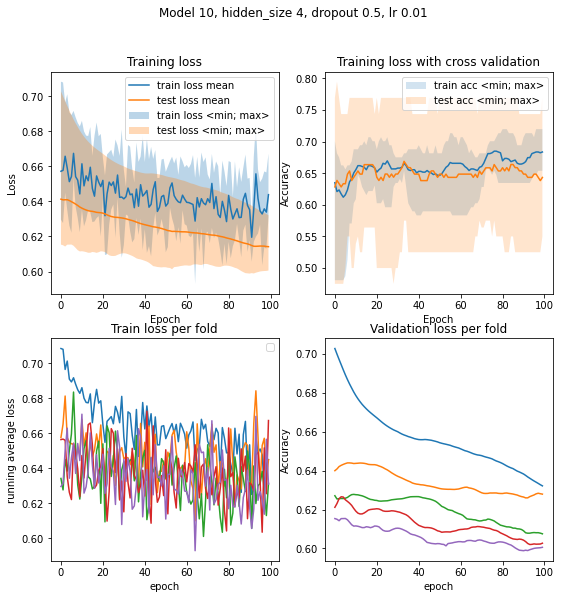

No handles with labels found to put in legend.


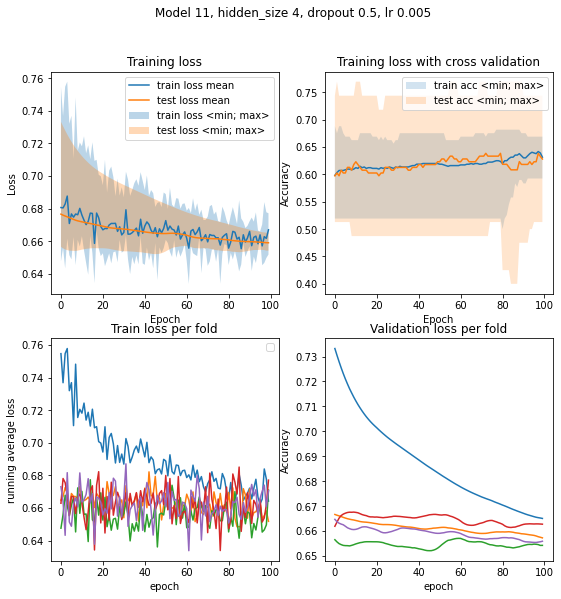

No handles with labels found to put in legend.


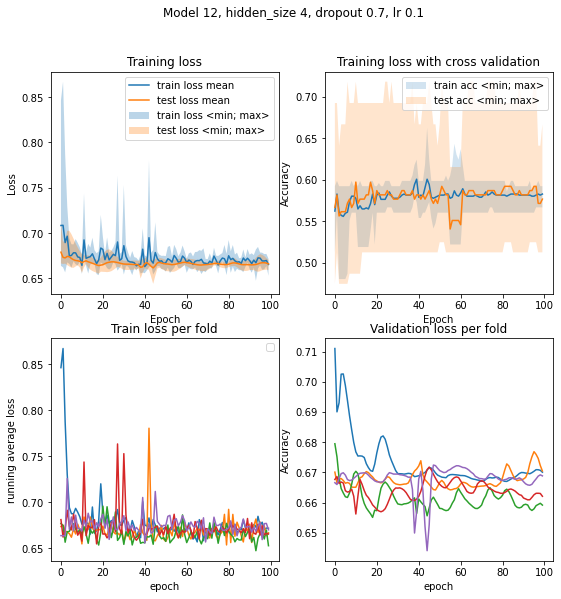

No handles with labels found to put in legend.


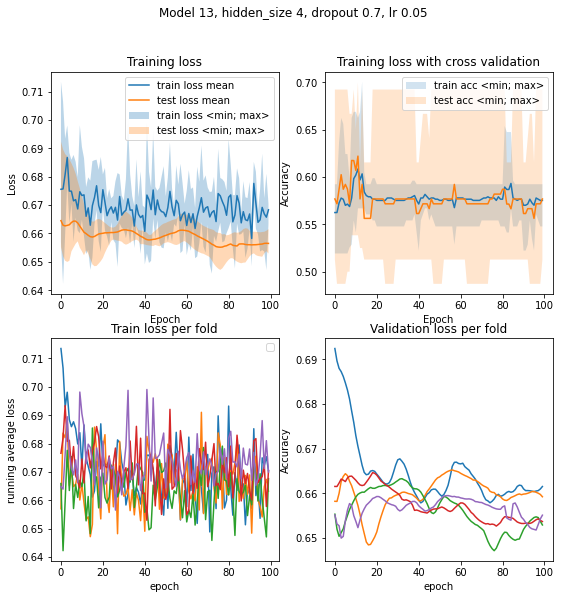

No handles with labels found to put in legend.


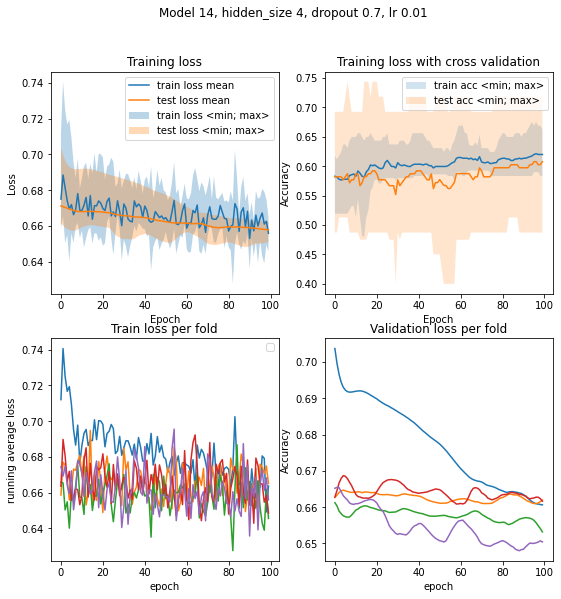

No handles with labels found to put in legend.


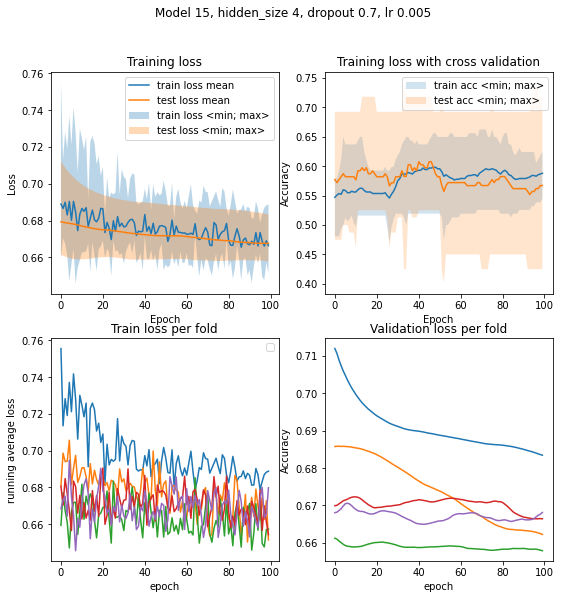

No handles with labels found to put in legend.


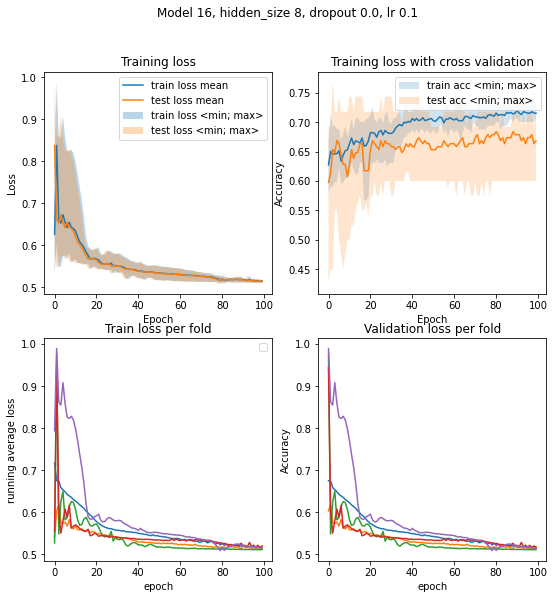

No handles with labels found to put in legend.


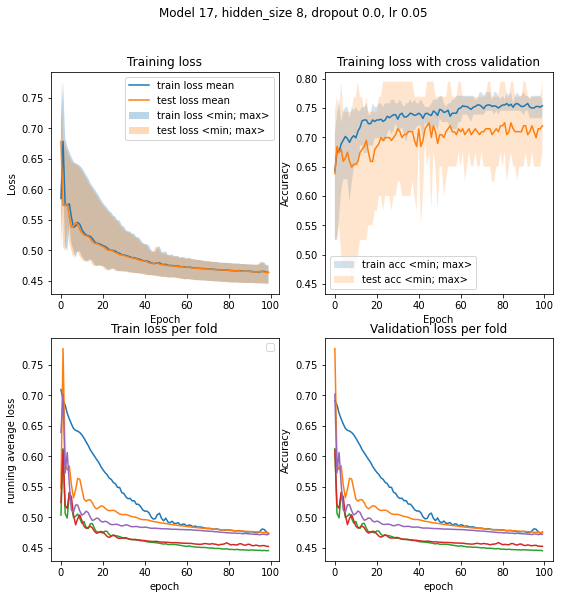

No handles with labels found to put in legend.


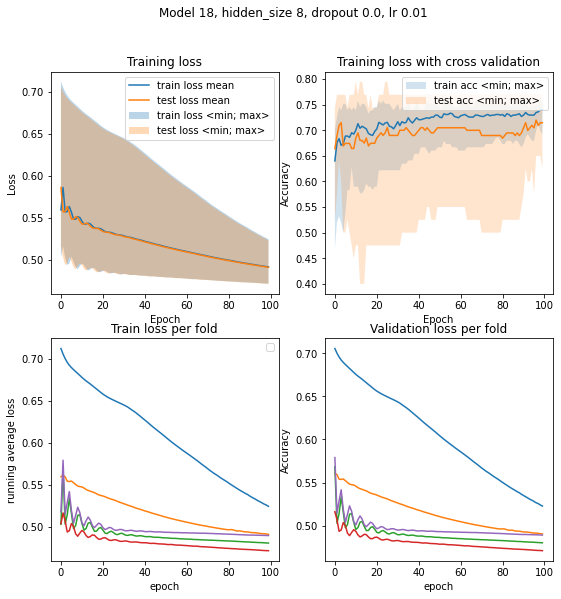

No handles with labels found to put in legend.


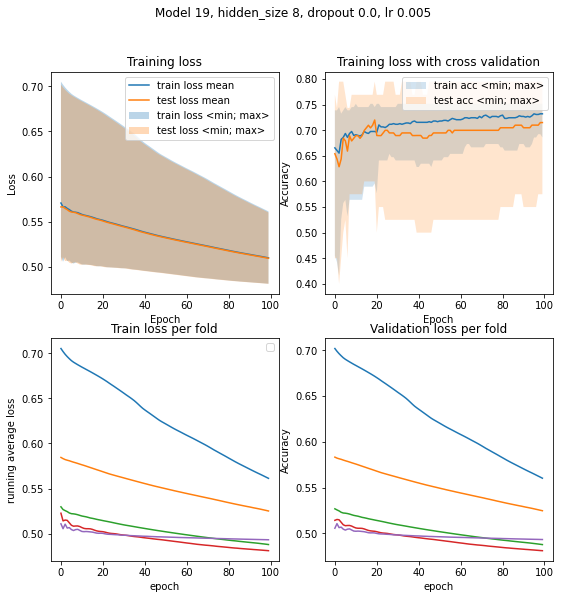

No handles with labels found to put in legend.


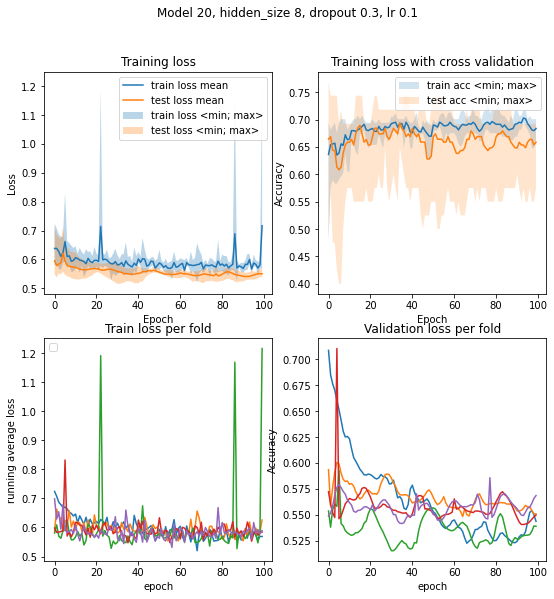

No handles with labels found to put in legend.


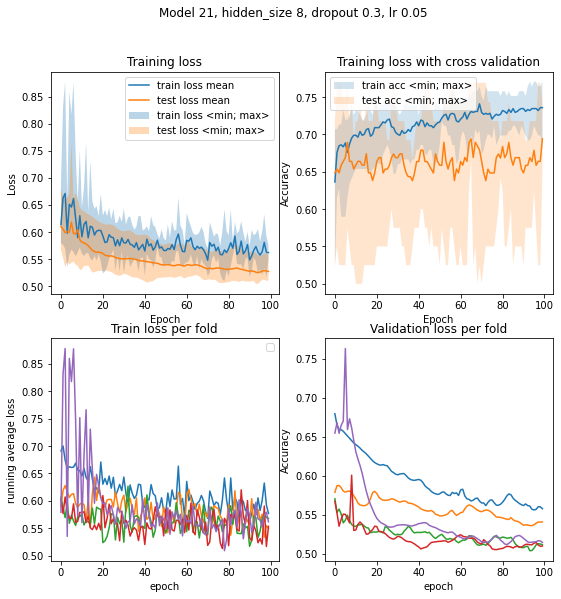

No handles with labels found to put in legend.


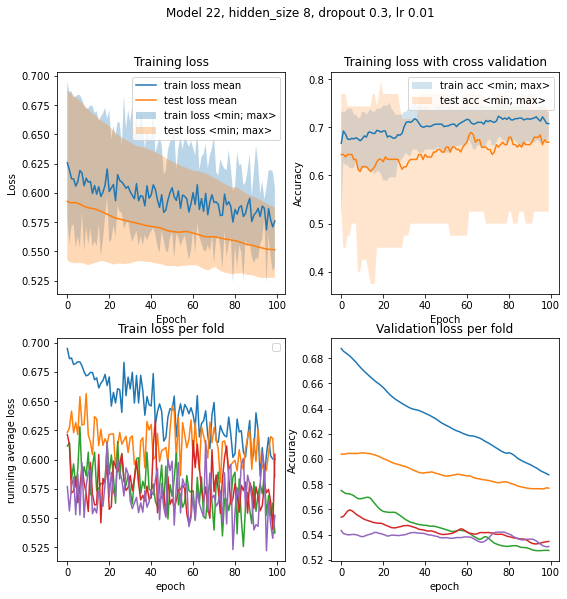

No handles with labels found to put in legend.


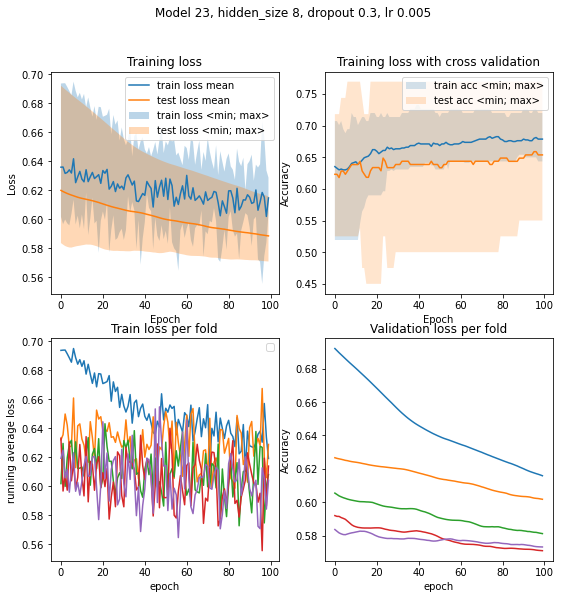

No handles with labels found to put in legend.


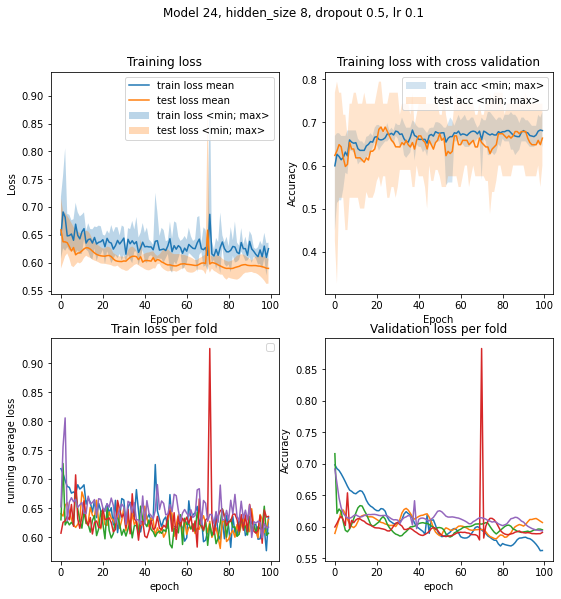

No handles with labels found to put in legend.


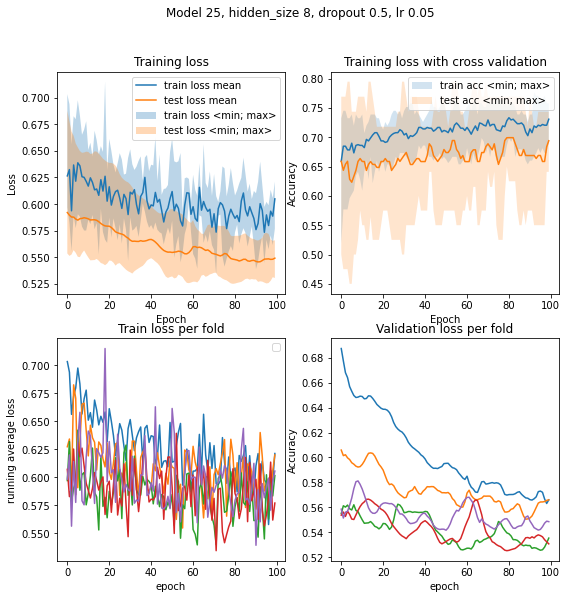

No handles with labels found to put in legend.


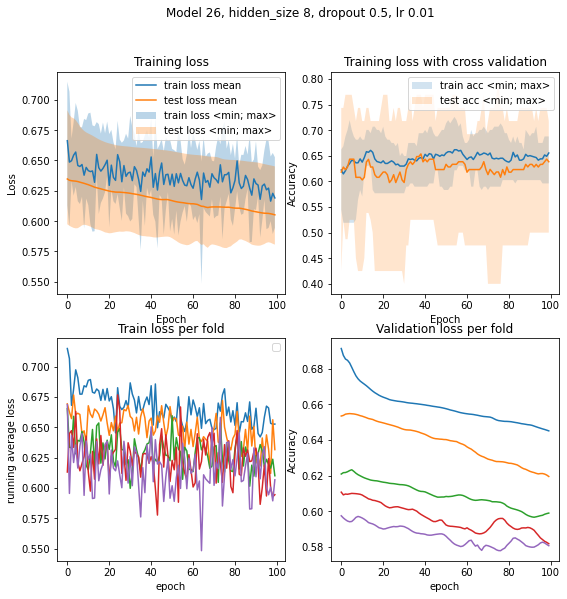

No handles with labels found to put in legend.


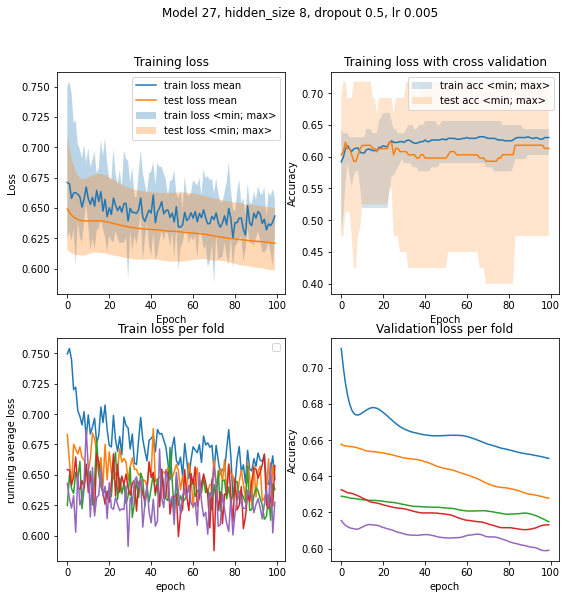

No handles with labels found to put in legend.


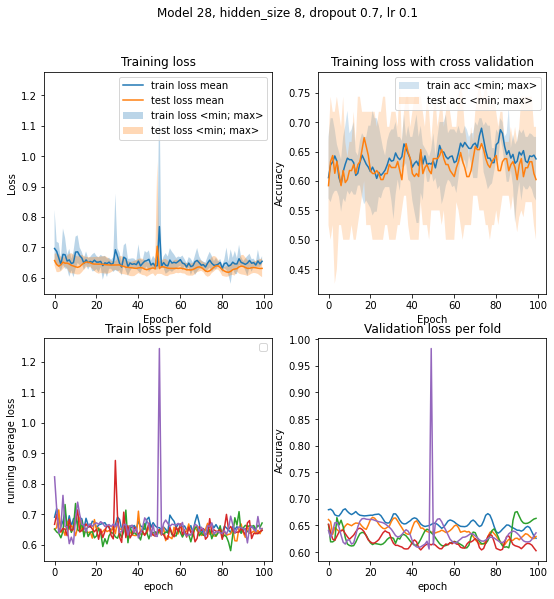

No handles with labels found to put in legend.


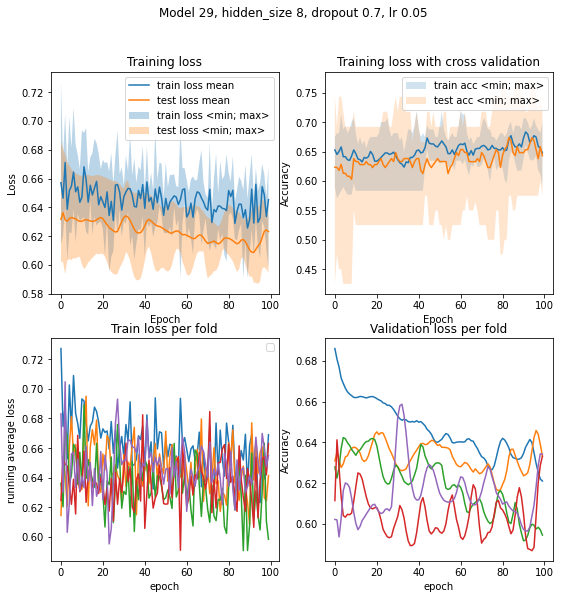

No handles with labels found to put in legend.


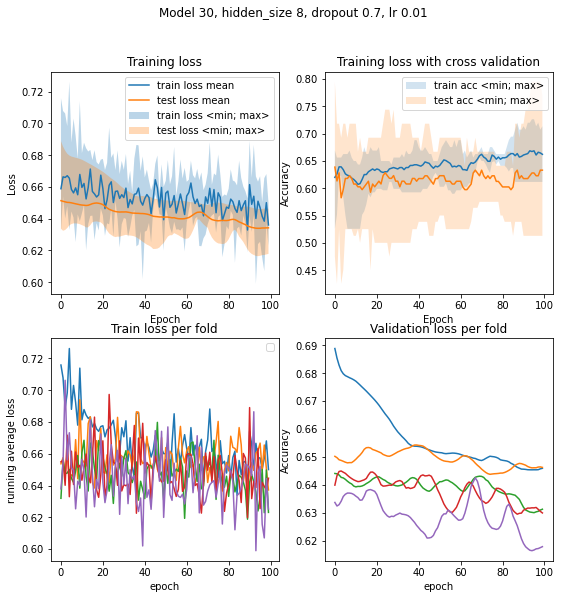

No handles with labels found to put in legend.


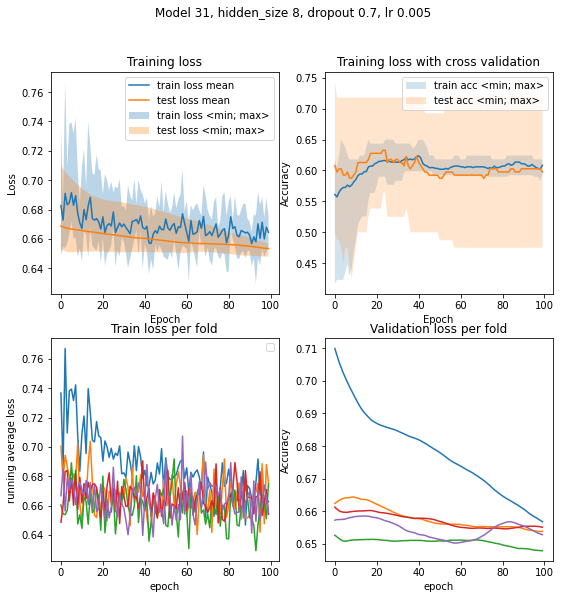

No handles with labels found to put in legend.


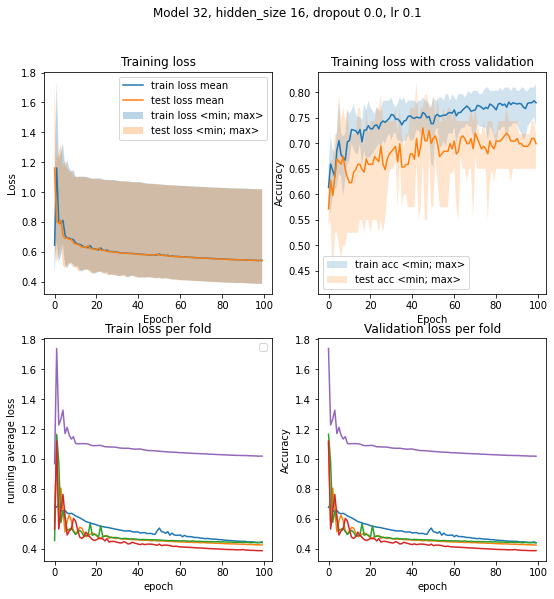

No handles with labels found to put in legend.


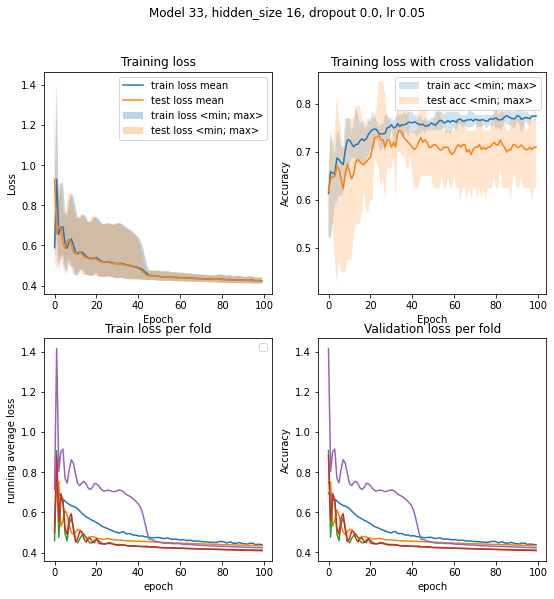

No handles with labels found to put in legend.


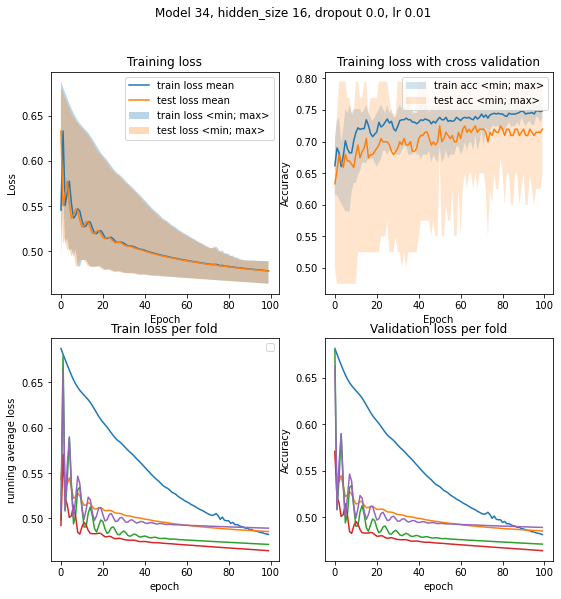

No handles with labels found to put in legend.


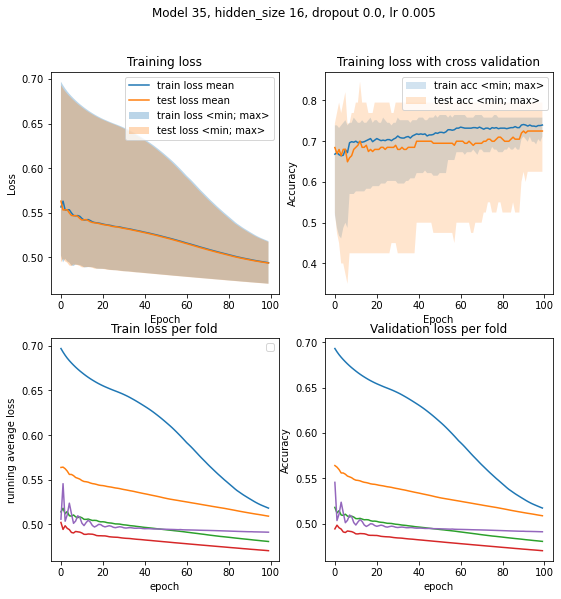

No handles with labels found to put in legend.


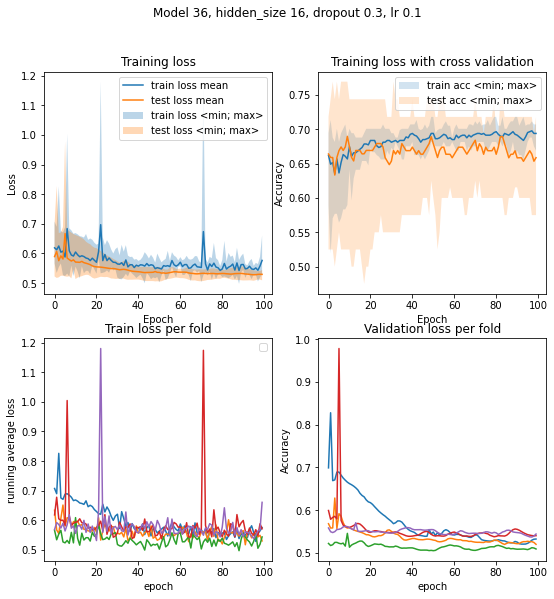

No handles with labels found to put in legend.


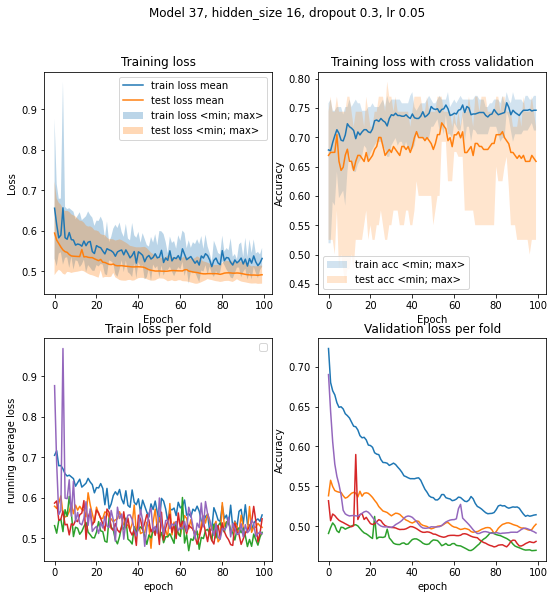

No handles with labels found to put in legend.


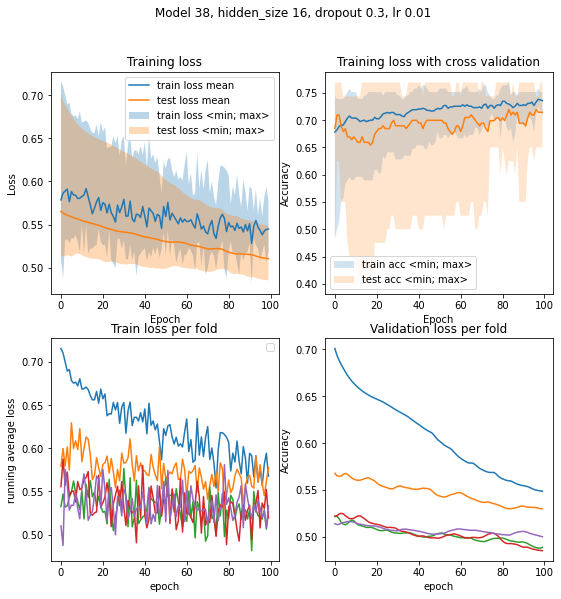

No handles with labels found to put in legend.


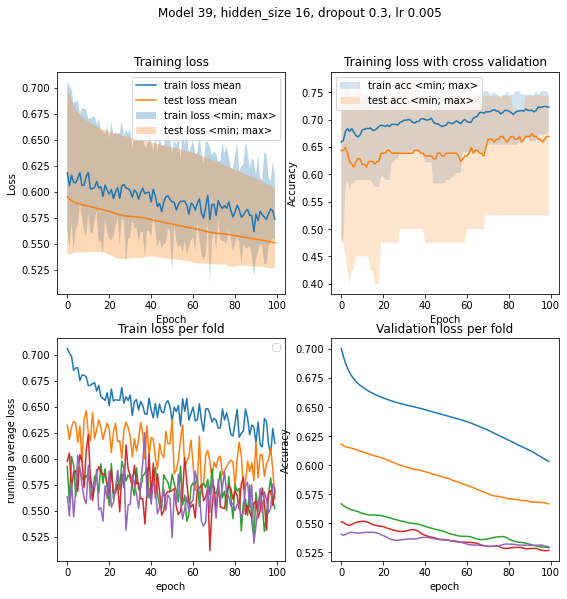

No handles with labels found to put in legend.


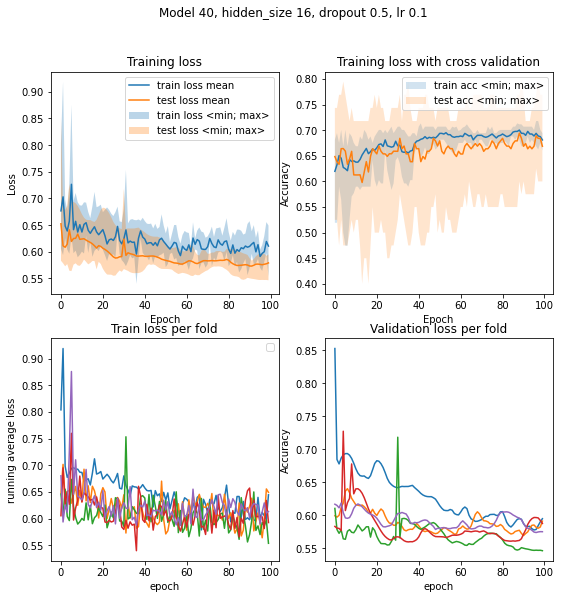

No handles with labels found to put in legend.


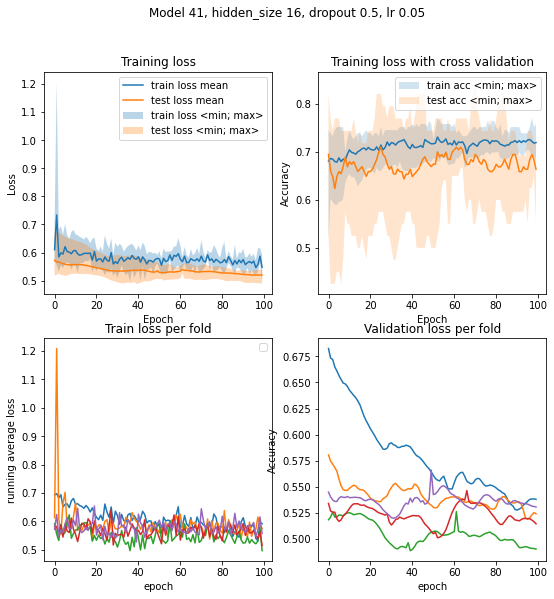

No handles with labels found to put in legend.


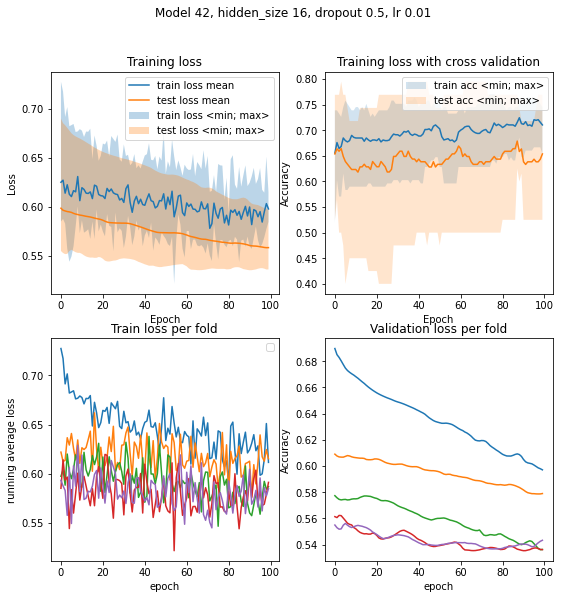

No handles with labels found to put in legend.


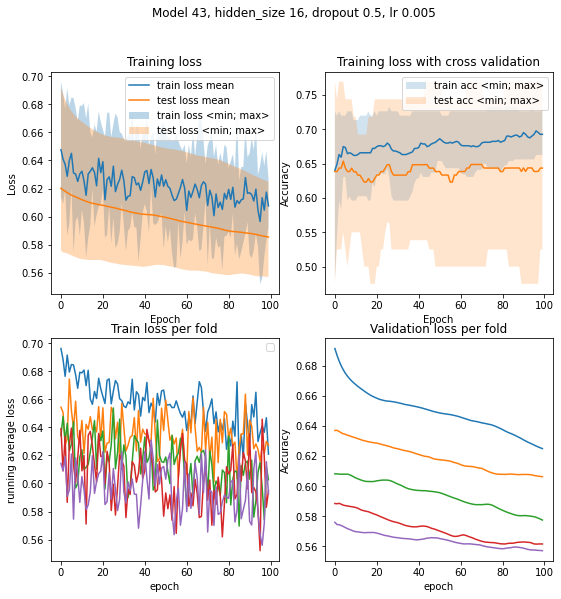

No handles with labels found to put in legend.


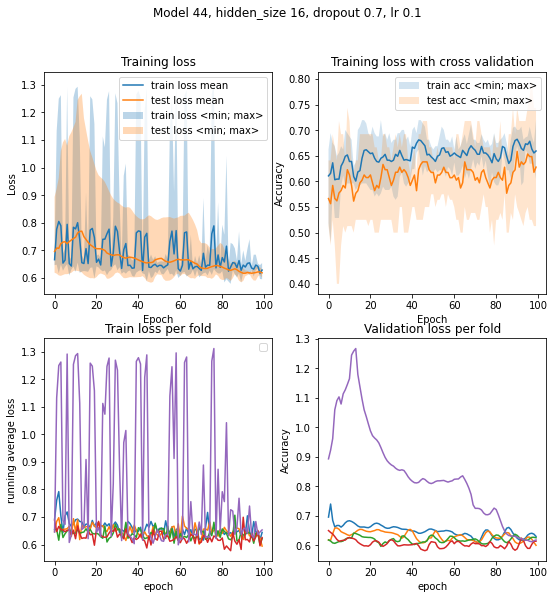

No handles with labels found to put in legend.


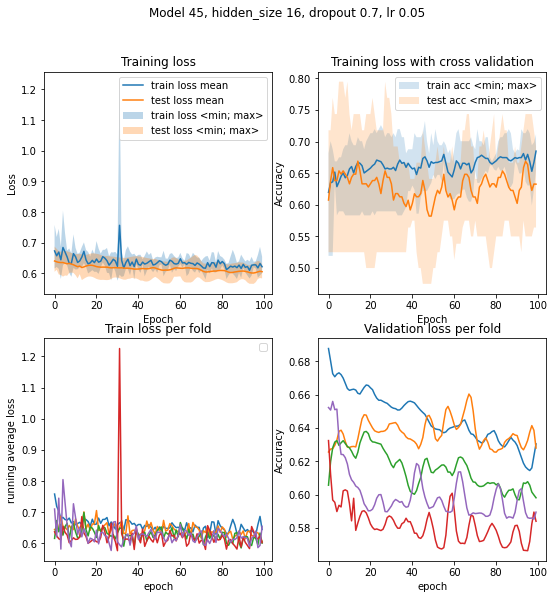

No handles with labels found to put in legend.


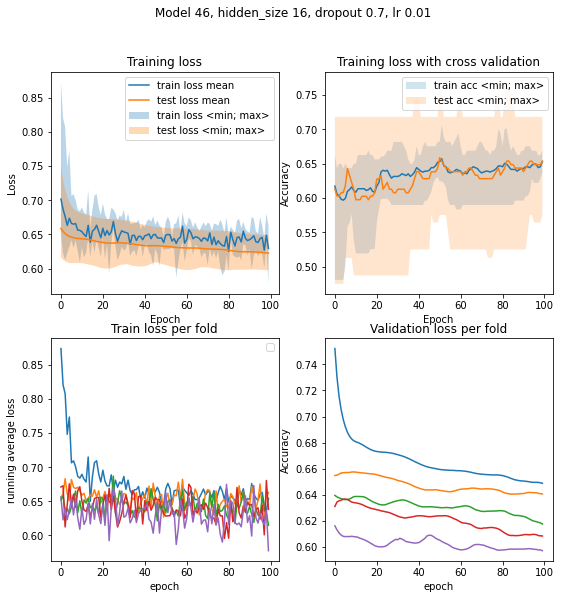

No handles with labels found to put in legend.


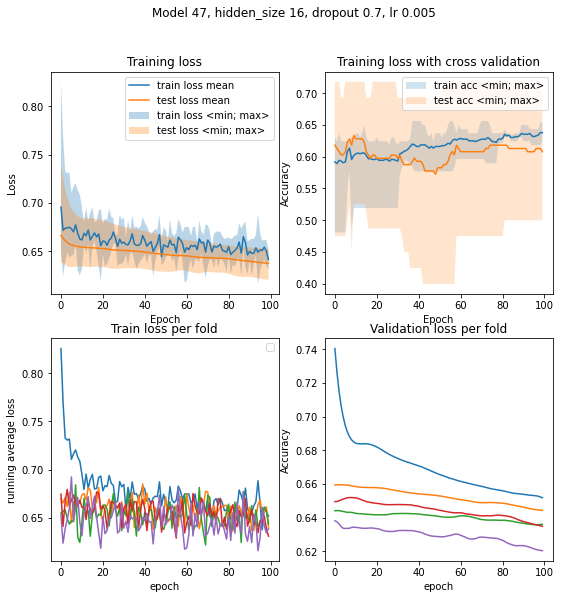

No handles with labels found to put in legend.


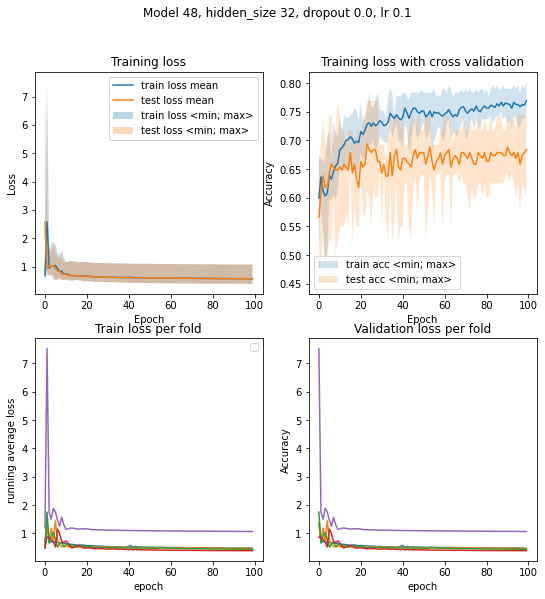

No handles with labels found to put in legend.


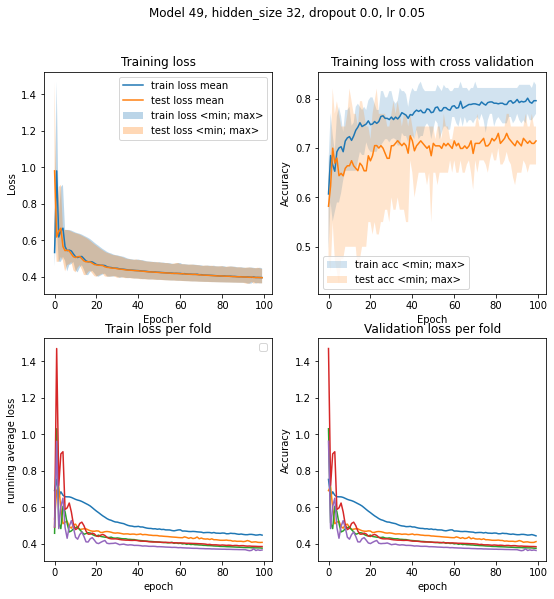

No handles with labels found to put in legend.


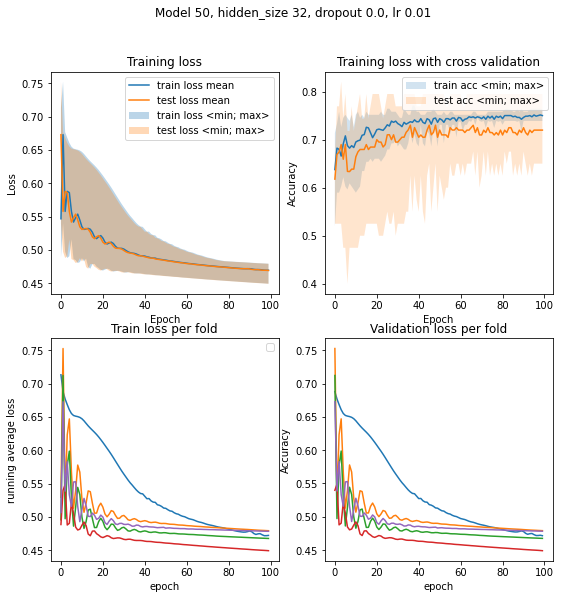

No handles with labels found to put in legend.


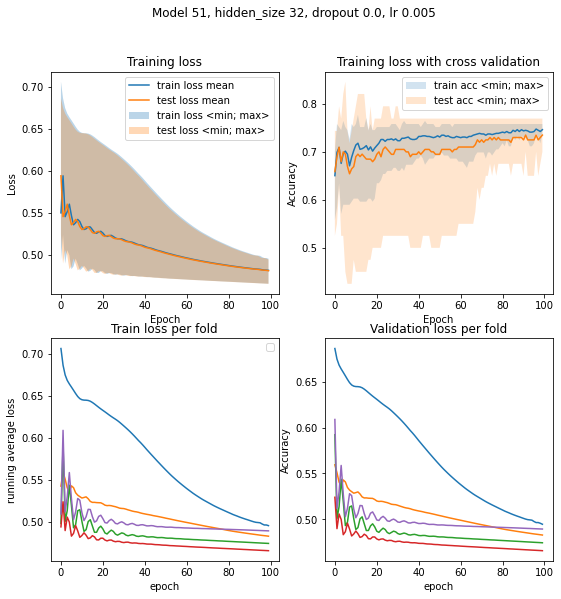

No handles with labels found to put in legend.


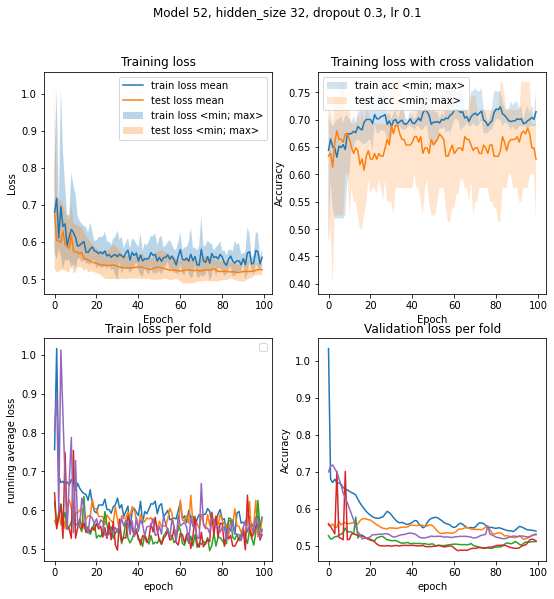

No handles with labels found to put in legend.


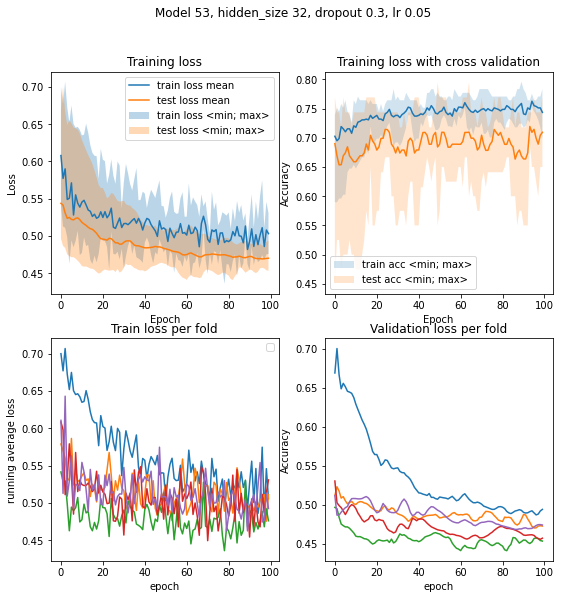

No handles with labels found to put in legend.


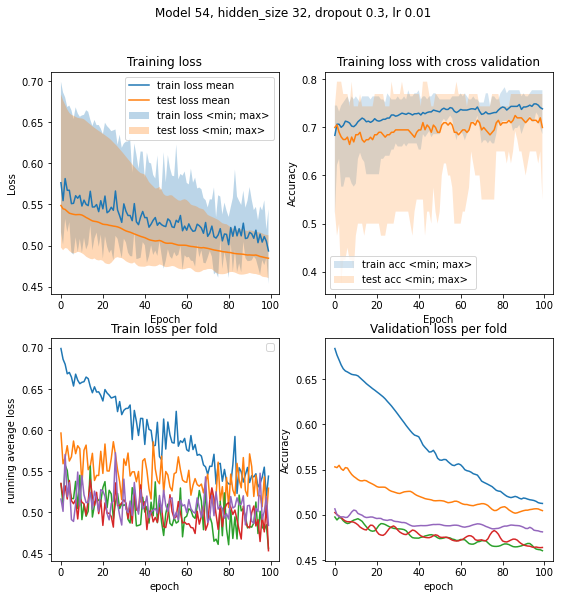

No handles with labels found to put in legend.


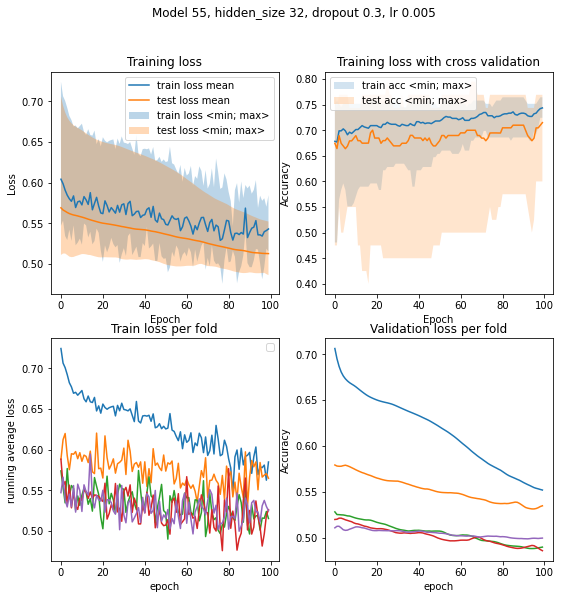

No handles with labels found to put in legend.


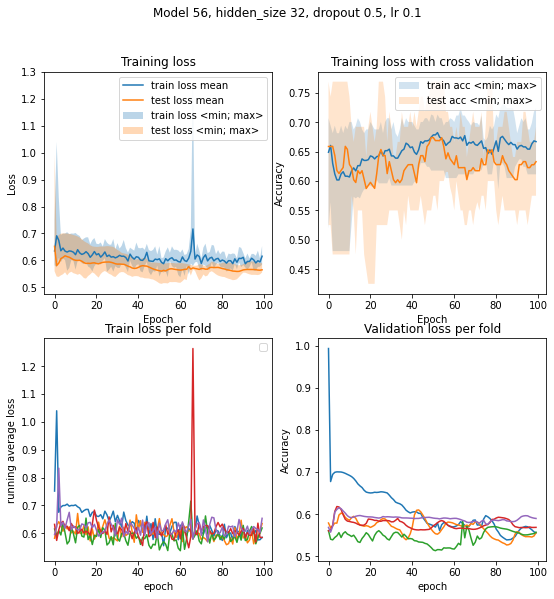

No handles with labels found to put in legend.


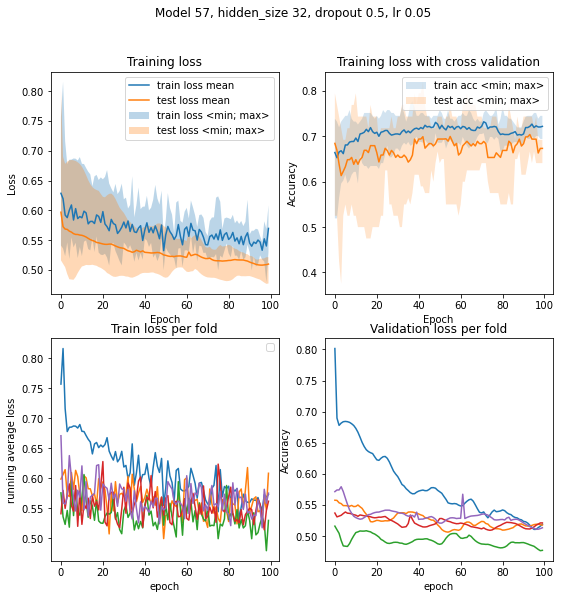

No handles with labels found to put in legend.


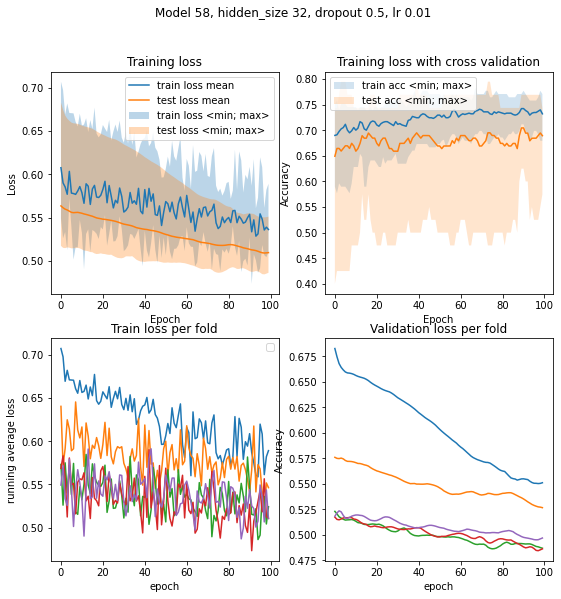

No handles with labels found to put in legend.


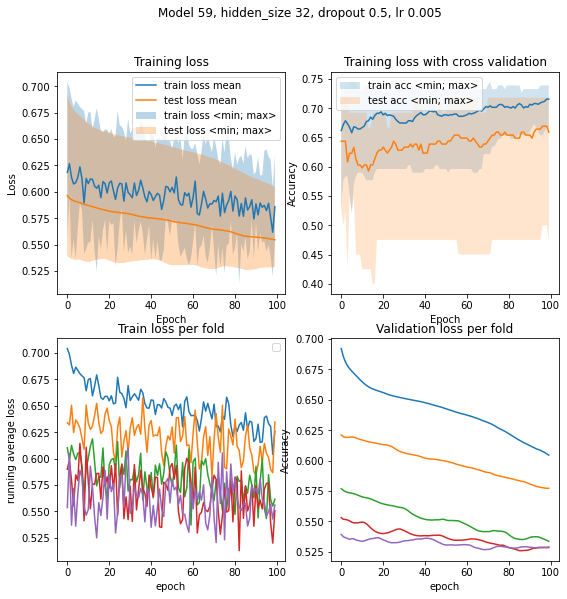

No handles with labels found to put in legend.


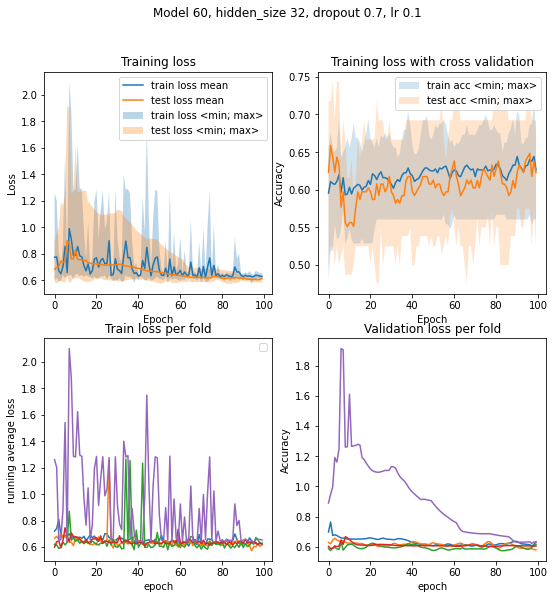

No handles with labels found to put in legend.


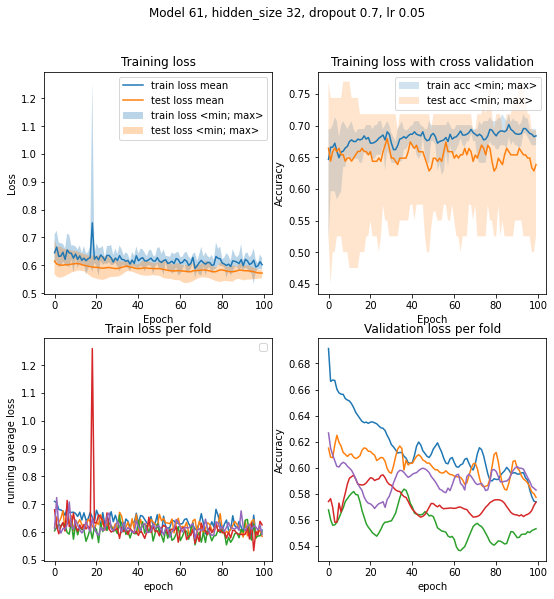

No handles with labels found to put in legend.


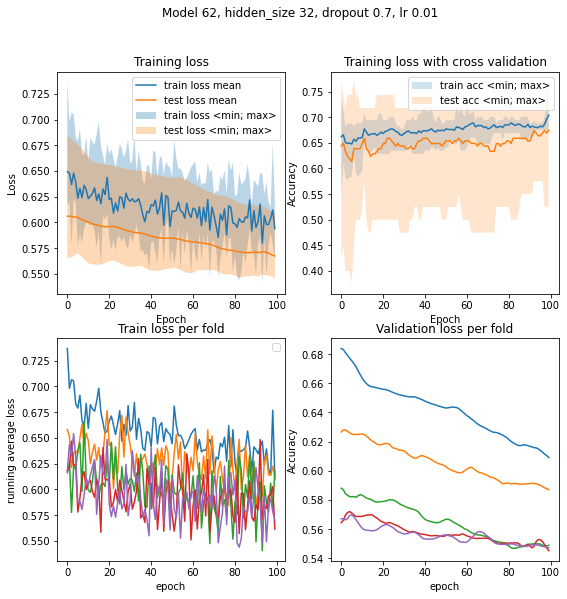

No handles with labels found to put in legend.


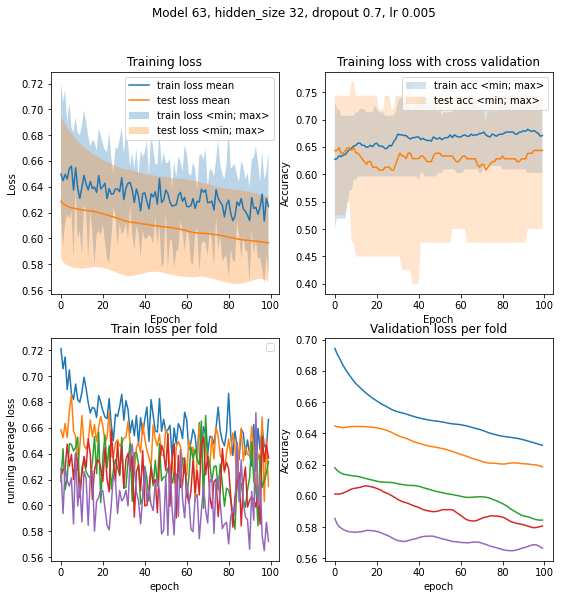

No handles with labels found to put in legend.


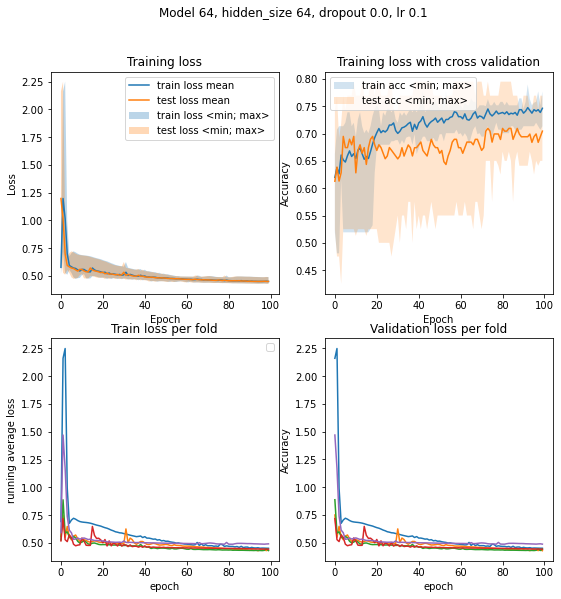

No handles with labels found to put in legend.


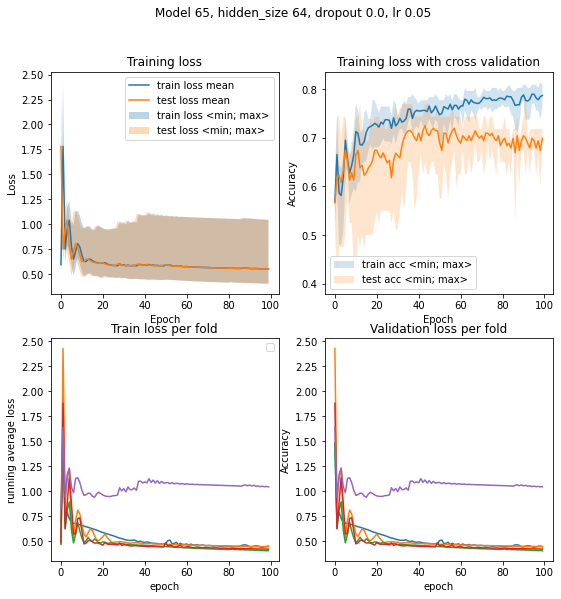

No handles with labels found to put in legend.


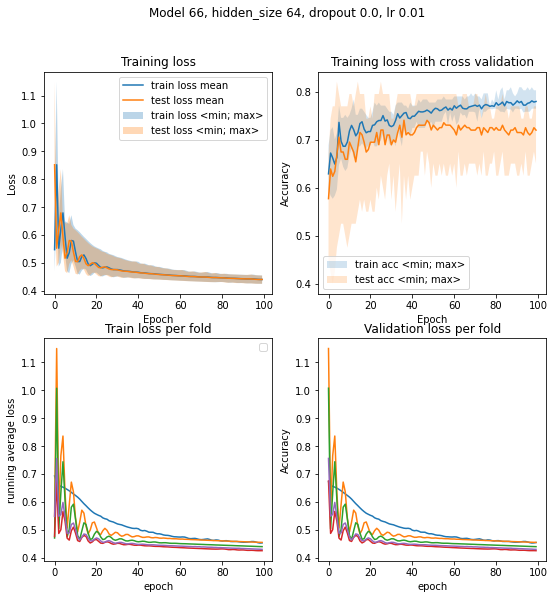

No handles with labels found to put in legend.


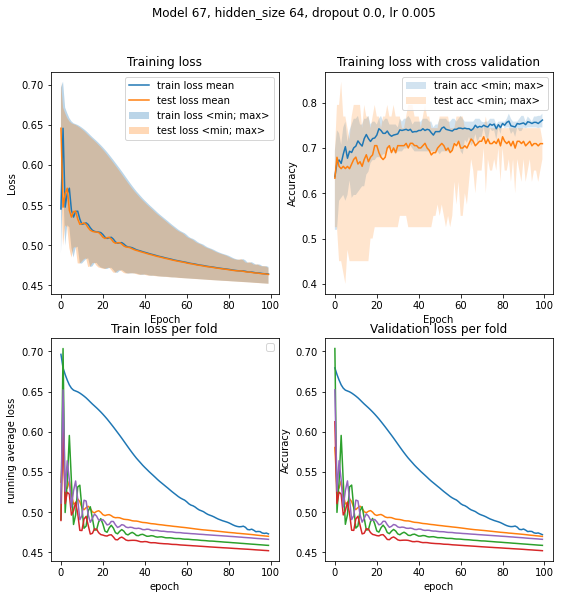

No handles with labels found to put in legend.


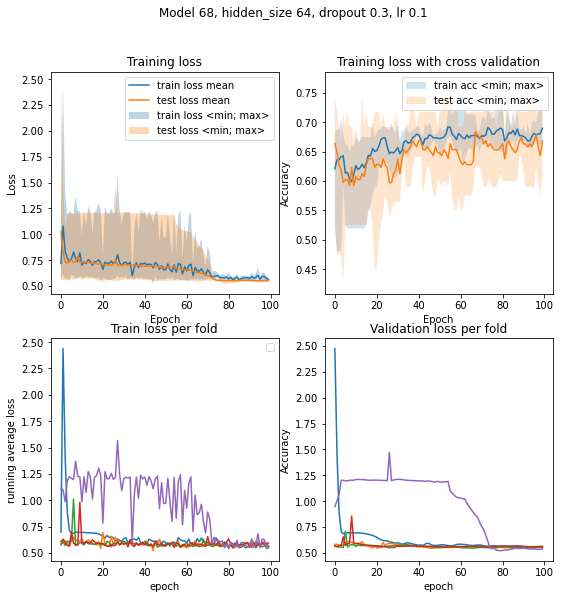

No handles with labels found to put in legend.


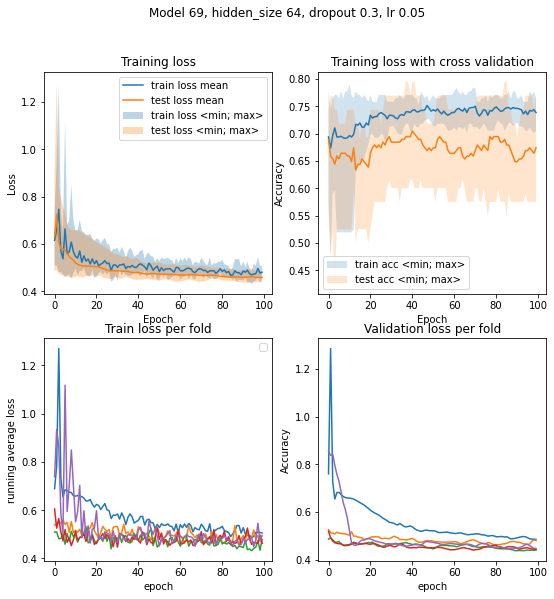

No handles with labels found to put in legend.


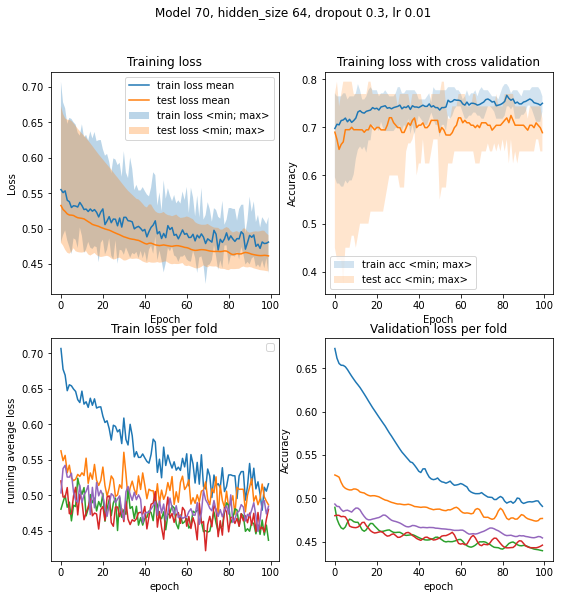

No handles with labels found to put in legend.


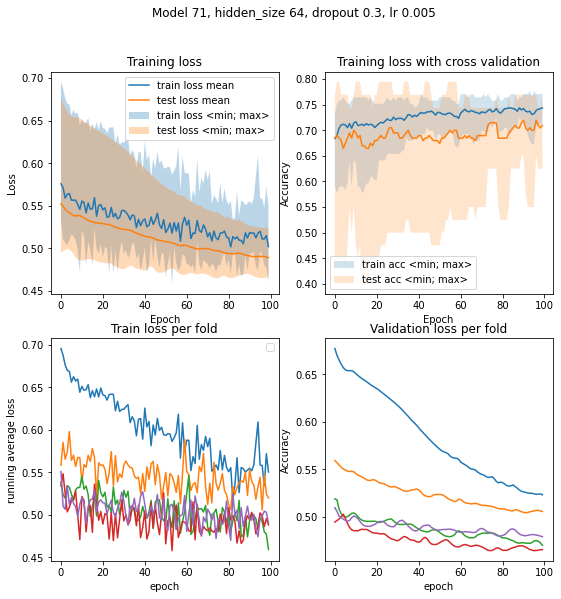

No handles with labels found to put in legend.


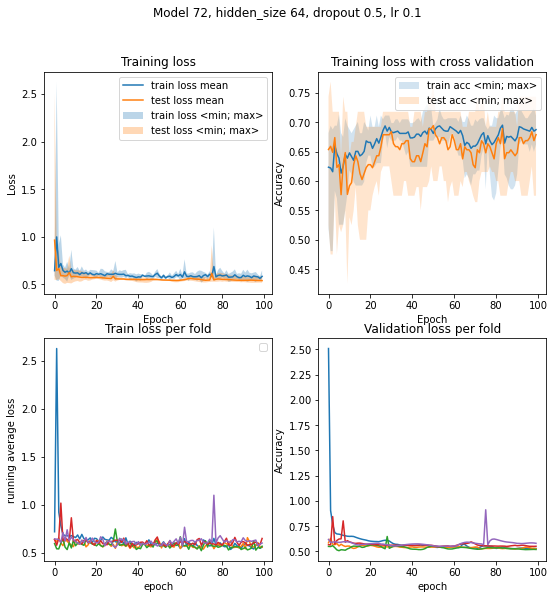

No handles with labels found to put in legend.


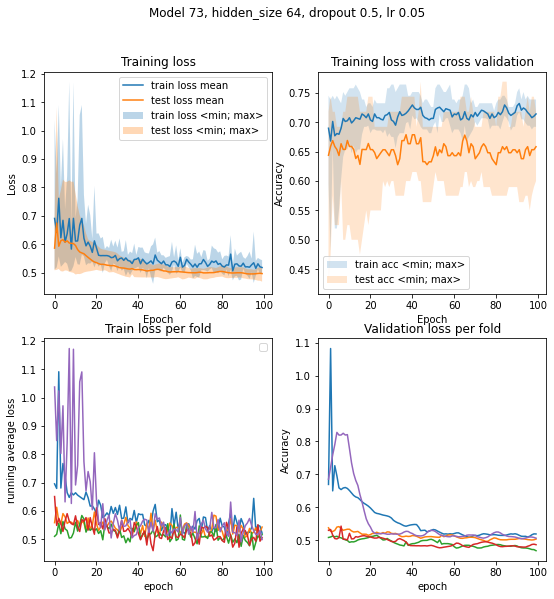

No handles with labels found to put in legend.


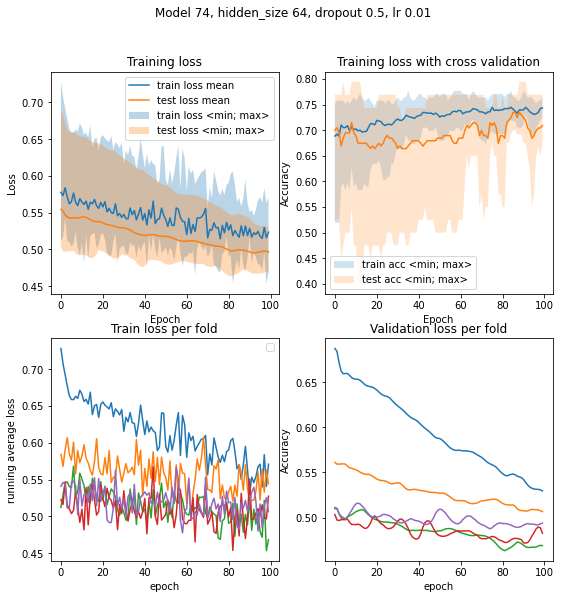

No handles with labels found to put in legend.


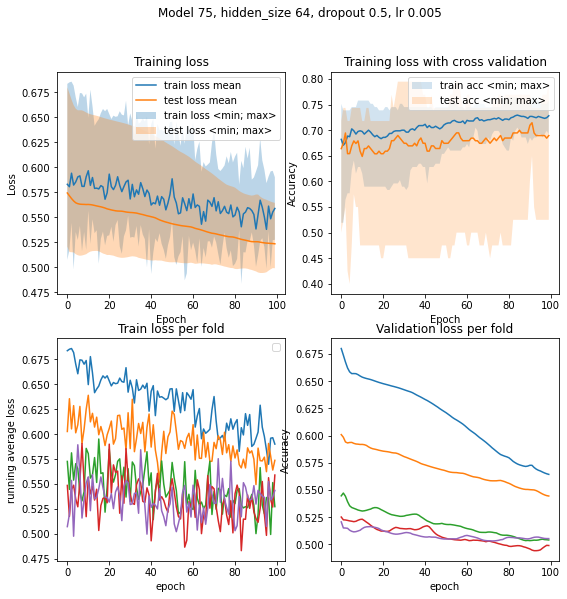

No handles with labels found to put in legend.


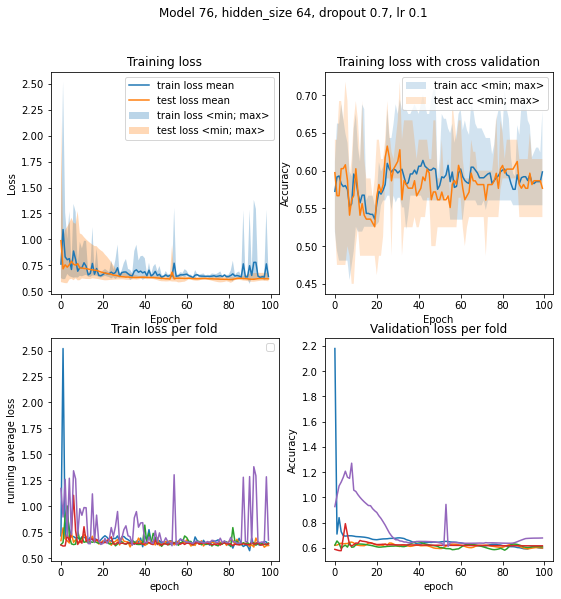

No handles with labels found to put in legend.


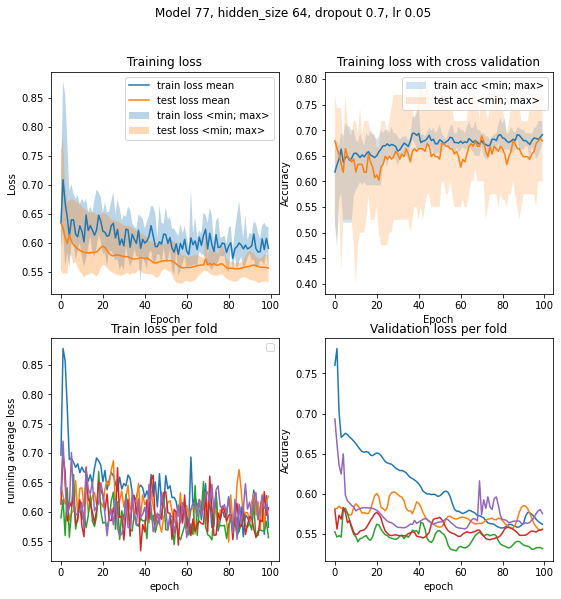

No handles with labels found to put in legend.


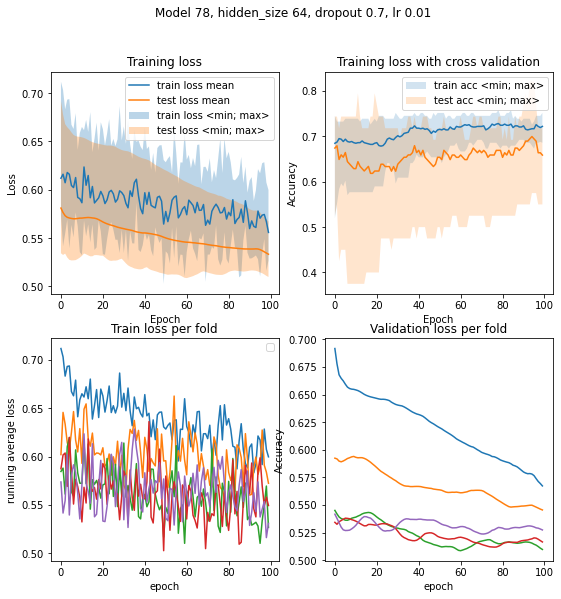

No handles with labels found to put in legend.


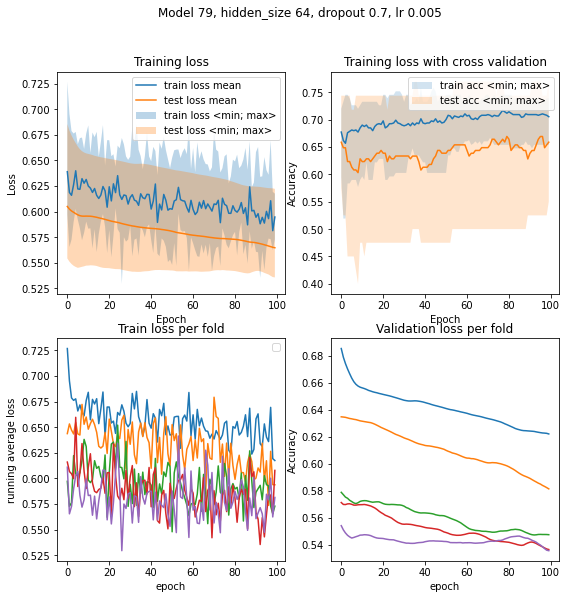

In [10]:
for i, foldperf in enumerate(results):
    train_loss = np.vstack([foldperf[fold]['train_loss'] for fold in foldperf])
    test_loss = np.vstack([foldperf[fold]['test_loss'] for fold in foldperf])
    train_acc = np.vstack([foldperf[fold]['train_acc'] for fold in foldperf])
    test_acc = np.vstack([foldperf[fold]['test_acc'] for fold in foldperf])
    
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(9, 9))
    fig.suptitle(f'Model {i}, hidden_size {model_params[i][0]}, dropout {model_params[i][1]}, lr {model_params[i][2]}')
    ax1.set_xlabel("Epoch")
    ax1.set_ylabel("Loss")
    ax1.title.set_text('Training loss')
    ax1.fill_between(range(num_epochs), train_loss.min(0), train_loss.max(0), alpha=0.3, label="train loss <min; max>")
    ax1.fill_between(range(num_epochs), test_loss.min(0), test_loss.max(0), alpha=0.3, label="test loss <min; max>")

    ax1.plot(range(num_epochs), train_loss.mean(0), label='train loss mean')
    ax1.plot(range(num_epochs), test_loss.mean(0), label='test loss mean')
    ax1.legend()
    
    
    
    ax2.title.set_text("Training loss with cross validation")
    ax2.set_xlabel("Epoch")
    ax2.set_ylabel("Accuracy")
    ax2.fill_between(range(num_epochs), train_acc.min(0), train_acc.max(0), alpha=0.2, label="train acc <min; max>")
    ax2.fill_between(range(num_epochs), test_acc.min(0), test_acc.max(0), alpha=0.2, label="test acc <min; max>")

    ax2.plot(range(num_epochs), train_acc.mean(0))

    ax2.plot(range(num_epochs), test_acc.mean(0))
    ax2.legend()

    
    
    ax3.title.set_text('Train loss per fold')
    for l in train_loss:
        ax3.plot(l)
#     for l in train_loss:
#         ax3.plot(l, 'b-', alpha=0.5)
#     for l in test_loss:
#         ax3.plot(l, 'r-', alpha=0.5)
#     ax3.plot(np.convolve(train_loss.mean(0), np.ones(20)/20, mode='valid'), label='train loss')
#     ax3.plot(np.convolve(test_loss.mean(0), np.ones(20)/20, mode='valid'), label='test loss')
    ax3.set_xlabel('epoch')
    ax3.set_ylabel('running average loss')

    ax3.legend()
    
    ax4.title.set_text('Validation loss per fold')
    for l in test_loss:
        ax4.plot(l)
#     ax3.plot(np.convolve(train_loss.mean(0), np.ones(20)/20, mode='valid'), label='train loss')
#     ax3.plot(np.convolve(test_loss.mean(0), np.ones(20)/20, mode='valid'), label='test loss')
    ax4.set_xlabel('epoch')
    ax4.set_ylabel('Accuracy')
    plt.show()


In [11]:
accs = []
for i, foldperf in enumerate(results):
    accs.append(np.vstack([foldperf[fold]['test_acc'][-1] for fold in foldperf]).mean(0))
best_params = model_params[np.asarray(accs).argmax()]



In [12]:
hidden_size, dropout, lr = best_params
model = RGCN(hidden_size, dropout, num_edge_types)

train_loader = GraphDataLoader(train_graphs, batch_size=1000)
# test_loader = GraphDataLoader(train_graphs, batch_size=1000)

optimizer = torch.optim.Adam(model.parameters(), lr=lr)
history = {'train_loss': [], 'test_loss': [],'train_acc':[],'test_acc':[]}
train_loss = []
train_acc = []

for epoch in range(num_epochs):
    loss = train(model,train_loader,optimizer)
    acc = evaluate(model, train_loader)



    train_loss.append(loss)
    train_acc.append(acc)


C:\Users\ondra\anaconda3\envs\cp\lib\site-packages\torch\autocast_mode.py:141: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


<Figure size 432x288 with 0 Axes>

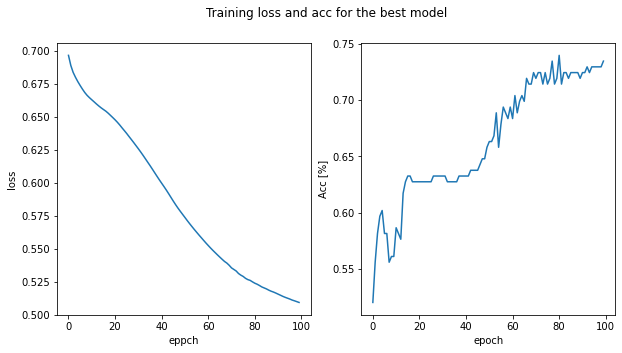

In [15]:
plt.figure()
fig, (ax1, ax2) = plt.subplots(1,2,figsize=(10, 5))
plt.suptitle('Training loss and acc for the best model')
ax1.set_xlabel('eppch')
ax1.set_ylabel('loss')
ax1.plot(train_loss)

ax2.set_xlabel('epoch')
ax2.set_ylabel('Acc [%]')
ax2.plot(train_acc)

plt.show()

In [16]:
###### test_loader = GraphDataLoader(test_graphs, batch_size=1000)

print('best params: hidden size {}, dropout {}, Adam learning rate{}'.format(*best_params))
acc = evaluate(model, test_loader)
print(f'Model test acc is {acc*100}%')

best params: hidden size 32, dropout 0.0, Adam learning rate0.005
Model test acc is 76.92307692307693%
